# XSens DOT Data 3

In [1]:
import numpy as np
import ezc3d
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from keras.utils import to_categorical
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import classification_report
import os
import math

# Load and preprocess sensor data
left_wrist_data = pd.read_csv('DOT Data 3/leftwrist.csv')
right_wrist_data = pd.read_csv('DOT Data 3/rightwrist.csv')
left_elbow_data = pd.read_csv('DOT Data 3/leftelbow.csv')
right_elbow_data = pd.read_csv('DOT Data 3/rightelbow.csv')
left_shoulder_data = pd.read_csv('DOT Data 3/leftshoulder.csv')
right_shoulder_data = pd.read_csv('DOT Data 3/rightshoulder.csv')


## Left Wrist

In [2]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_wrist_data['m'] = magnitude(left_wrist_data)
left_wrist_data.head()

,SampleTimeFine,Quat_W,Quat_X,Quat_Y,Quat_Z,FreeAcc_X,FreeAcc_Y,FreeAcc_Z,Status,m
0,6359206,0.8728,-0.3568,0.1676,-0.2878,-0.1399,-0.2273,0.0859,0,0.488083
1,6359706,0.8694,-0.3613,0.1706,-0.2906,0.0788,0.0941,-0.0489,0,0.494055
2,6360206,0.8686,-0.3609,0.1726,-0.2925,-0.0584,-0.0094,0.0497,0,0.495576
3,6360707,0.8679,-0.3605,0.1743,-0.2940,0.0564,-0.0300,-0.0669,0,0.496766
4,6361207,0.8673,-0.3600,0.1759,-0.2953,0.0356,-0.0567,0.0274,0,0.497738


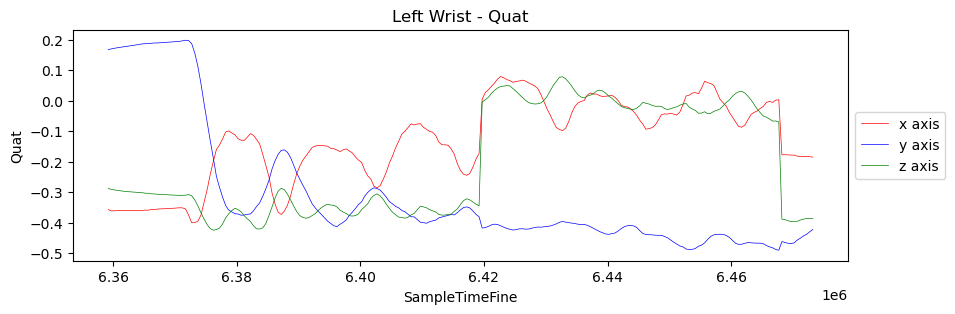

In [3]:
plt.figure(figsize=(10,3))
plt.title('Left Wrist - Quat')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

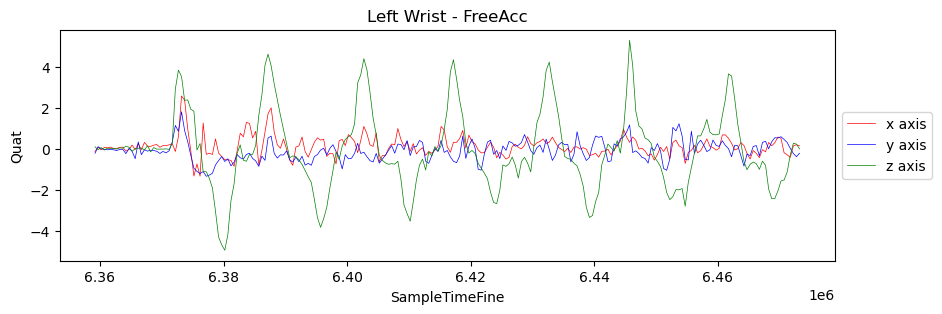

In [4]:
plt.figure(figsize=(10,3))
plt.title('Left Wrist - FreeAcc')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

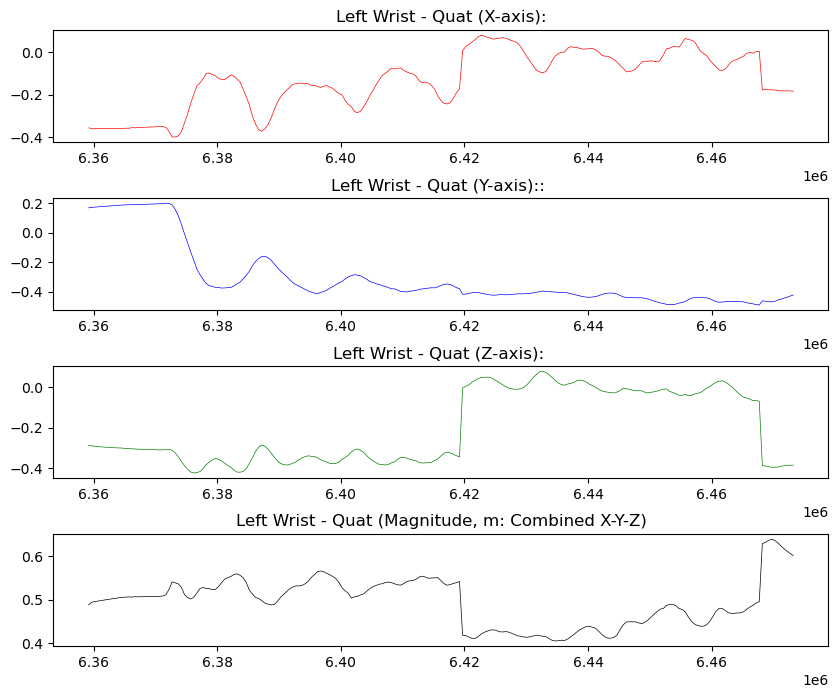

In [5]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - Quat (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - Quat (Y-axis):: ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - Quat (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

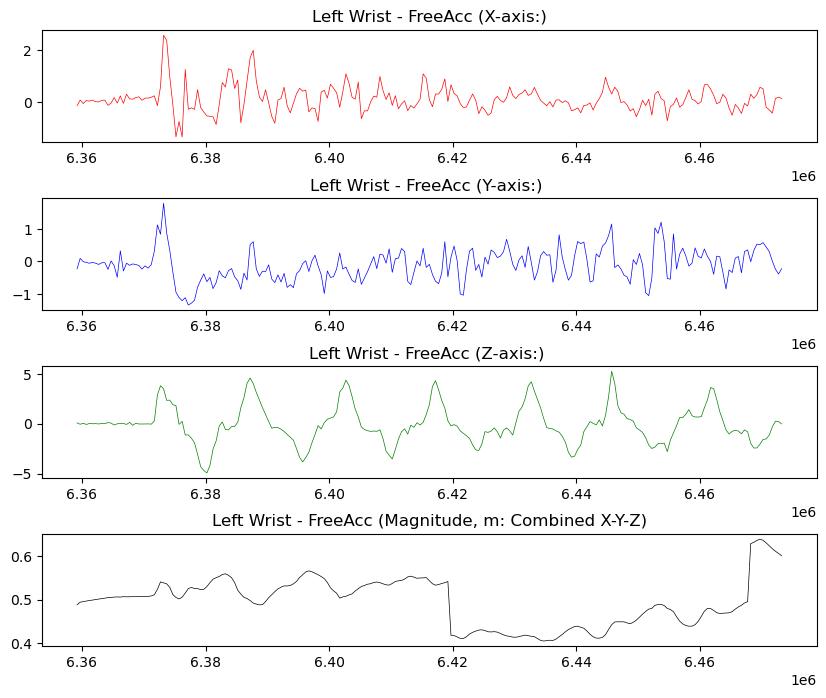

In [6]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - FreeAcc (X-axis:)')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Wrist 

In [7]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_wrist_data['m'] = magnitude(right_wrist_data)
right_wrist_data.head()

,SampleTimeFine,Quat_W,Quat_X,Quat_Y,Quat_Z,FreeAcc_X,FreeAcc_Y,FreeAcc_Z,Status,m
0,6282476,0.9250,0.2485,0.0811,0.2758,-0.0376,-0.0066,-0.4554,0.0,0.379994
1,6282643,0.9249,0.2486,0.0813,0.2759,-0.0110,0.0016,-0.4787,0.0,0.380174
2,6283143,0.9248,0.2489,0.0813,0.2759,0.0052,-0.0158,-0.4906,0.0,0.380370
3,6283643,0.9247,0.2492,0.0811,0.2760,-0.0010,0.0052,-0.4481,0.0,0.380597
4,6284143,0.9246,0.2493,0.0809,0.2766,-0.0366,-0.0314,-0.4884,0.0,0.381055


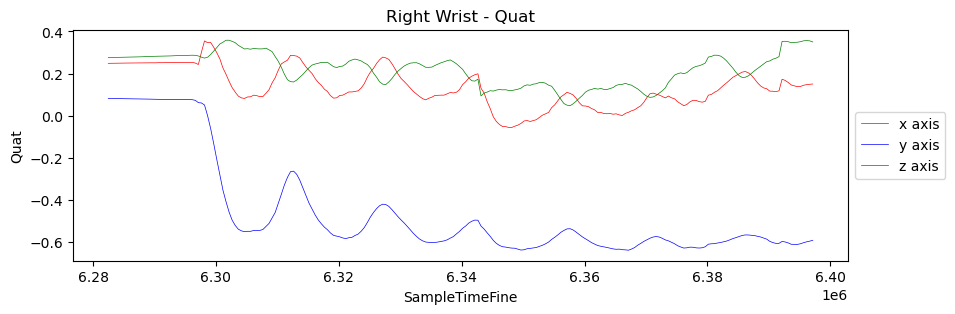

In [8]:
plt.figure(figsize=(10,3))
plt.title('Right Wrist - Quat')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

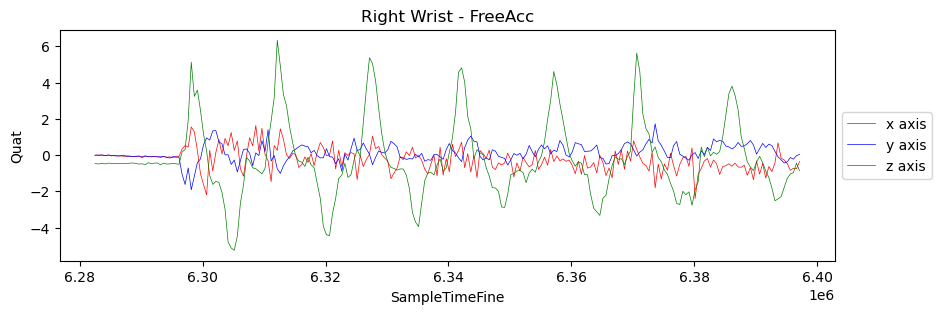

In [9]:
plt.figure(figsize=(10,3))
plt.title('Right Wrist - FreeAcc')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

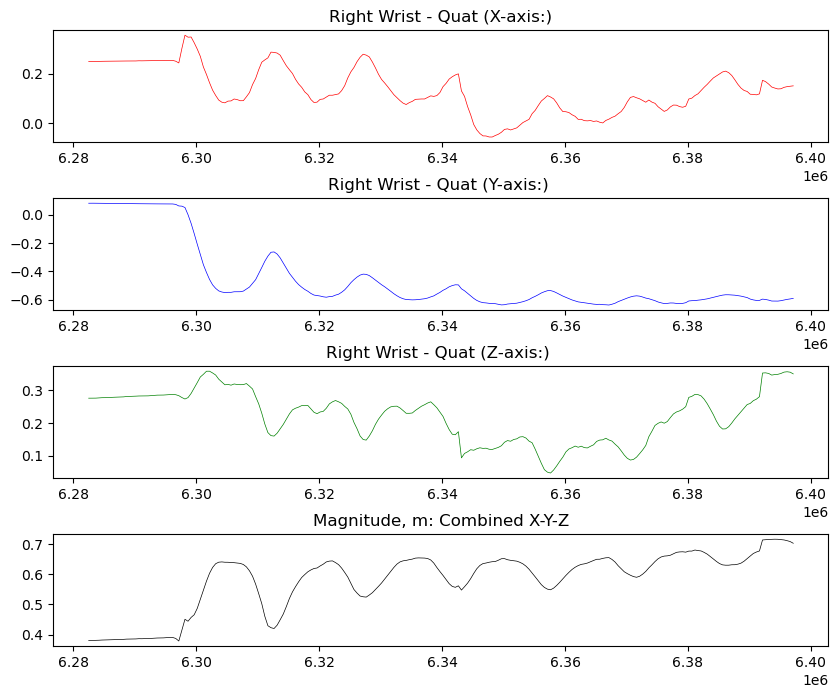

In [10]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - Quat (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - Quat (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - Quat (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Magnitude, m: Combined X-Y-Z')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

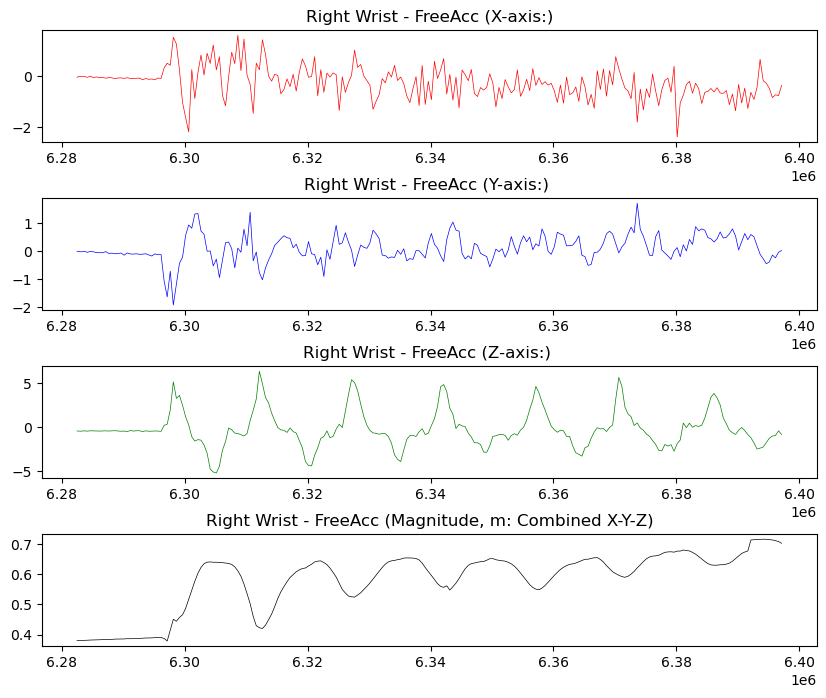

In [11]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - FreeAcc (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Elbow

In [12]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_elbow_data['m'] = magnitude(left_elbow_data)
left_elbow_data.head()

,SampleTimeFine,Quat_W,Quat_X,Quat_Y,Quat_Z,FreeAcc_X,FreeAcc_Y,FreeAcc_Z,Status,m
0,6362207,0.7026,-0.4077,0.4868,0.3211,0.0435,0.0080,-0.0584,0.0,0.711547
1,6362707,0.7035,-0.4073,0.4861,0.3207,0.0201,-0.0111,0.0158,0.0,0.710658
2,6363207,0.7038,-0.4072,0.4855,0.3212,0.0267,-0.0450,-0.0202,0.0,0.710416
3,6363707,0.7040,-0.4072,0.4852,0.3213,0.0650,-0.0563,-0.0416,0.0,0.710257
4,6364207,0.7043,-0.4071,0.4849,0.3212,0.1401,-0.0668,0.0185,0.0,0.709949


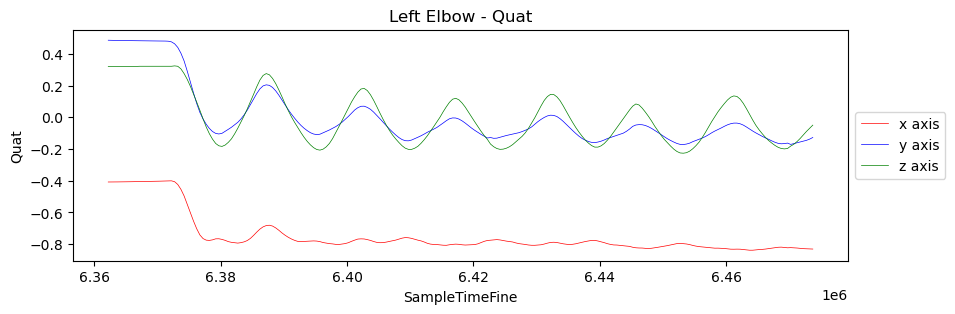

In [13]:
plt.figure(figsize=(10,3))
plt.title('Left Elbow - Quat')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

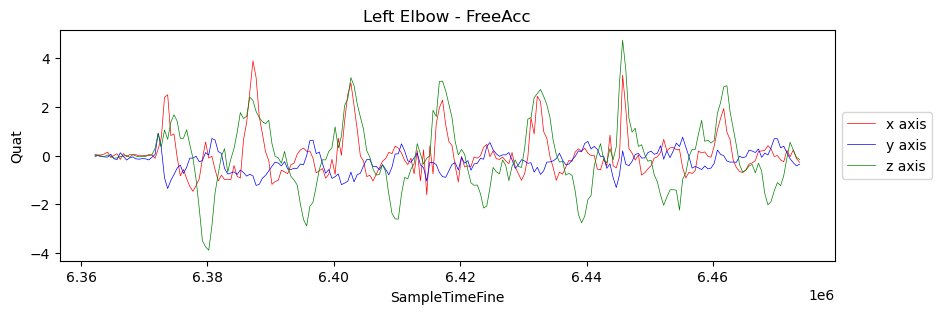

In [14]:
plt.figure(figsize=(10,3))
plt.title('Left Elbow - FreeAcc')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

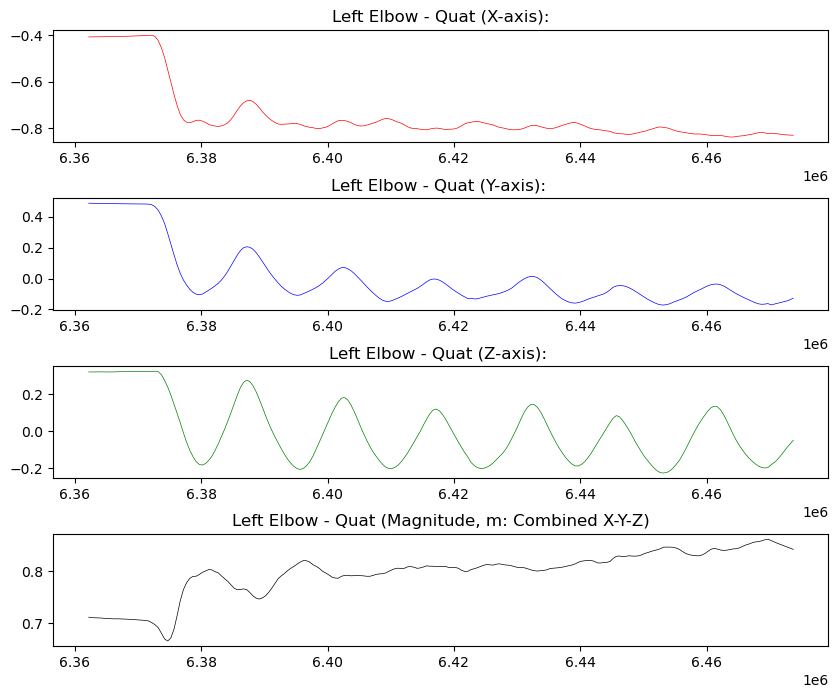

In [15]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - Quat (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - Quat (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - Quat (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

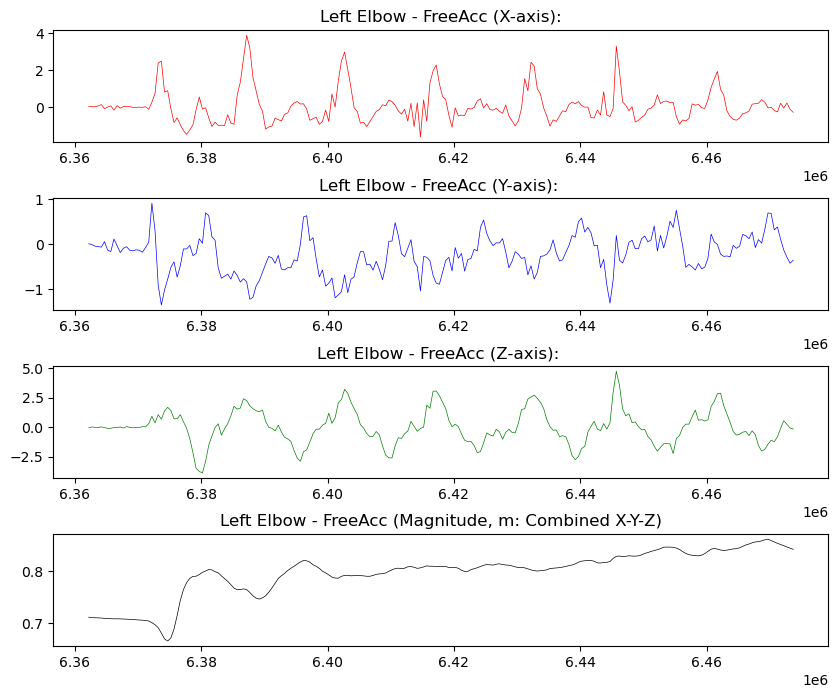

In [16]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - FreeAcc (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - FreeAcc (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - FreeAcc (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Elbow

In [17]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_elbow_data['m'] = magnitude(right_elbow_data)
right_elbow_data.head()

,SampleTimeFine,Quat_W,Quat_X,Quat_Y,Quat_Z,FreeAcc_X,FreeAcc_Y,FreeAcc_Z,Status,m
0,6109529,0.6128,0.4767,0.4387,-0.4525,0.0021,0.0420,-0.1340,0,0.790226
1,6109696,0.6128,0.4770,0.4389,-0.4519,0.0046,0.0413,-0.1188,0,0.790175
2,6110196,0.6124,0.4782,0.4391,-0.4511,-0.0853,0.0022,-0.1558,0,0.790554
3,6110696,0.6119,0.4788,0.4393,-0.4510,-0.0756,-0.0165,-0.1057,0,0.790971
4,6111196,0.6114,0.4793,0.4394,-0.4510,0.0119,-0.0227,-0.0933,0,0.791329


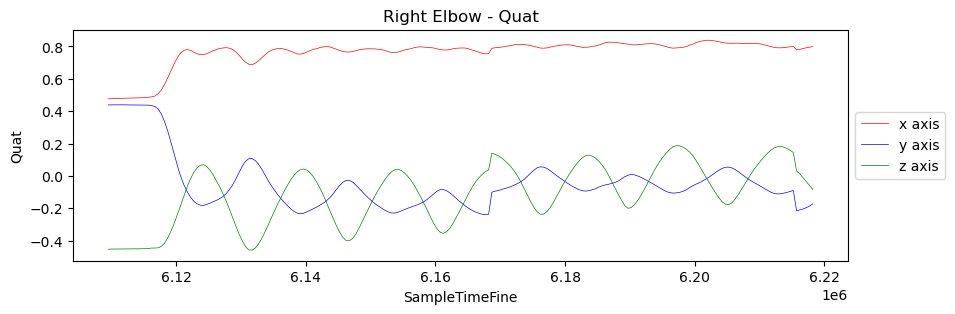

In [18]:
plt.figure(figsize=(10,3))
plt.title('Right Elbow - Quat')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

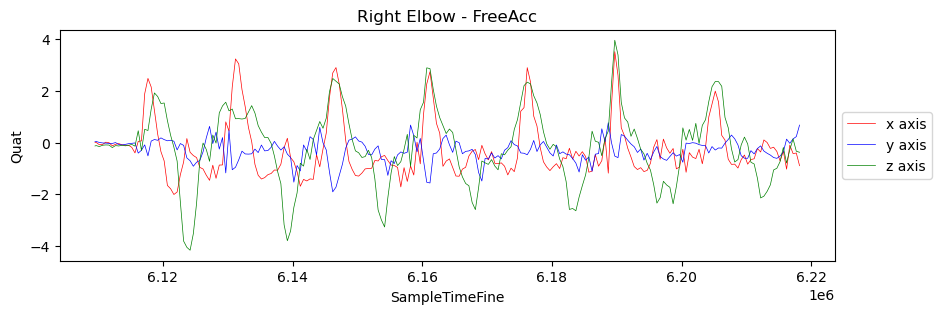

In [19]:
plt.figure(figsize=(10,3))
plt.title('Right Elbow - FreeAcc')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

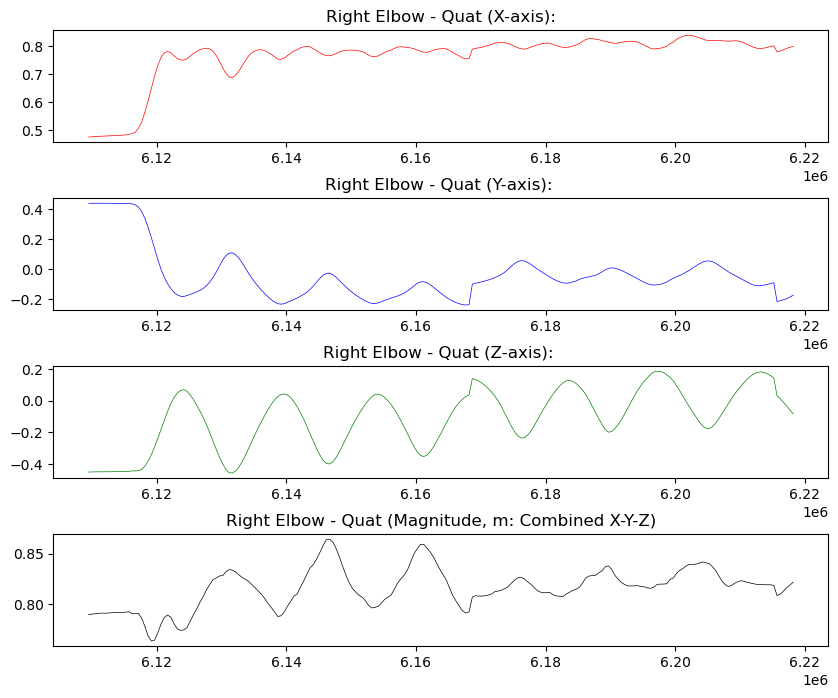

In [20]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - Quat (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - Quat (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - Quat (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

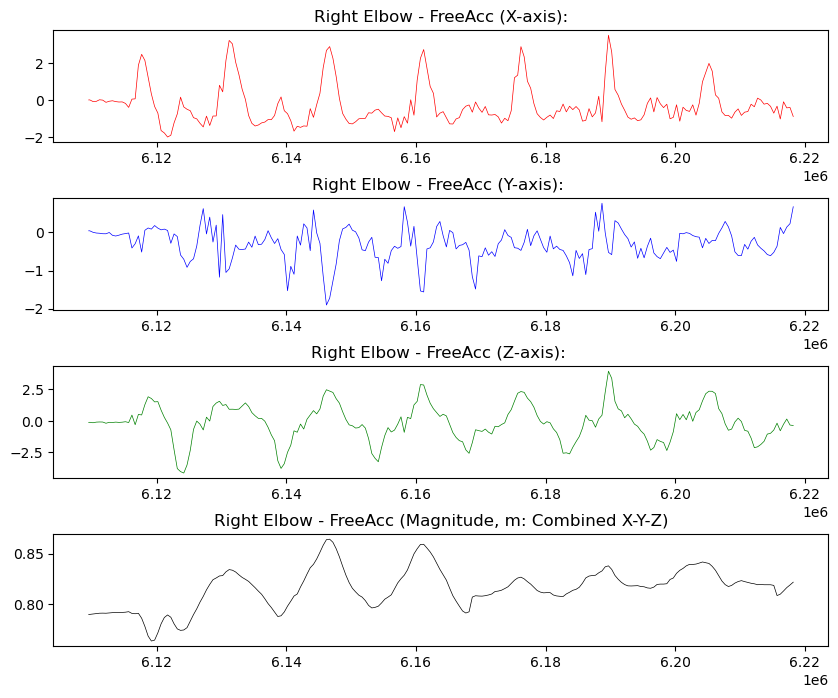

In [21]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - FreeAcc (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - FreeAcc (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - FreeAcc (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Shoulder

In [22]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_shoulder_data['m'] = magnitude(left_shoulder_data)
left_shoulder_data.head()

,SampleTimeFine,Quat_W,Quat_X,Quat_Y,Quat_Z,FreeAcc_X,FreeAcc_Y,FreeAcc_Z,Status,m
0,6360707,0.9473,-0.1666,0.0904,0.2581,-0.1038,0.0317,-0.1001,0.0,0.320224
1,6361207,0.9477,-0.1643,0.0930,0.2573,-0.0204,-0.0033,-0.1371,0.0,0.319134
2,6361707,0.9482,-0.1631,0.0943,0.2558,-0.0345,-0.0255,-0.1457,0.0,0.317691
3,6362207,0.9486,-0.1624,0.0950,0.2545,0.0602,-0.0288,-0.1621,0.0,0.316495
4,6362707,0.9490,-0.1617,0.0955,0.2534,0.0273,-0.0176,-0.1163,0.0,0.315402


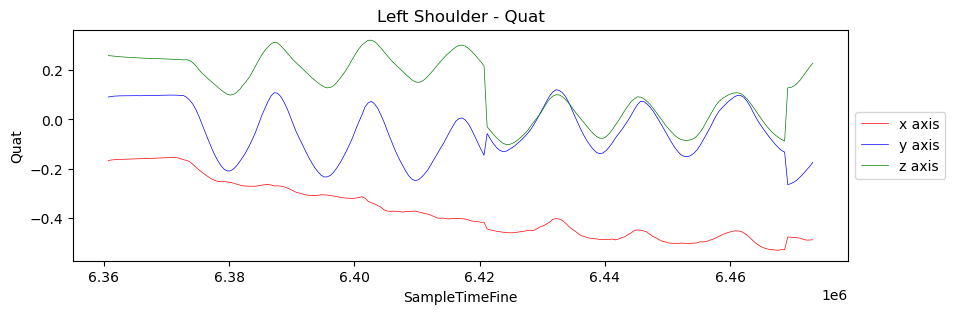

In [23]:
plt.figure(figsize=(10,3))
plt.title('Left Shoulder - Quat')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

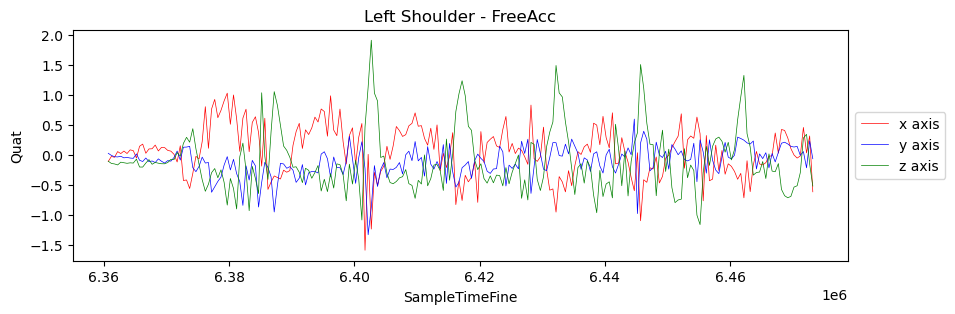

In [24]:
plt.figure(figsize=(10,3))
plt.title('Left Shoulder - FreeAcc')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

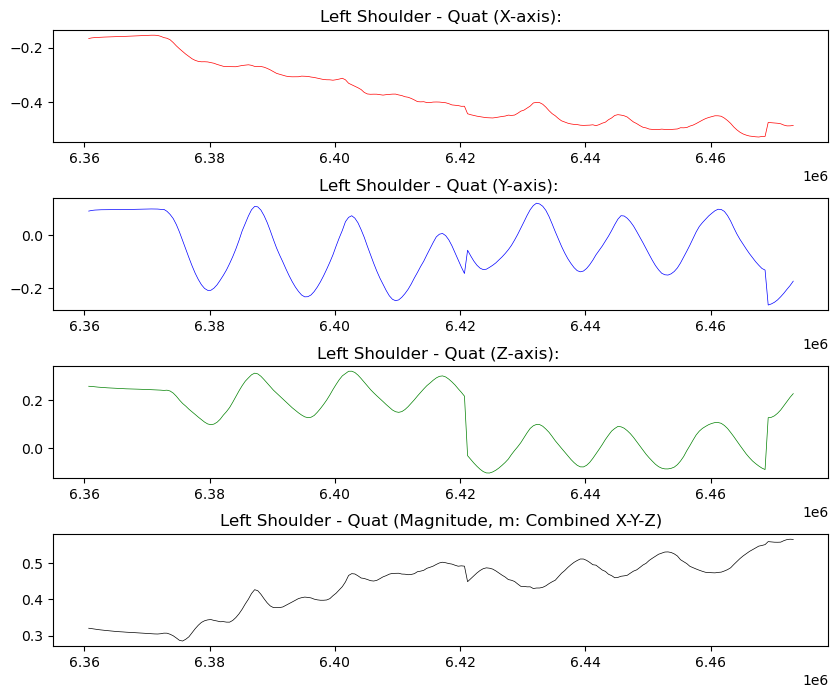

In [25]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - Quat (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - Quat (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - Quat (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

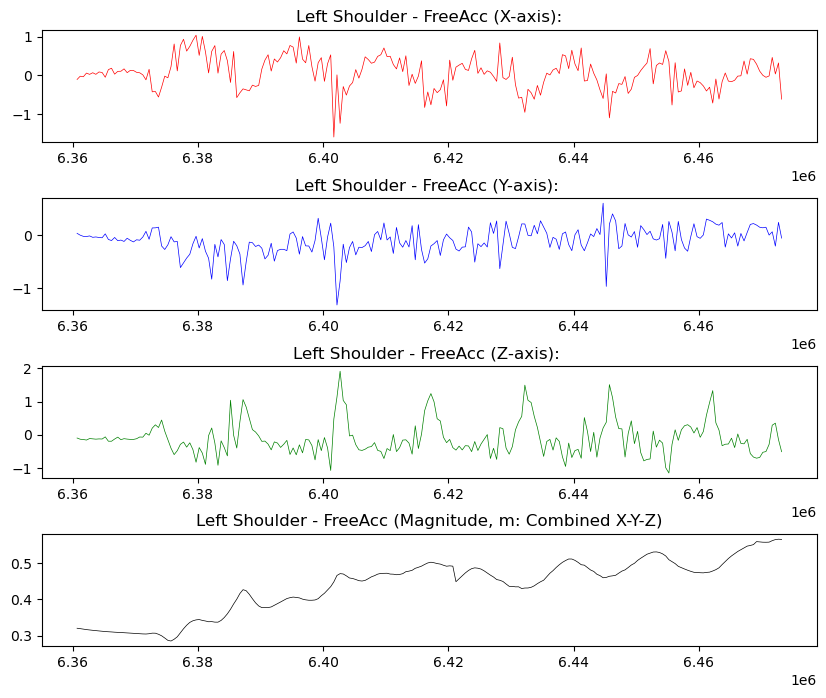

In [26]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - FreeAcc (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Shoulder

In [27]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_shoulder_data['m'] = magnitude(right_shoulder_data)
right_shoulder_data.head()

,SampleTimeFine,Quat_W,Quat_X,Quat_Y,Quat_Z,FreeAcc_X,FreeAcc_Y,FreeAcc_Z,Status,m
0,5924151,0.9697,0.1165,0.1750,-0.1242,-0.0447,-0.0401,0.1188,0,0.244178
1,5924651,0.9695,0.1161,0.1755,-0.1254,0.0092,-0.0119,0.1210,0,0.244958
2,5925151,0.9694,0.1163,0.1755,-0.1262,0.0074,0.0140,0.0524,0,0.245464
3,5925651,0.9693,0.1167,0.1754,-0.1268,-0.0276,-0.0197,0.1563,0,0.245891
4,5926151,0.9692,0.1169,0.1752,-0.1275,-0.0261,-0.0655,0.1199,0,0.246205


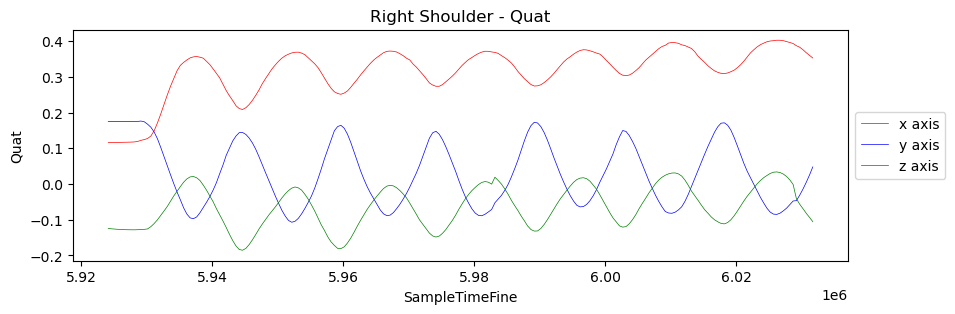

In [28]:
plt.figure(figsize=(10,3))
plt.title('Right Shoulder - Quat')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

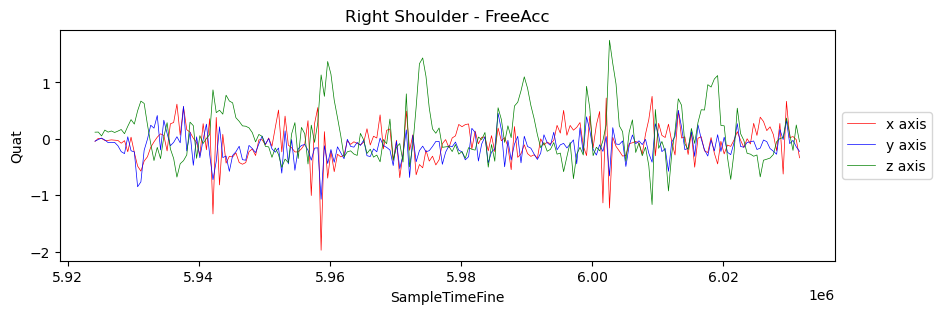

In [29]:
plt.figure(figsize=(10,3))
plt.title('Right Shoulder - FreeAcc')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

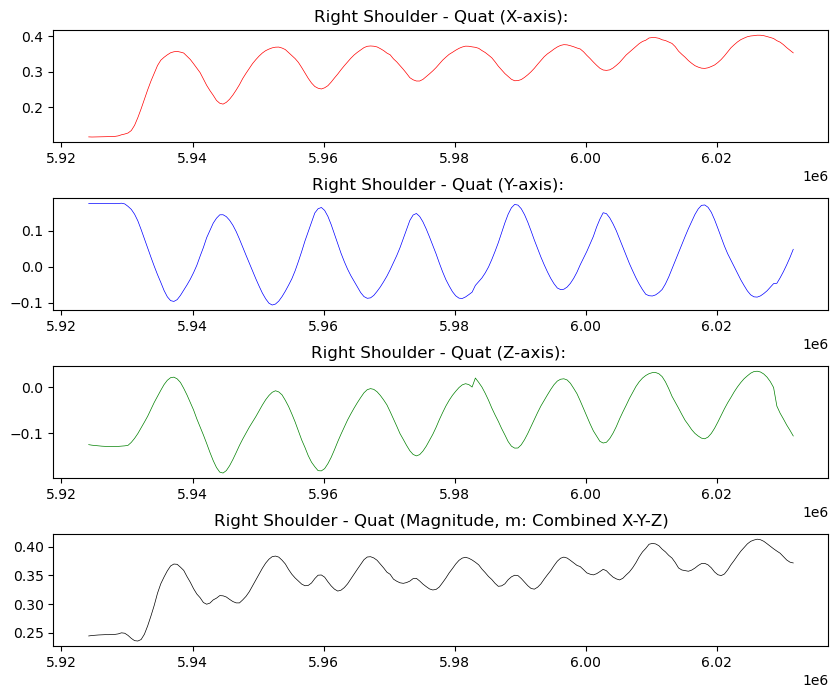

In [30]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - Quat (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - Quat (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - Quat (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

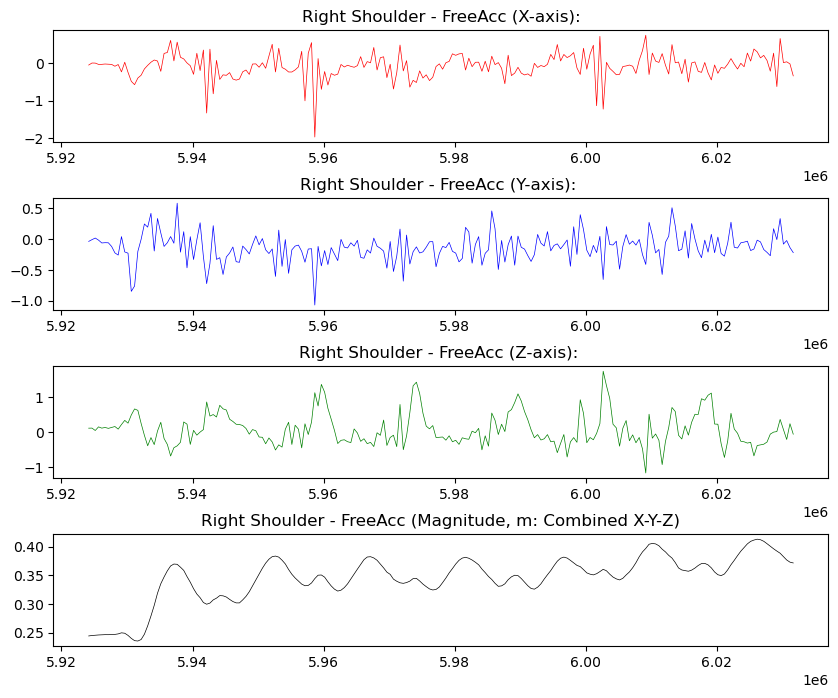

In [31]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - FreeAcc (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

# =============================================================

# XSens DOT Data 1

In [32]:
import numpy as np
import ezc3d
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from keras.utils import to_categorical
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import classification_report
import os
import math

# Load and preprocess sensor data
left_wrist_data = pd.read_csv('DOT Data/sensor1_left_wrist.csv')
right_wrist_data = pd.read_csv('DOT Data/sensor2_right_wrist.csv')
left_elbow_data = pd.read_csv('DOT Data/sensor1_left_elbow.csv')
right_elbow_data = pd.read_csv('DOT Data/sensor2_right_elbow.csv')
left_shoulder_data = pd.read_csv('DOT Data/sensor1_left_shoulder.csv')
right_shoulder_data = pd.read_csv('DOT Data/sensor2_right_shoulder.csv')

def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_wrist_data['m'] = magnitude(left_wrist_data)
left_wrist_data.head()


,SampleTimeFine,Quat_W,Quat_X,Quat_Y,Quat_Z,FreeAcc_X,FreeAcc_Y,FreeAcc_Z,Status,m
0,10447820,0.9999,-0.0073,0.0075,0.0074,-0.0302,0.0010,0.1633,0.0,0.012818
1,10447987,0.9999,-0.0071,0.0077,0.0072,-0.0243,-0.0095,0.1600,0.0,0.012710
2,10448154,0.9999,-0.0071,0.0080,0.0068,-0.0222,-0.0124,0.1711,0.0,0.012675
3,10448320,0.9999,-0.0070,0.0082,0.0066,-0.0042,-0.0108,0.1674,0.0,0.012641
4,10448487,0.9999,-0.0070,0.0083,0.0064,0.0048,-0.0011,0.1573,0.0,0.012604


## Left Wrist

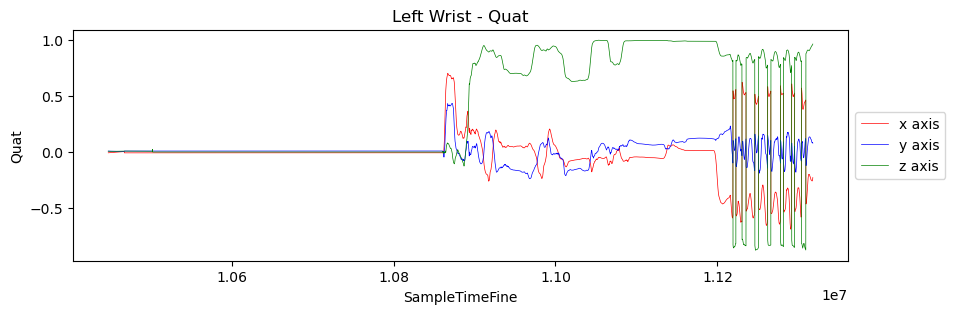

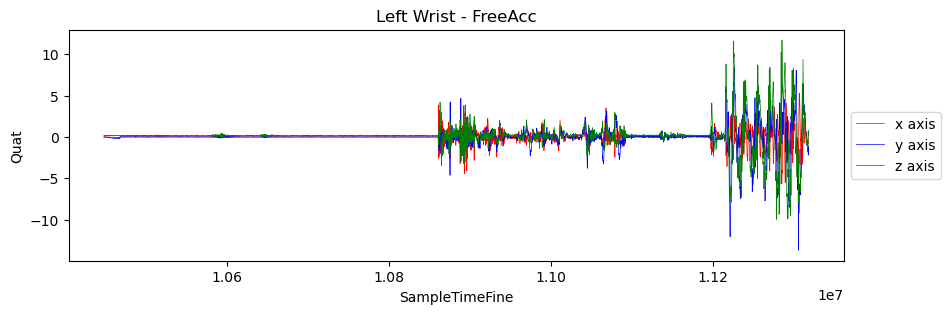

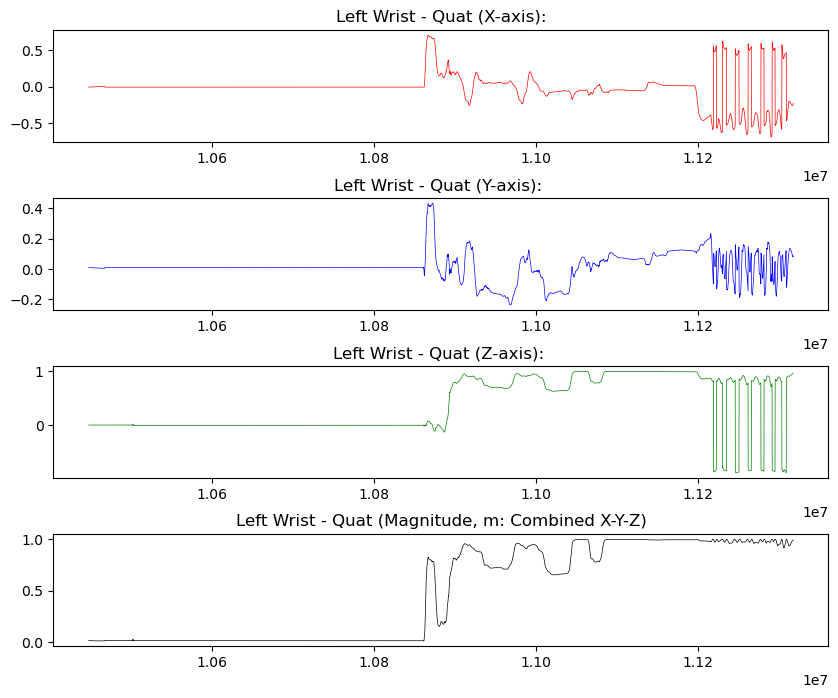

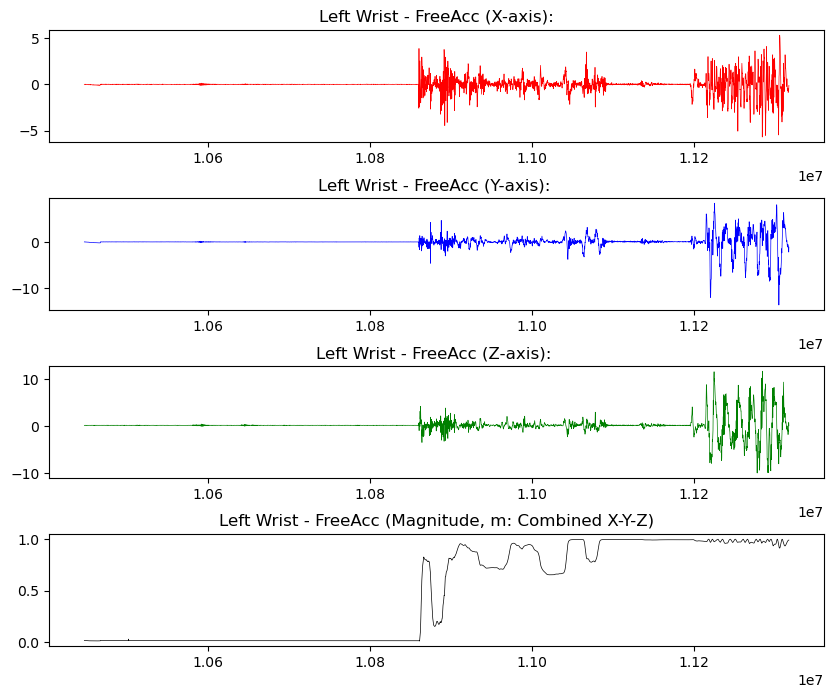

In [33]:
plt.figure(figsize=(10,3))
plt.title('Left Wrist - Quat')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Wrist - FreeAcc')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - Quat (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - Quat (Y-axis): ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - Quat (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - FreeAcc (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - FreeAcc (Y-axis): ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - FreeAcc (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Wrist

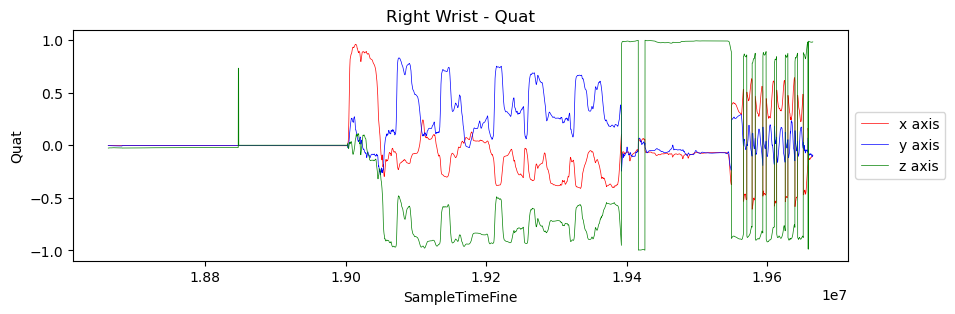

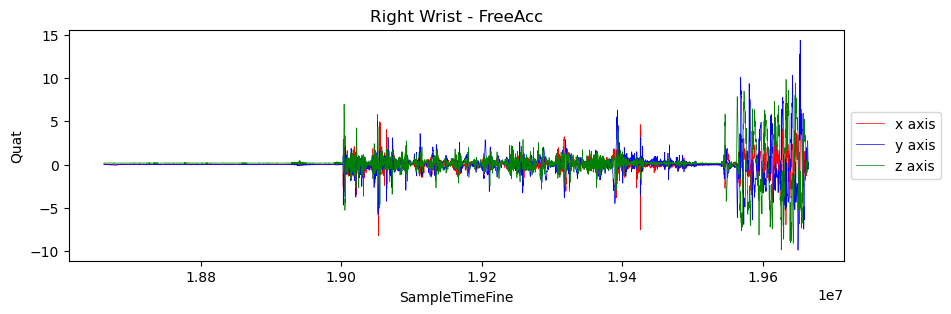

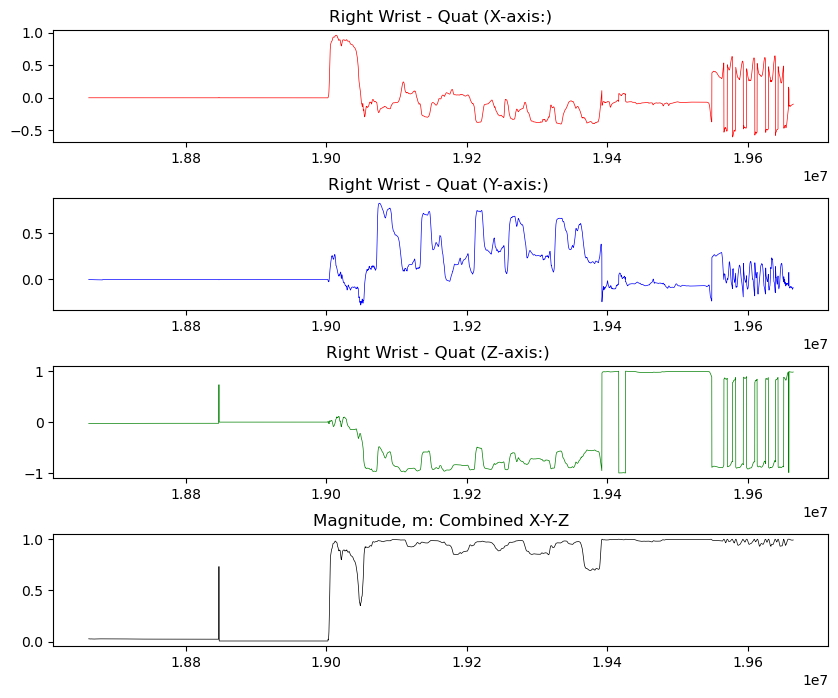

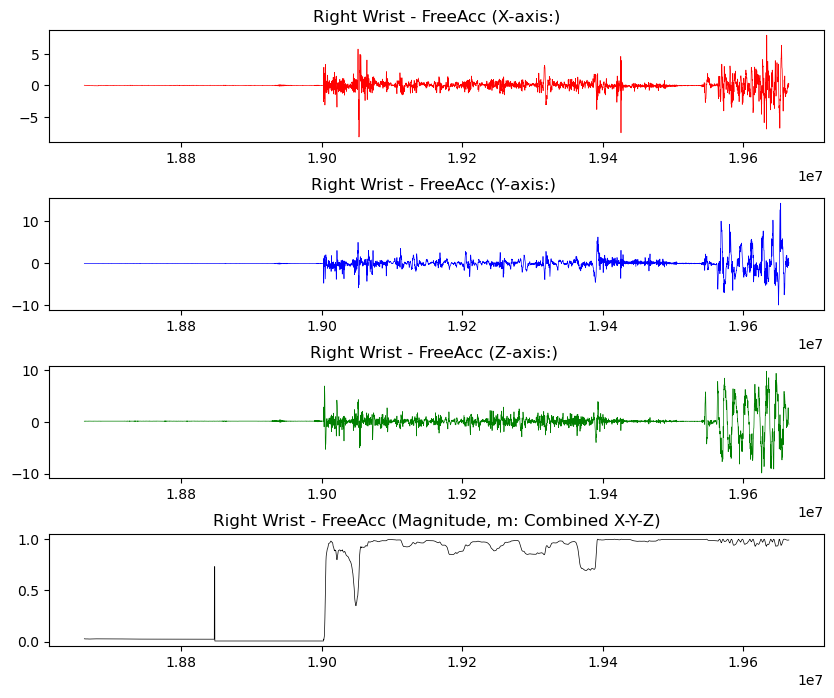

In [34]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_wrist_data['m'] = magnitude(right_wrist_data)
right_wrist_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Wrist - Quat')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Wrist - FreeAcc')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - Quat (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - Quat (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - Quat (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Magnitude, m: Combined X-Y-Z')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - FreeAcc (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Elbow

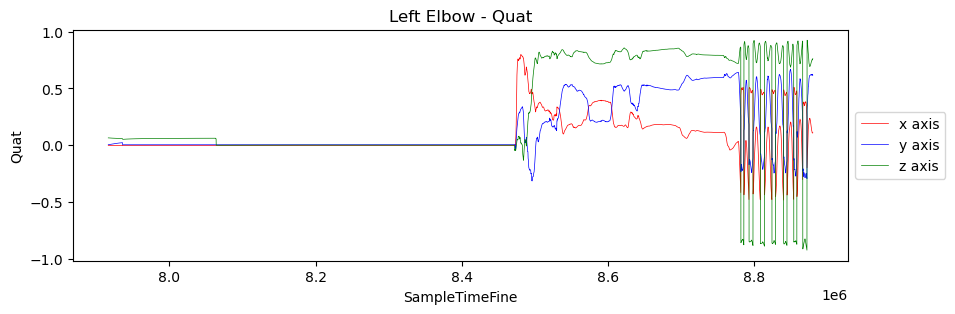

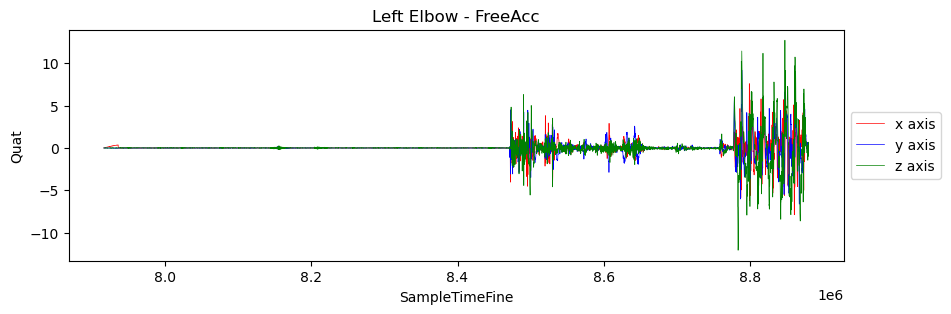

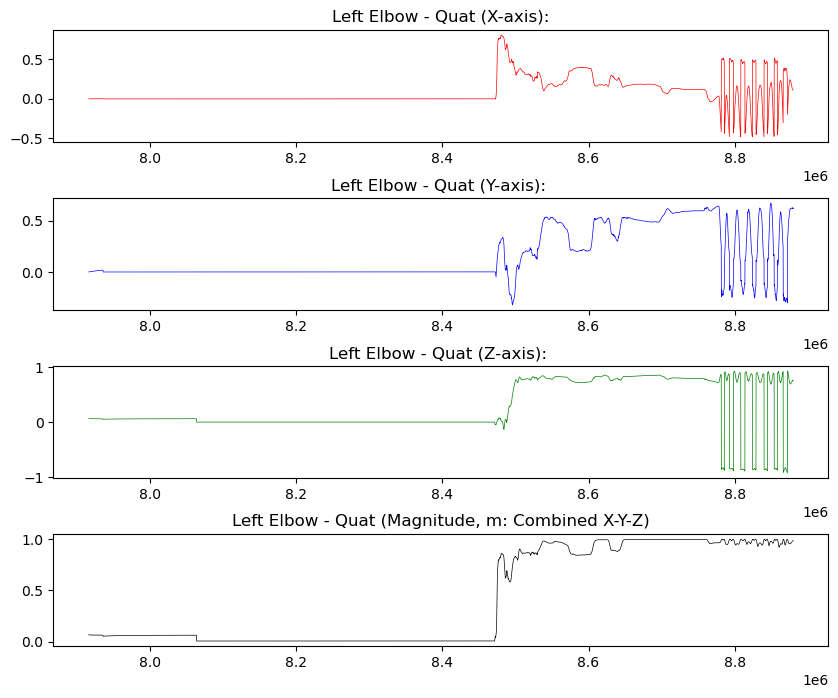

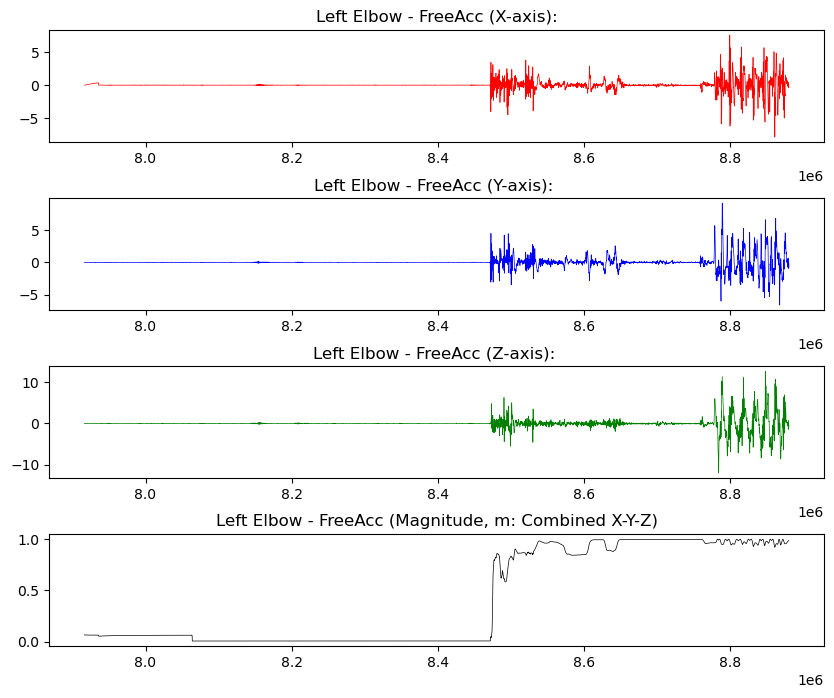

In [35]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_elbow_data['m'] = magnitude(left_elbow_data)
left_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Elbow - Quat')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Elbow - FreeAcc')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - Quat (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - Quat (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - Quat (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - FreeAcc (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - FreeAcc (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - FreeAcc (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Elbow

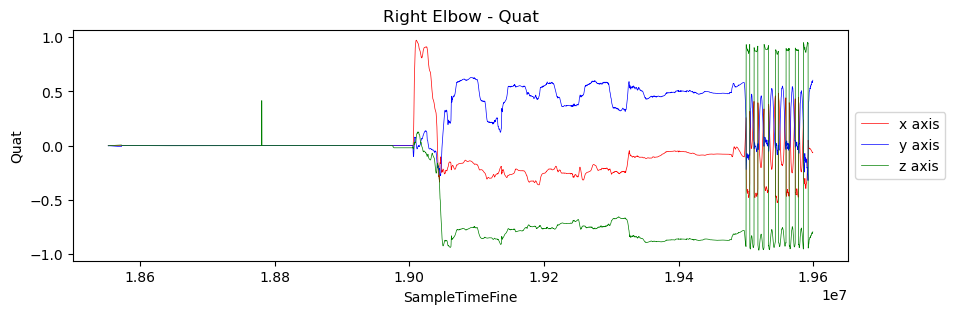

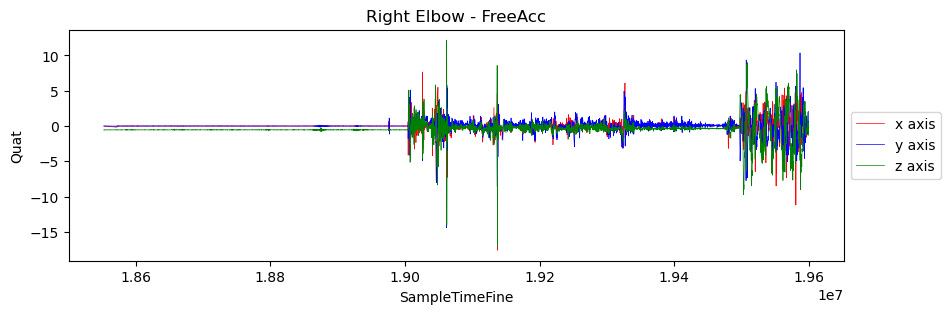

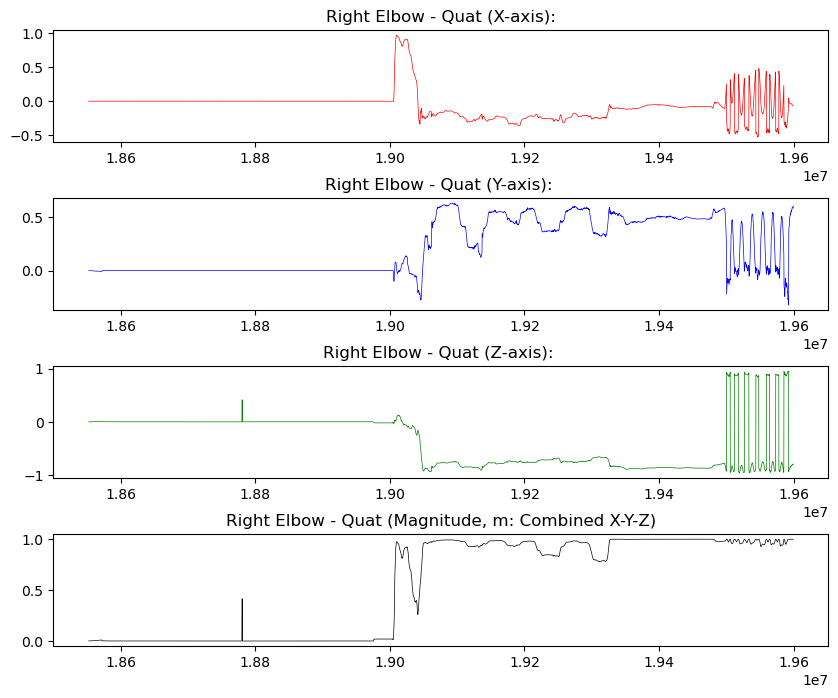

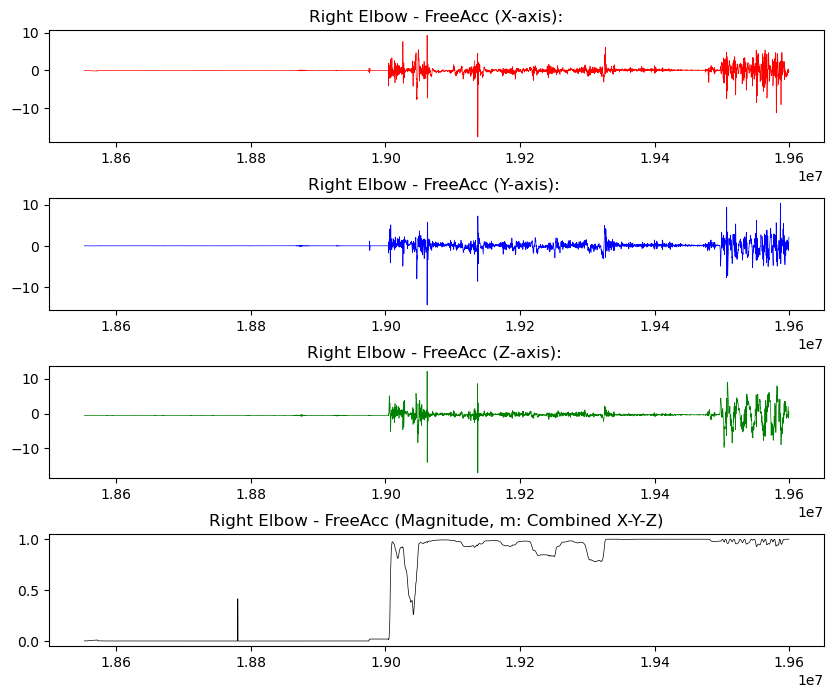

In [36]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_elbow_data['m'] = magnitude(right_elbow_data)
right_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Elbow - Quat')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Elbow - FreeAcc')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - Quat (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - Quat (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - Quat (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - FreeAcc (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - FreeAcc (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - FreeAcc (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Shoulder

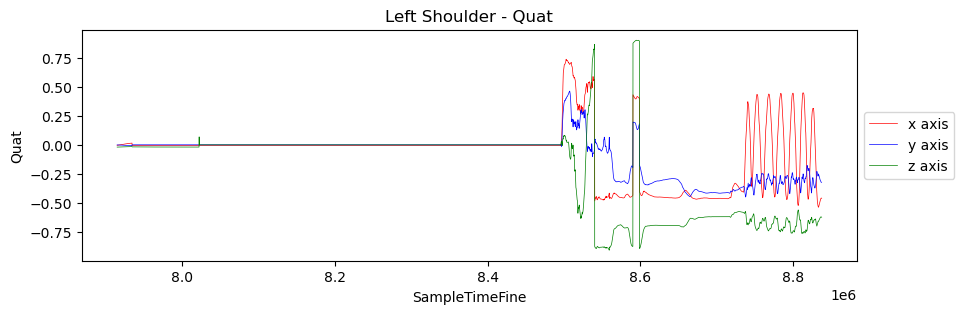

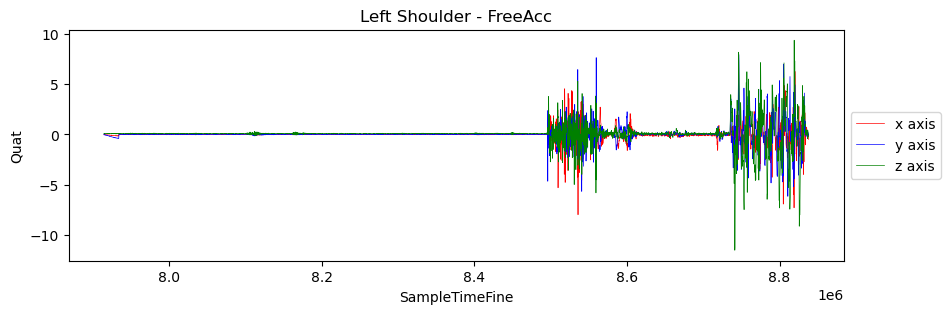

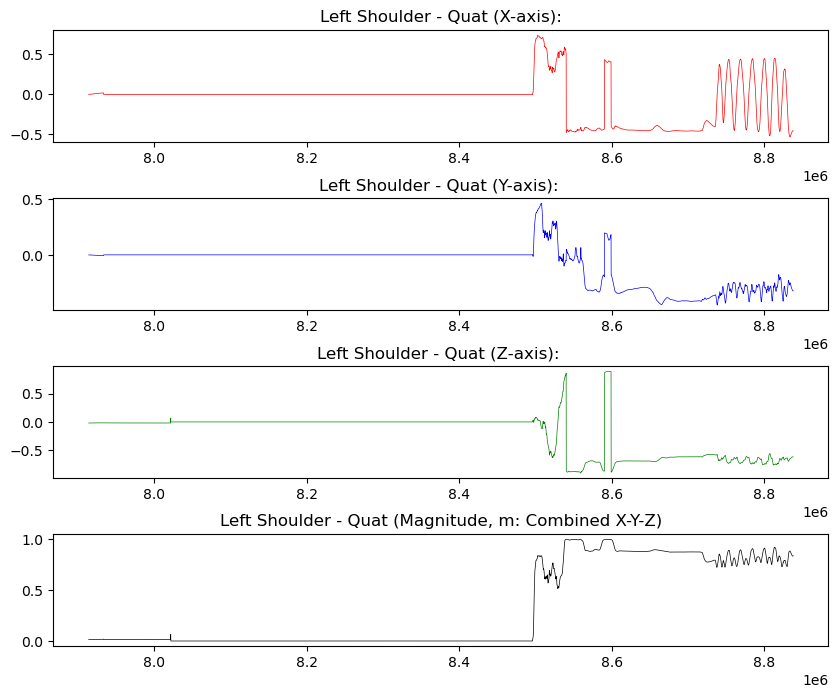

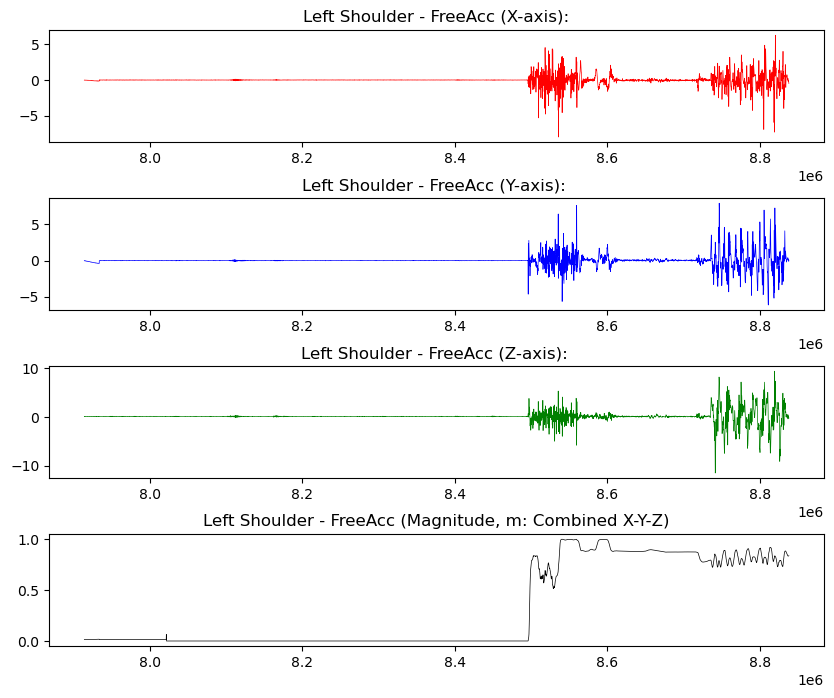

In [37]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_shoulder_data['m'] = magnitude(left_shoulder_data)
left_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - Quat')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - FreeAcc')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - Quat (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - Quat (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - Quat (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - FreeAcc (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Shoulder

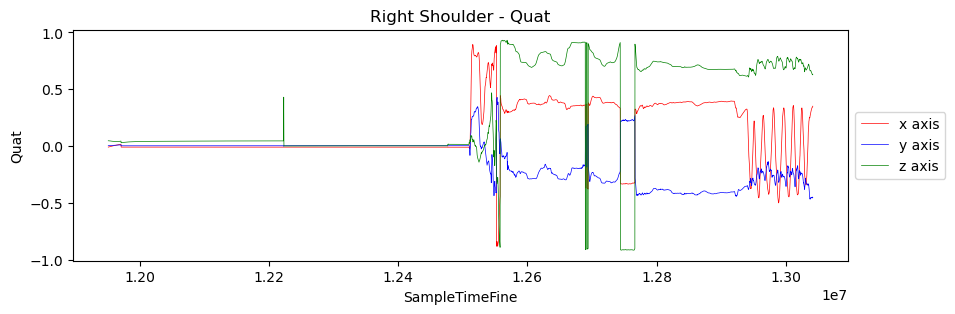

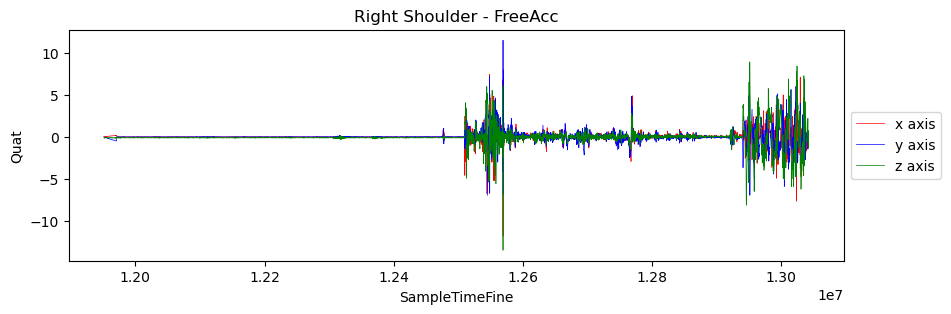

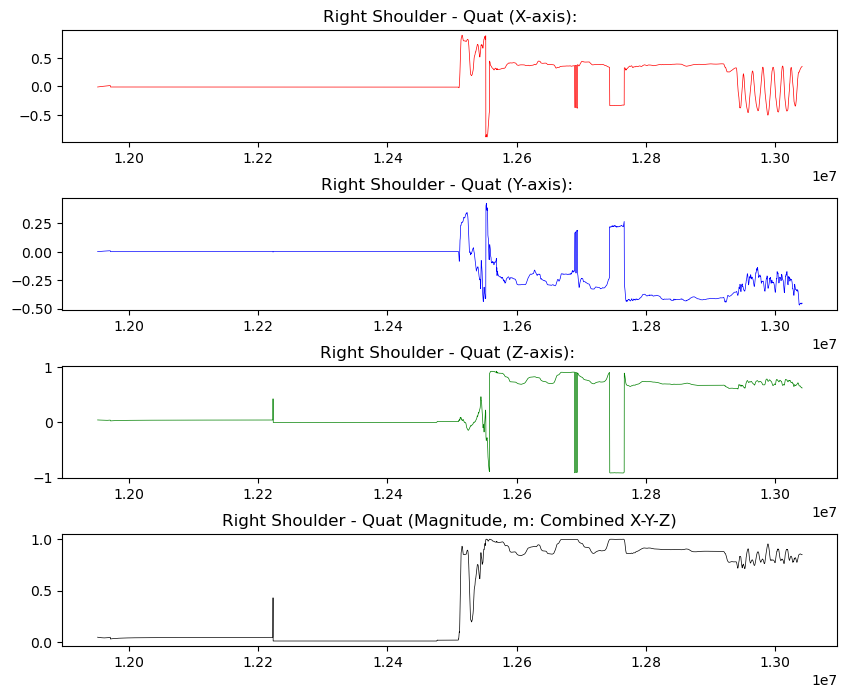

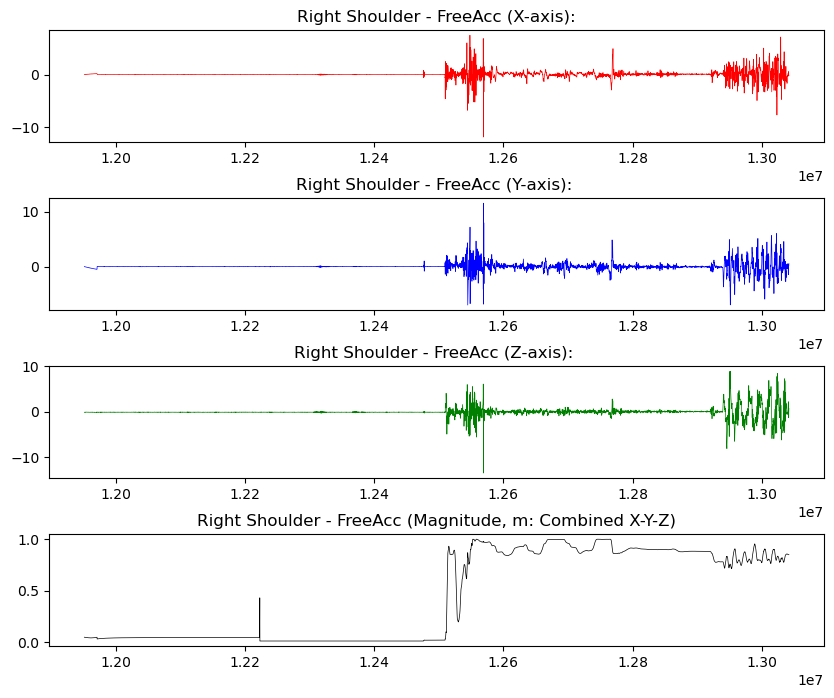

In [38]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_shoulder_data['m'] = magnitude(right_shoulder_data)
right_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - Quat')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - FreeAcc')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - Quat (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - Quat (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - Quat (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - FreeAcc (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

# =============================================================

# XSens DOT Data 4

In [39]:
import numpy as np
import ezc3d
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from keras.utils import to_categorical
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import classification_report
import os
import math

# Load and preprocess sensor data
left_wrist_data = pd.read_csv('DOT Data 4/leftwrist.csv')
right_wrist_data = pd.read_csv('DOT Data 4/rightwrist.csv')
left_elbow_data = pd.read_csv('DOT Data 4/leftelbow.csv')
right_elbow_data = pd.read_csv('DOT Data 4/rightelbow.csv')
left_shoulder_data = pd.read_csv('DOT Data 4/leftshoulder.csv')
right_shoulder_data = pd.read_csv('DOT Data 4/rightshoulder.csv')

def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_wrist_data['m'] = magnitude(left_wrist_data)
left_wrist_data.head()

,SampleTimeFine,Quat_W,Quat_X,Quat_Y,Quat_Z,FreeAcc_X,FreeAcc_Y,FreeAcc_Z,Status,m
0,8379036,0.2263,-0.5087,0.5810,-0.5937,-0.0603,-0.0457,0.0820,0,0.974072
1,8379202,0.2264,-0.5087,0.5807,-0.5939,-0.0880,-0.0816,0.0026,0,0.974015
2,8379703,0.2263,-0.5091,0.5809,-0.5935,-0.0498,0.0459,0.1050,0,0.974100
3,8380203,0.2269,-0.5085,0.5814,-0.5932,-0.1108,0.0655,0.1069,0,0.973902
4,8380703,0.2274,-0.5078,0.5818,-0.5933,-0.0922,0.0149,0.0371,0,0.973836


## Left Wrist

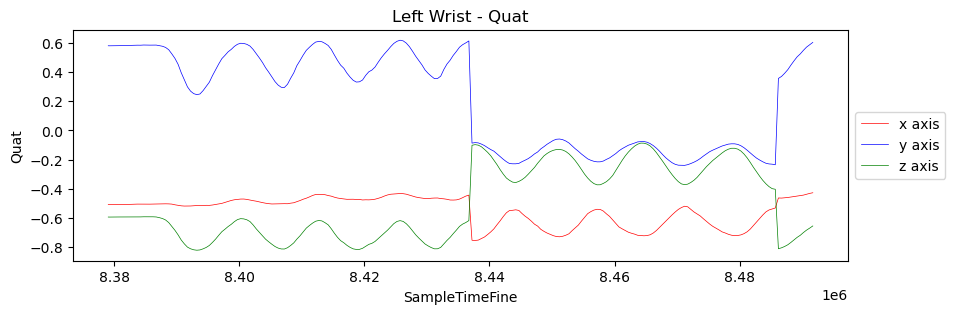

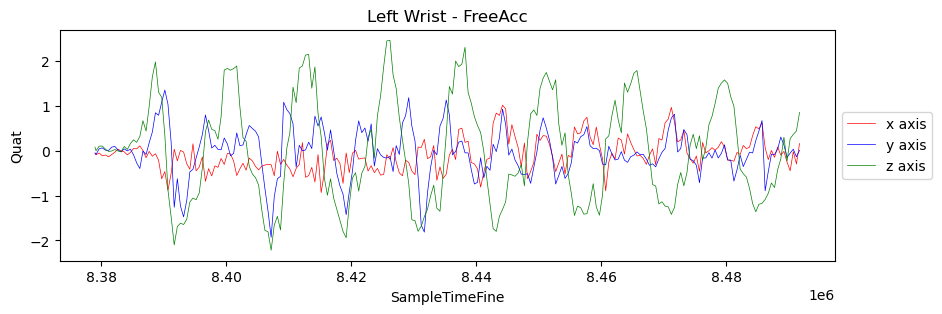

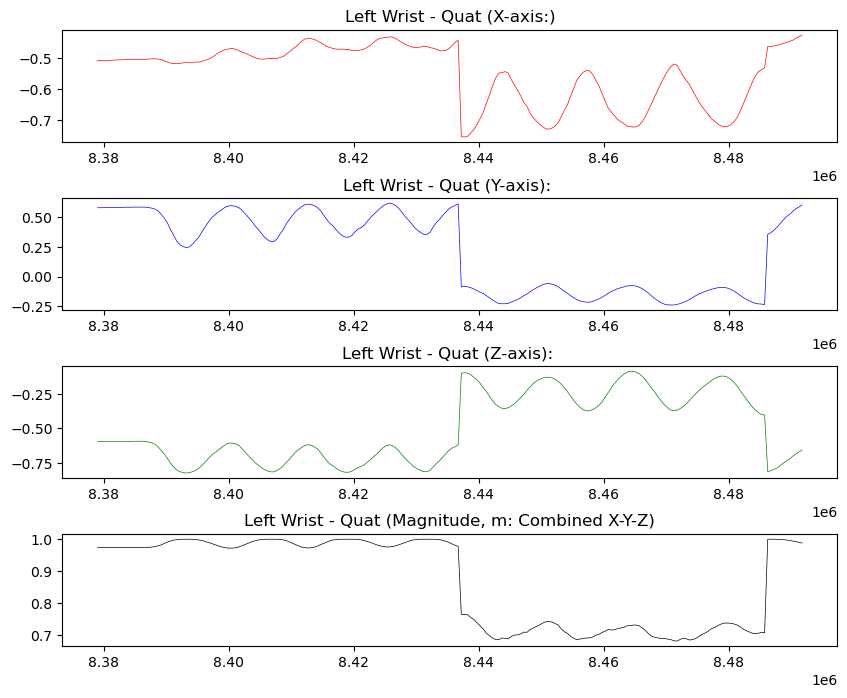

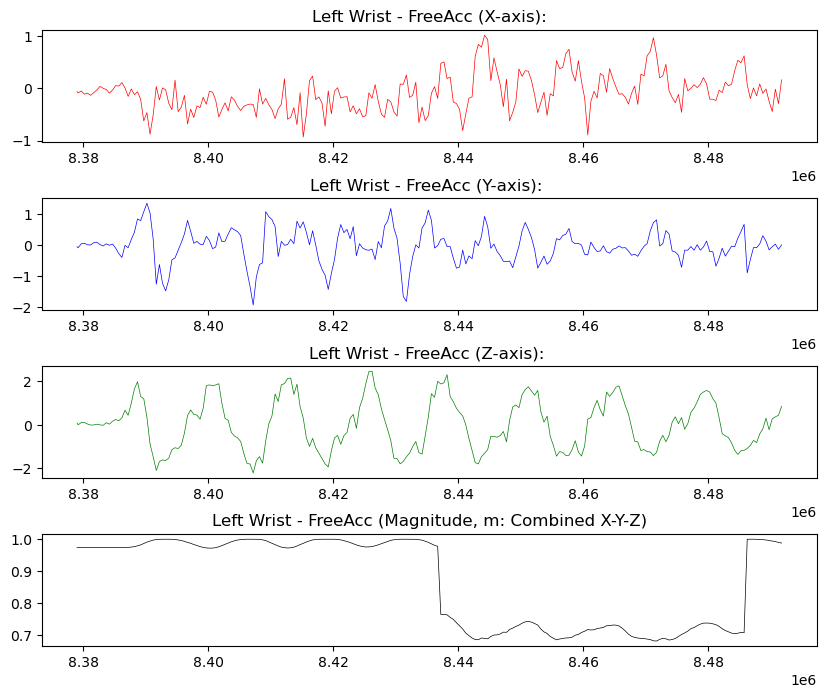

In [40]:
plt.figure(figsize=(10,3))
plt.title('Left Wrist - Quat')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Wrist - FreeAcc')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - Quat (X-axis:)')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - Quat (Y-axis): ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - Quat (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - FreeAcc (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - FreeAcc (Y-axis): ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - FreeAcc (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Wrist

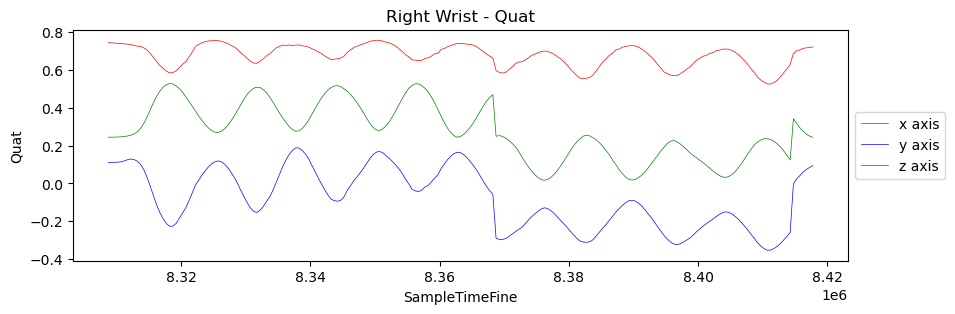

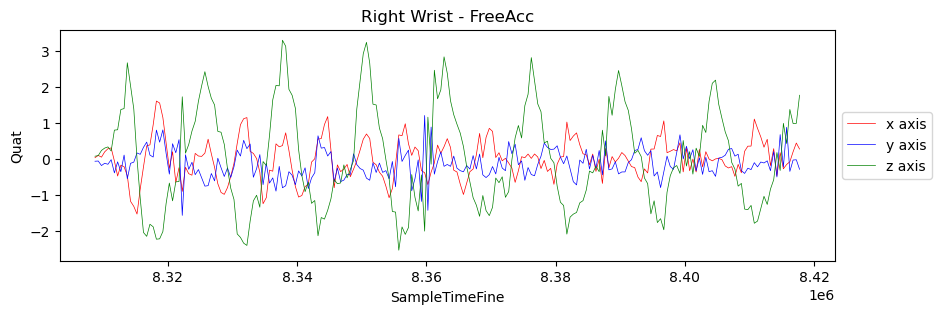

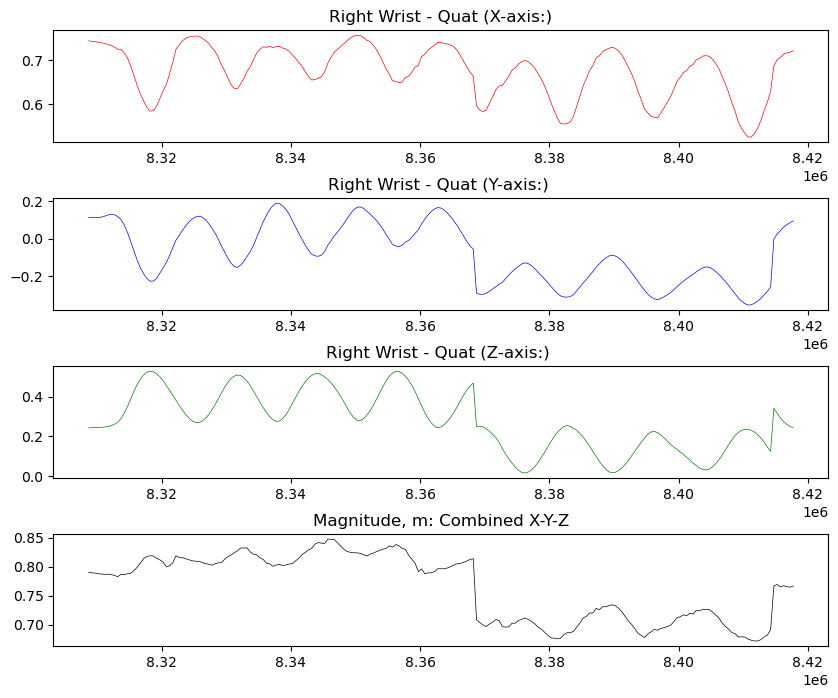

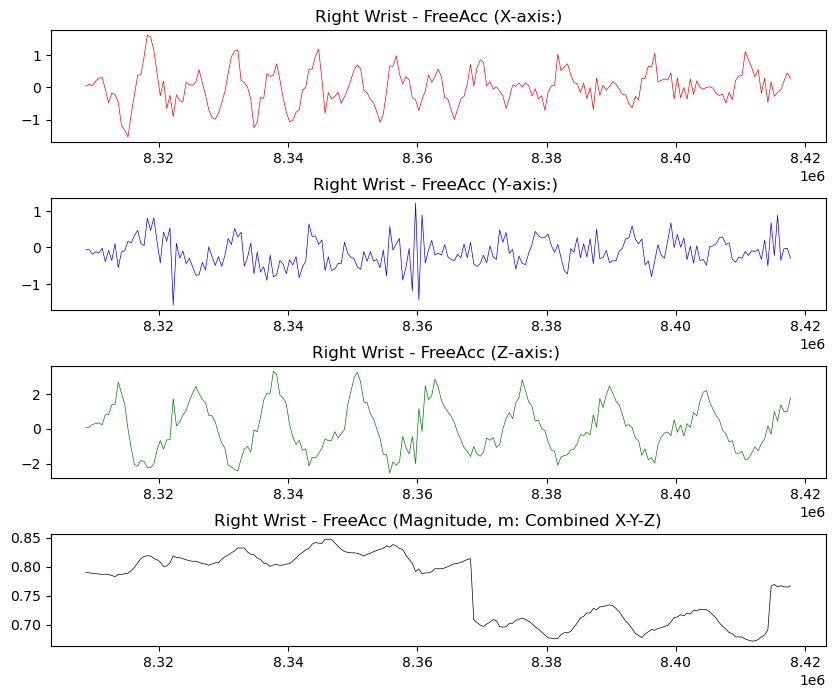

In [41]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_wrist_data['m'] = magnitude(right_wrist_data)
right_wrist_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Wrist - Quat')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Wrist - FreeAcc')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - Quat (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - Quat (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - Quat (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Magnitude, m: Combined X-Y-Z')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - FreeAcc (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Elbow

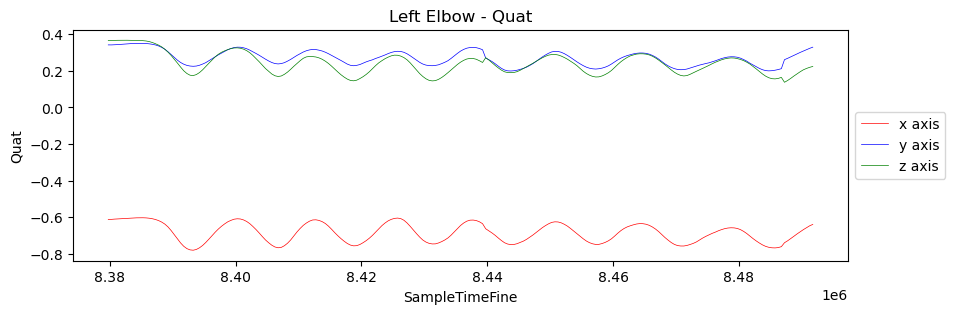

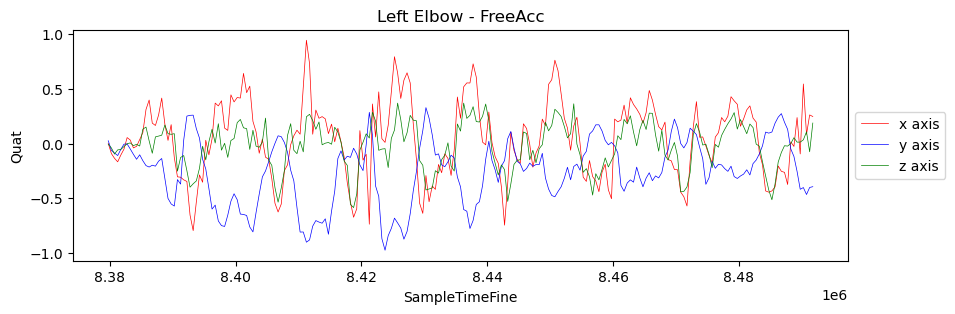

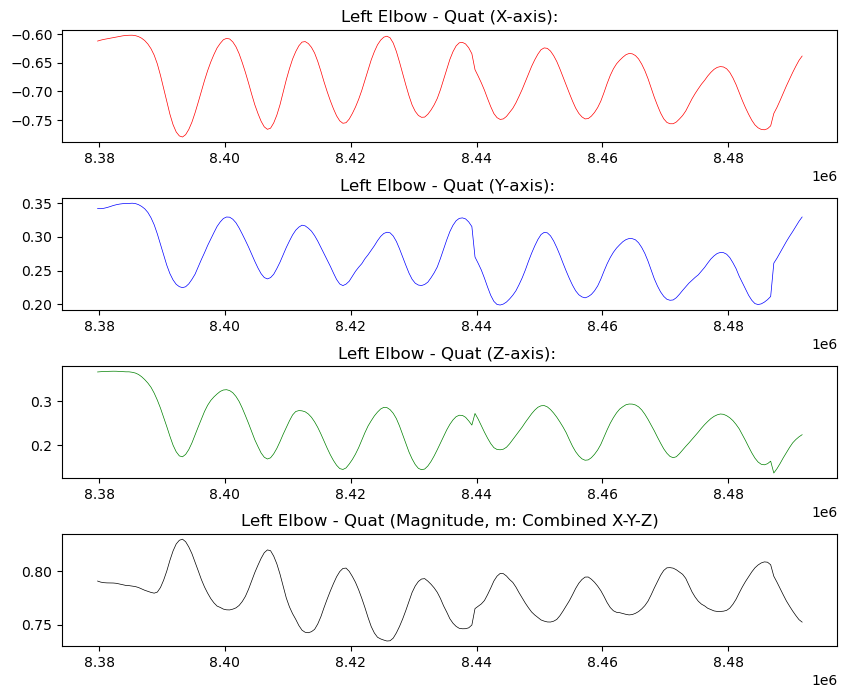

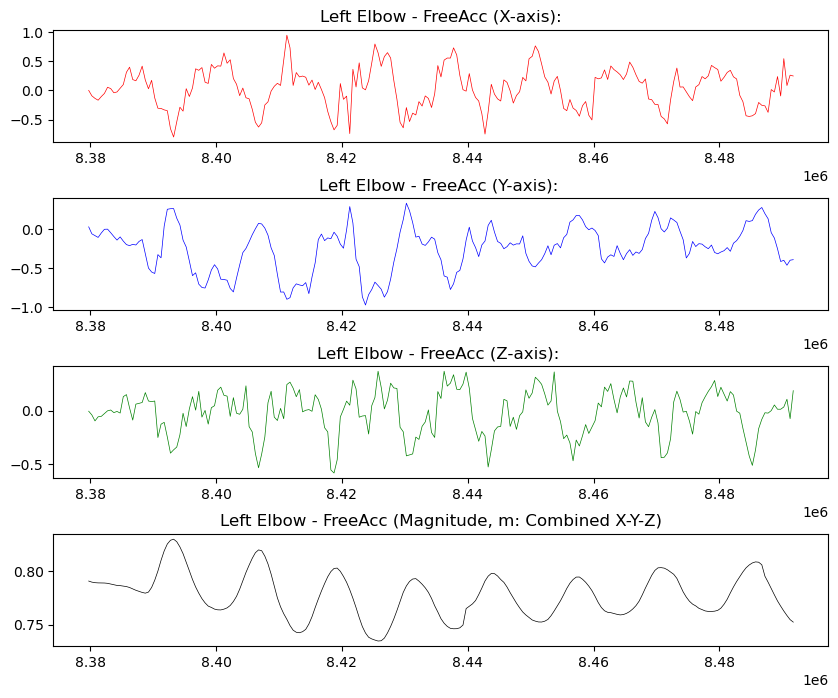

In [42]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_elbow_data['m'] = magnitude(left_elbow_data)
left_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Elbow - Quat')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Elbow - FreeAcc')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - Quat (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - Quat (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - Quat (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - FreeAcc (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - FreeAcc (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - FreeAcc (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Elbow

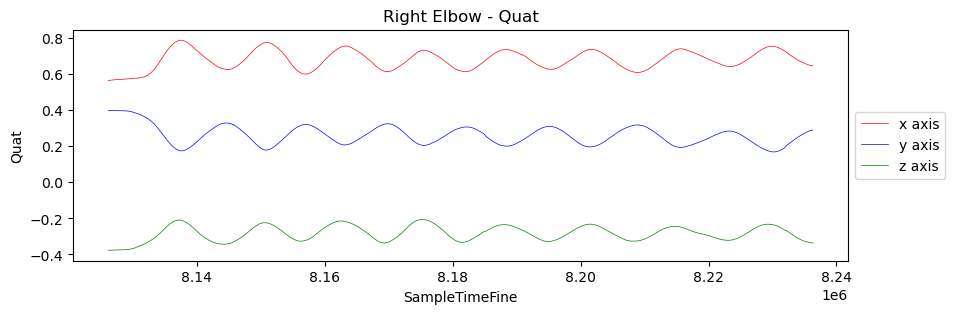

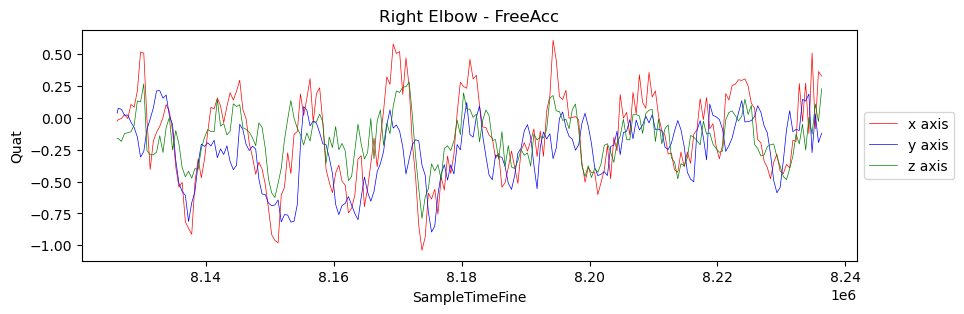

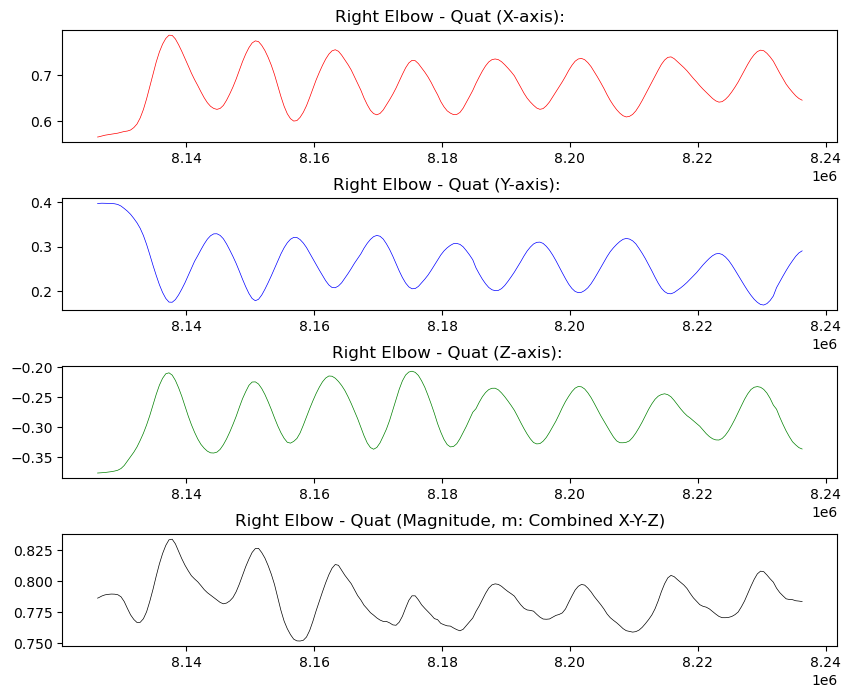

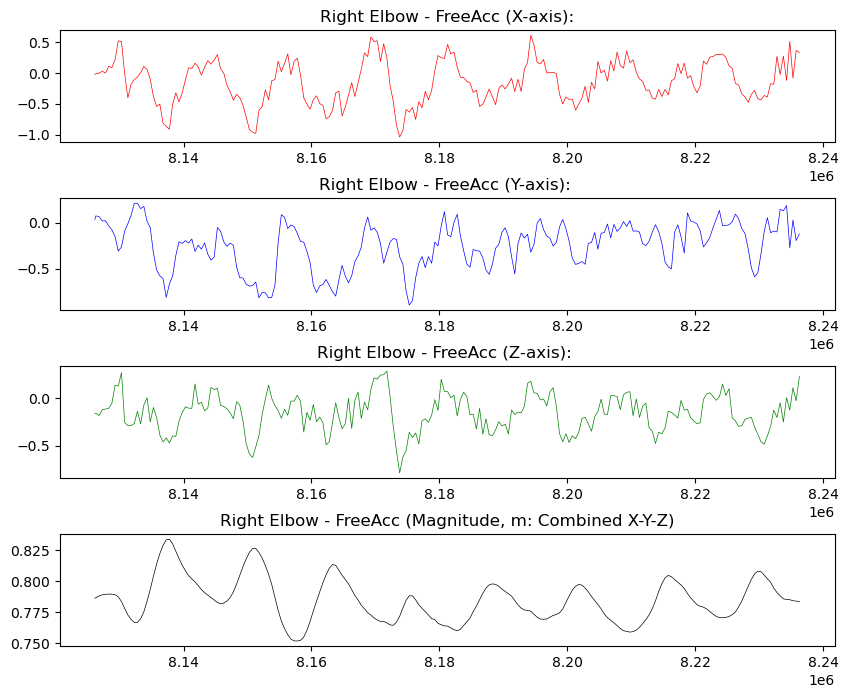

In [43]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_elbow_data['m'] = magnitude(right_elbow_data)
right_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Elbow - Quat')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Elbow - FreeAcc')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - Quat (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - Quat (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - Quat (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - FreeAcc (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - FreeAcc (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - FreeAcc (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Shoulder

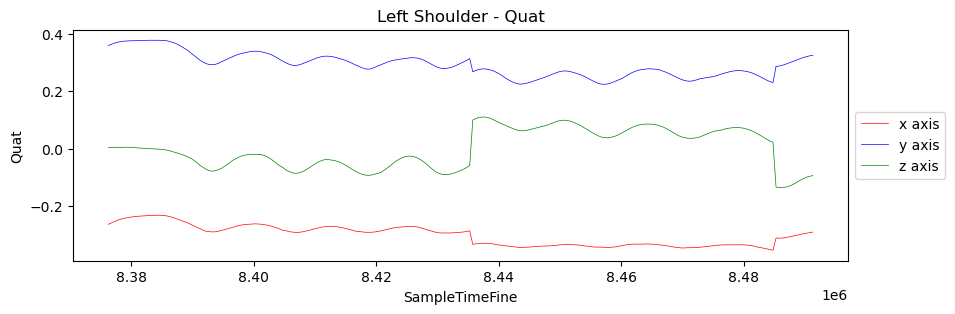

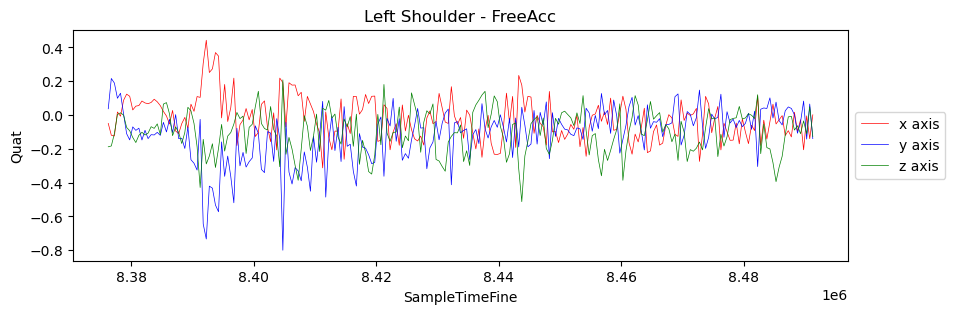

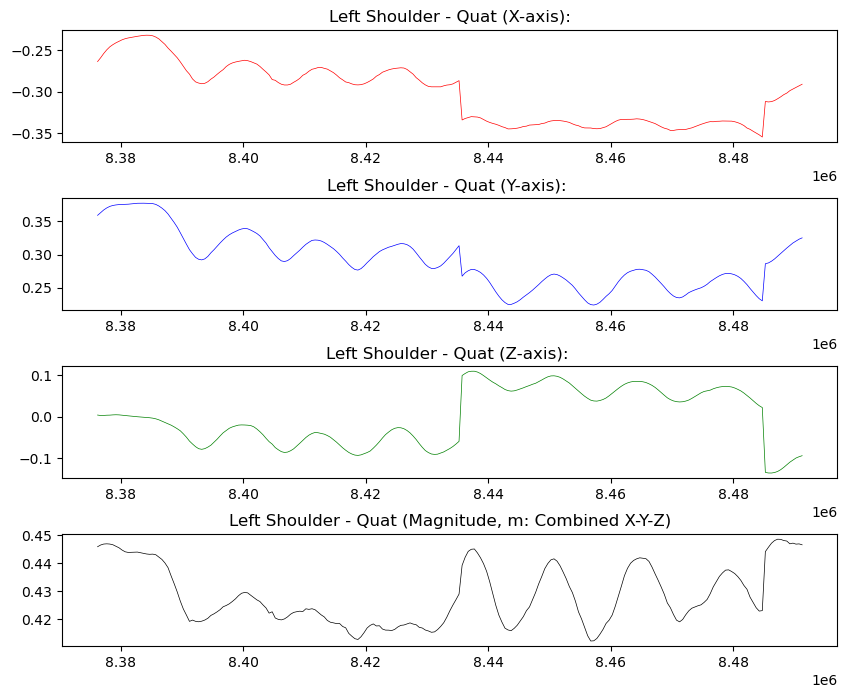

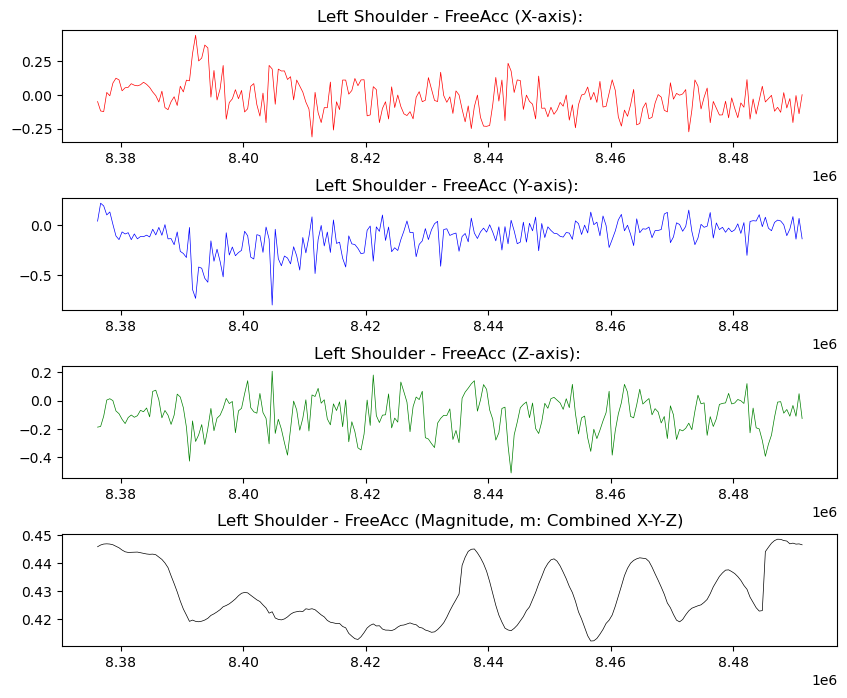

In [44]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_shoulder_data['m'] = magnitude(left_shoulder_data)
left_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - Quat')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - FreeAcc')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - Quat (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - Quat (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - Quat (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - FreeAcc (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Shoulder

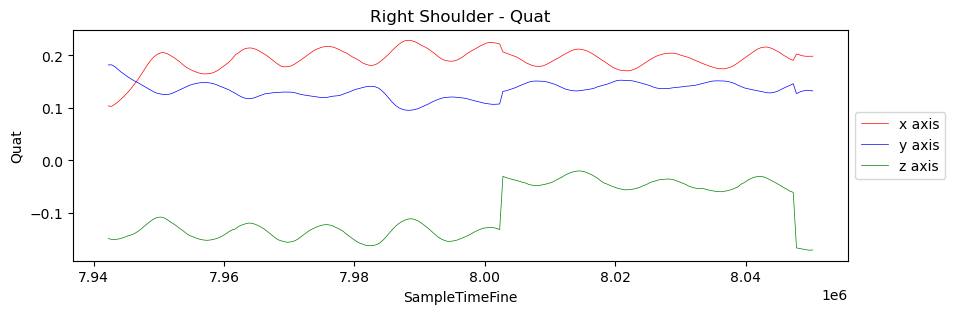

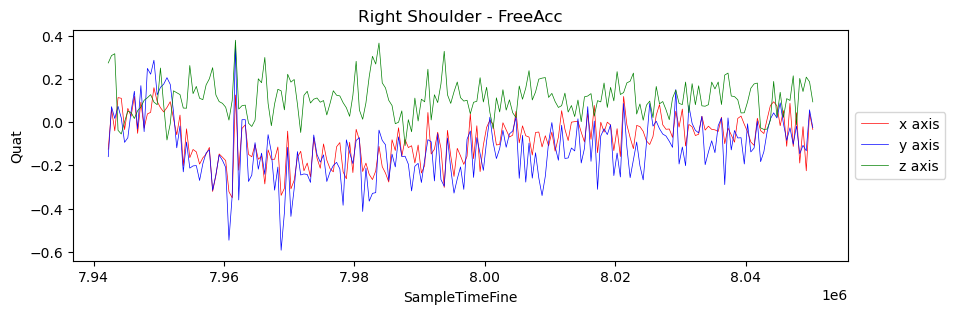

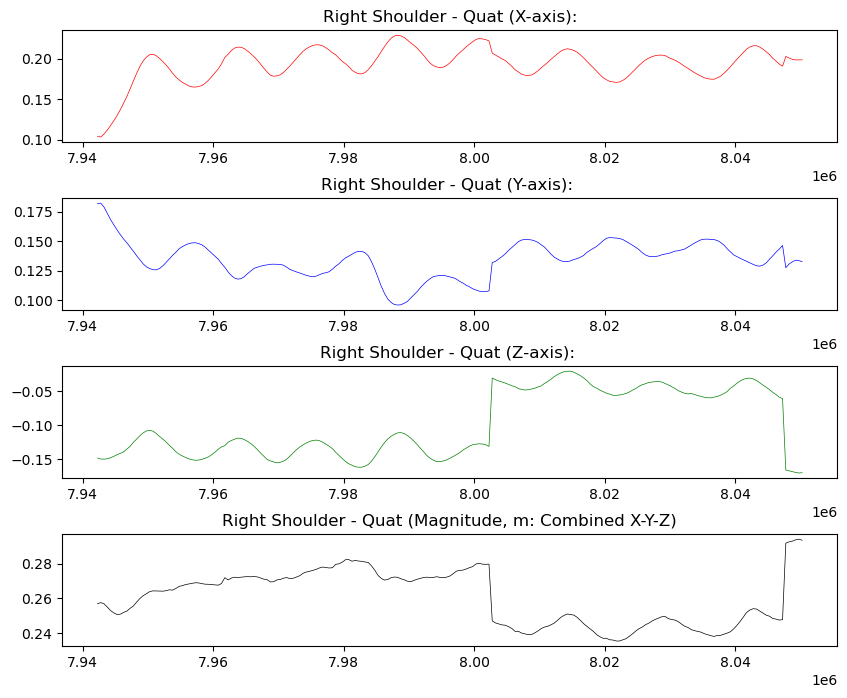

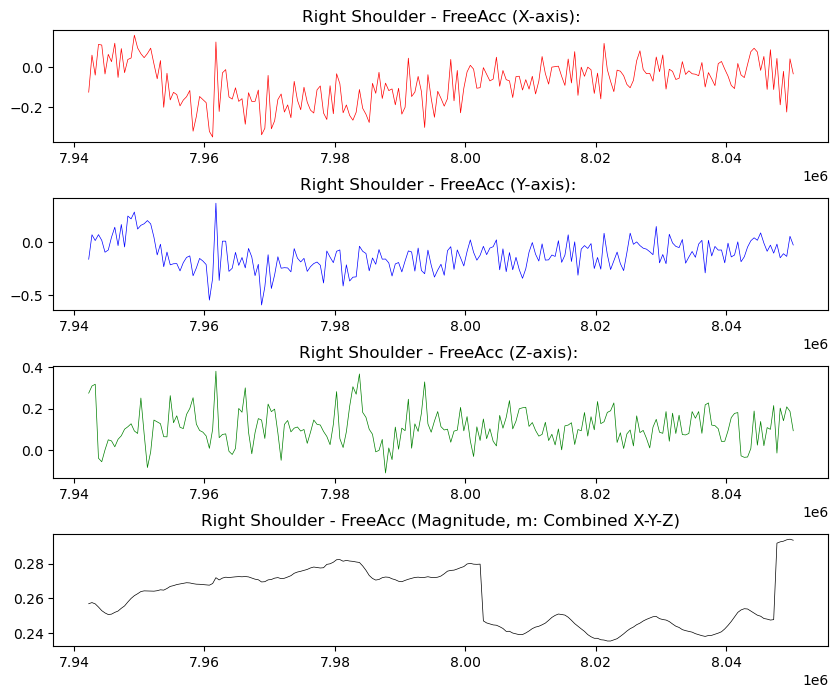

In [45]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_shoulder_data['m'] = magnitude(right_shoulder_data)
right_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - Quat')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - FreeAcc')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - Quat (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - Quat (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - Quat (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - FreeAcc (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

# =============================================================

# XSens DOT Data 5

In [46]:
import numpy as np
import ezc3d
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from keras.utils import to_categorical
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import classification_report
import os
import math

# Load and preprocess sensor data
left_wrist_data = pd.read_csv('DOT Data 5/leftwrist.csv')
right_wrist_data = pd.read_csv('DOT Data 5/rightwrist.csv')
left_elbow_data = pd.read_csv('DOT Data 5/leftelbow.csv')
right_elbow_data = pd.read_csv('DOT Data 5/rightelbow.csv')
left_shoulder_data = pd.read_csv('DOT Data 5/leftshoulder.csv')
right_shoulder_data = pd.read_csv('DOT Data 5/rightshoulder.csv')

def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_wrist_data['m'] = magnitude(left_wrist_data)
left_wrist_data.head()

,SampleTimeFine,Quat_W,Quat_X,Quat_Y,Quat_Z,FreeAcc_X,FreeAcc_Y,FreeAcc_Z,Status,m
0,10494794,0.6915,-0.3219,0.4748,-0.4389,-0.0158,-0.0339,0.0215,0.0,0.722280
1,10495294,0.6913,-0.3219,0.4751,-0.4390,0.0198,0.0190,-0.0132,0.0,0.722538
2,10495794,0.6912,-0.3213,0.4756,-0.4390,0.0229,0.0469,0.0679,0.0,0.722600
3,10496294,0.6911,-0.3208,0.4762,-0.4390,-0.0349,-0.0534,-0.0399,0.0,0.722772
4,10496794,0.6911,-0.3201,0.4766,-0.4391,0.0926,-0.0642,0.1050,0.0,0.722787


## Left Wrist

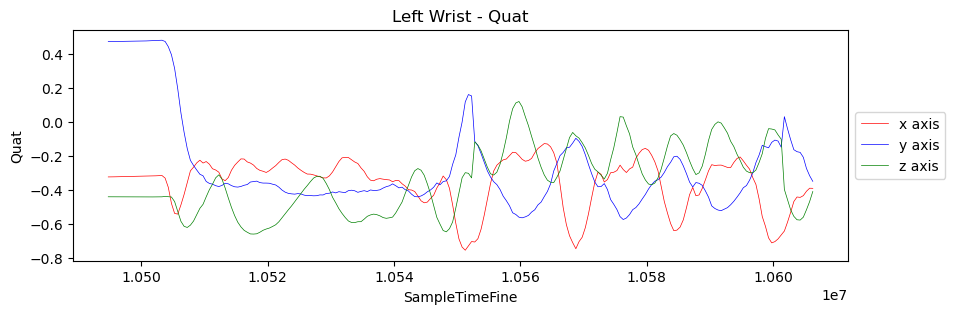

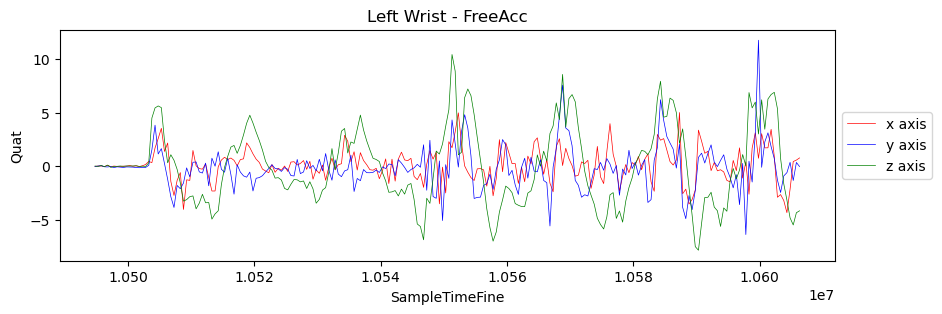

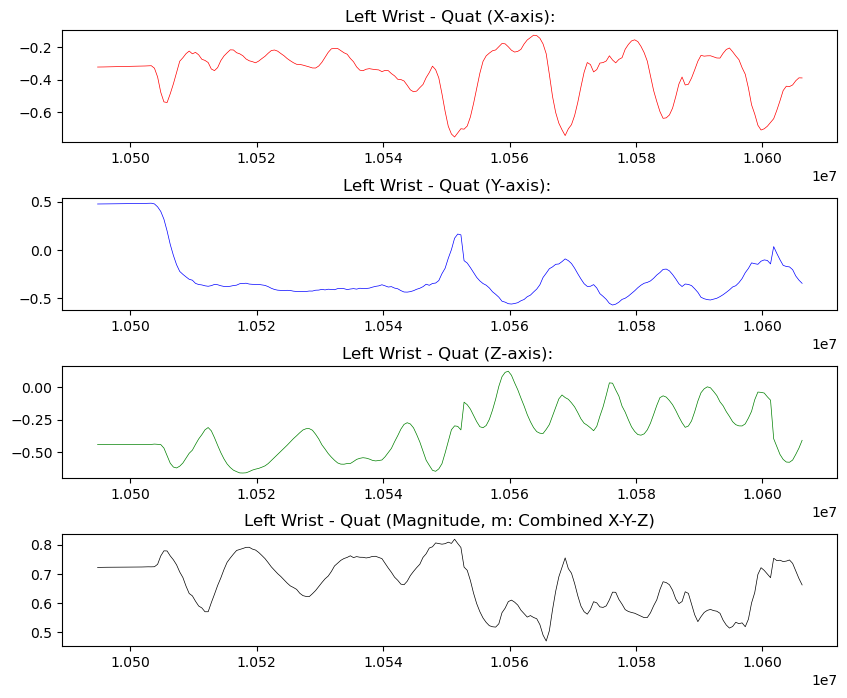

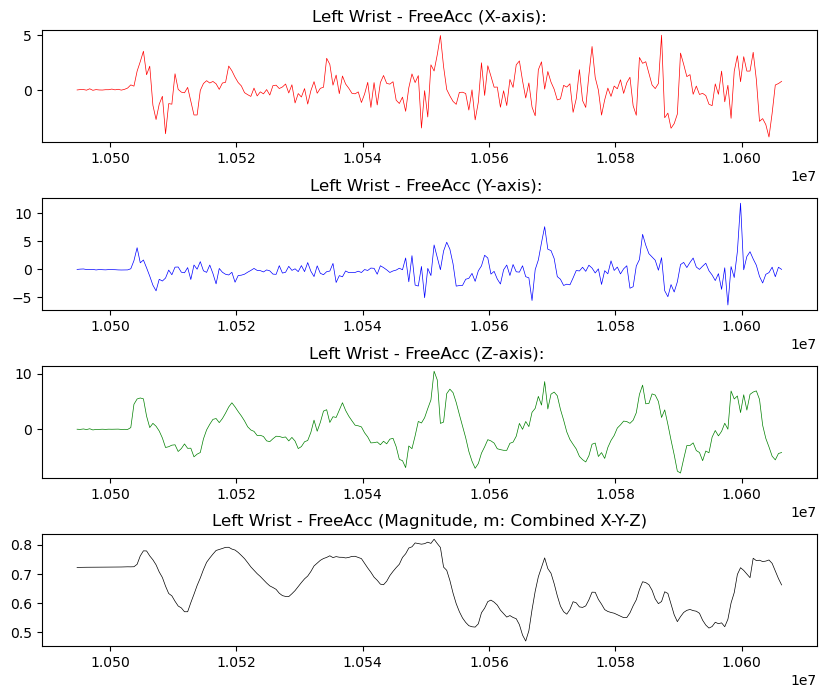

In [47]:
plt.figure(figsize=(10,3))
plt.title('Left Wrist - Quat')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Wrist - FreeAcc')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - Quat (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - Quat (Y-axis): ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - Quat (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - FreeAcc (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - FreeAcc (Y-axis): ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - FreeAcc (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Wrist

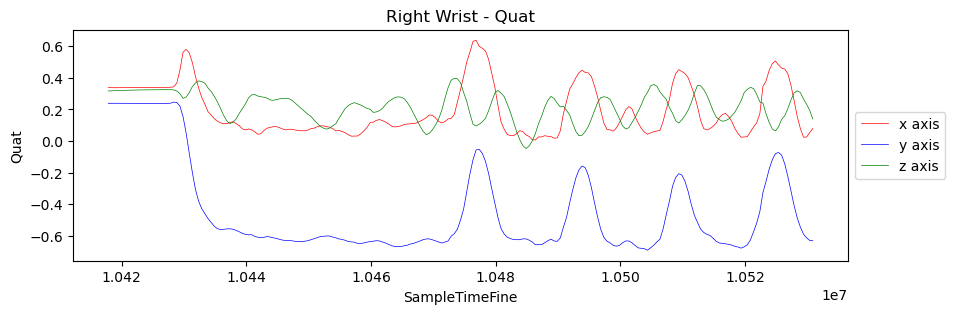

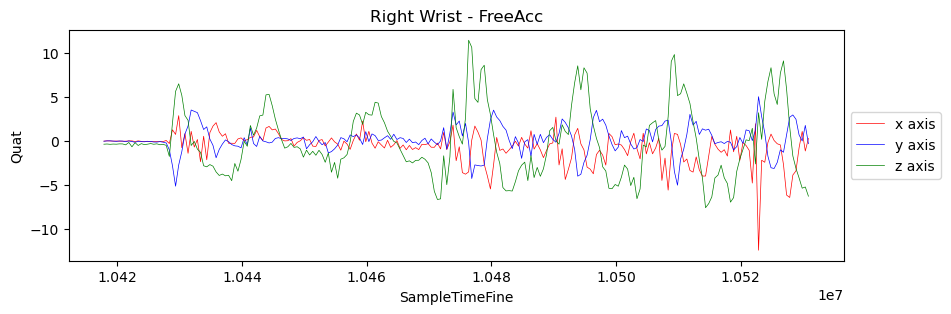

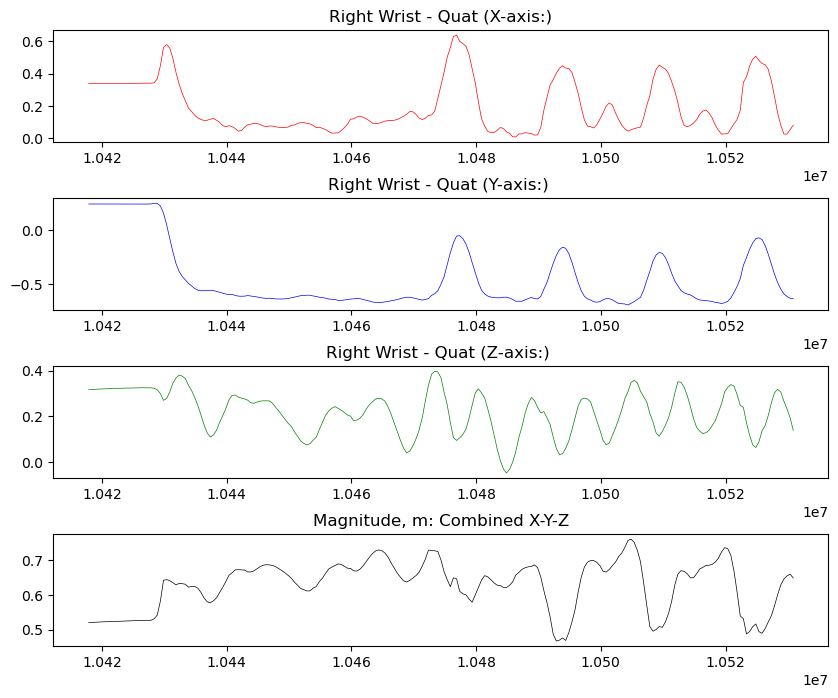

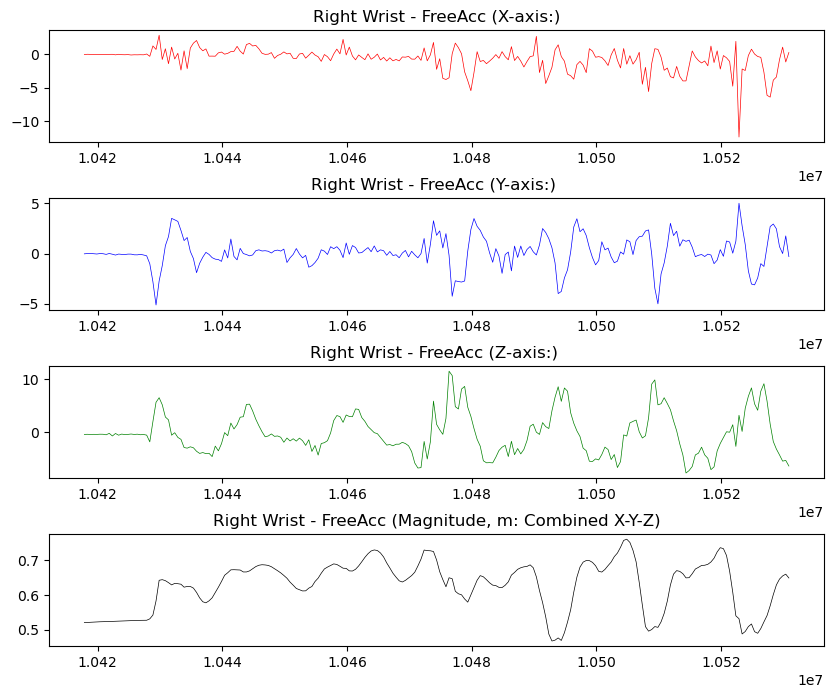

In [48]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_wrist_data['m'] = magnitude(right_wrist_data)
right_wrist_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Wrist - Quat')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Wrist - FreeAcc')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - Quat (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - Quat (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - Quat (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Magnitude, m: Combined X-Y-Z')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - FreeAcc (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Elbow

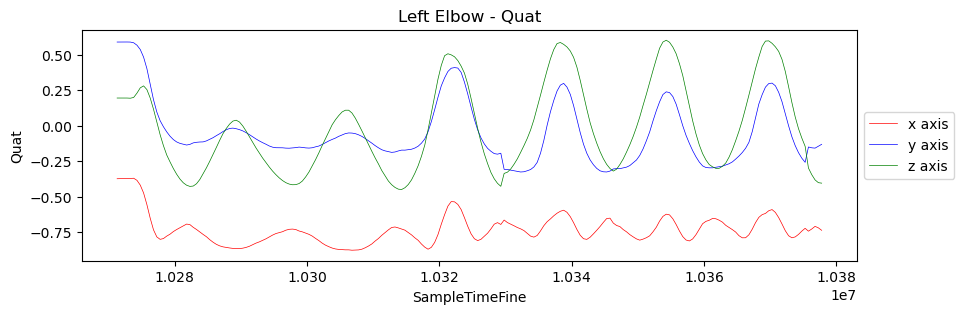

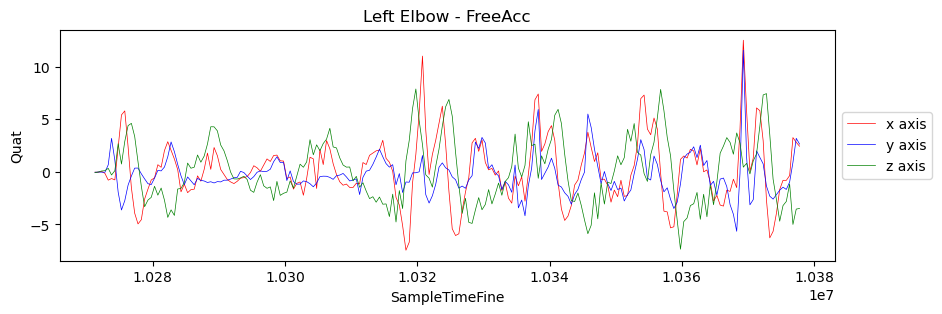

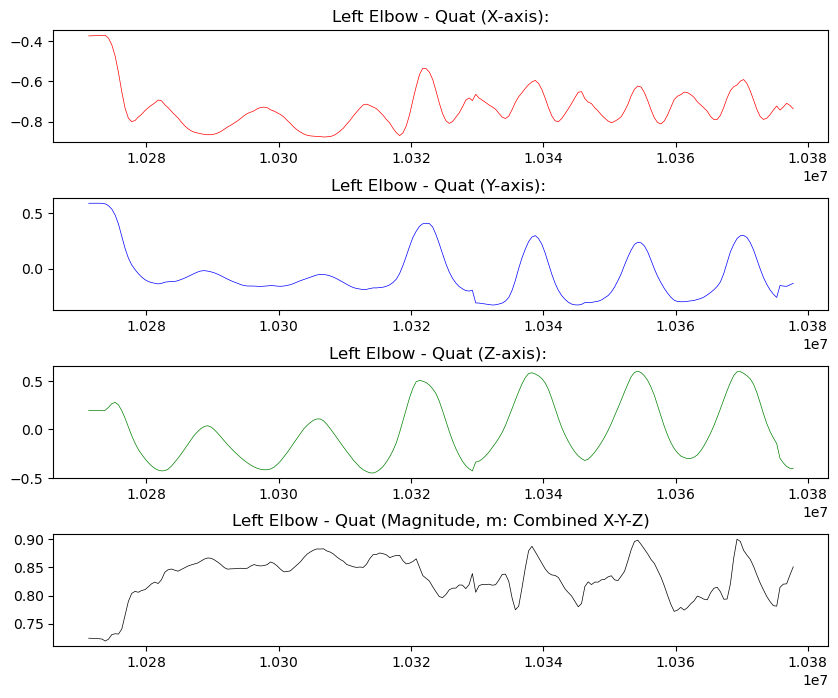

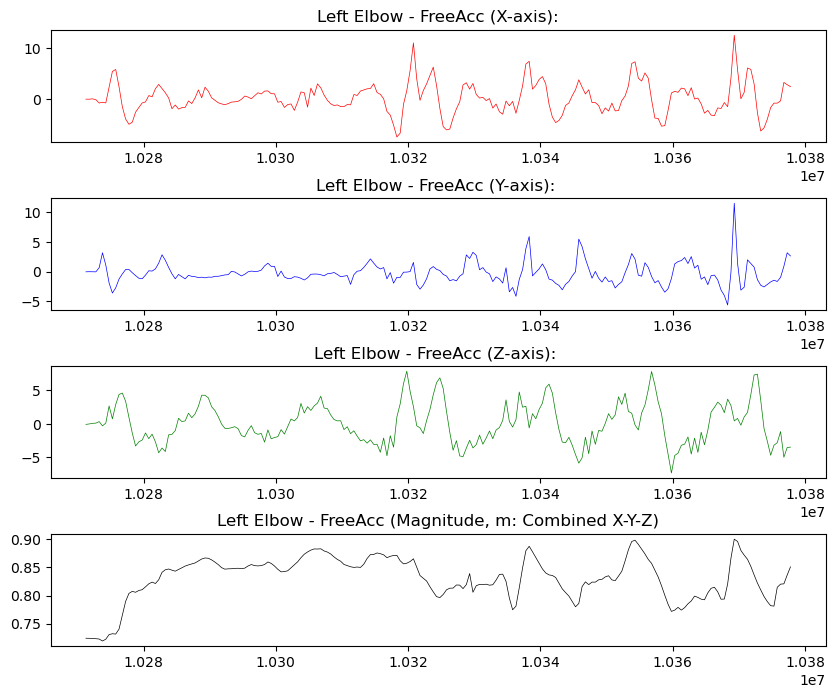

In [49]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_elbow_data['m'] = magnitude(left_elbow_data)
left_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Elbow - Quat')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Elbow - FreeAcc')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - Quat (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - Quat (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - Quat (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - FreeAcc (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - FreeAcc (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - FreeAcc (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Elbow

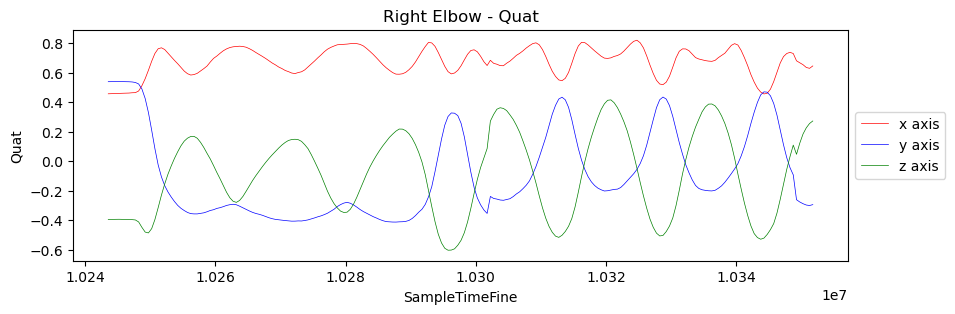

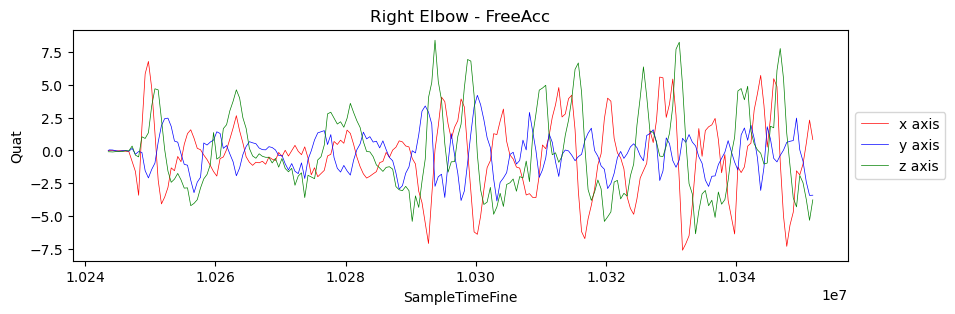

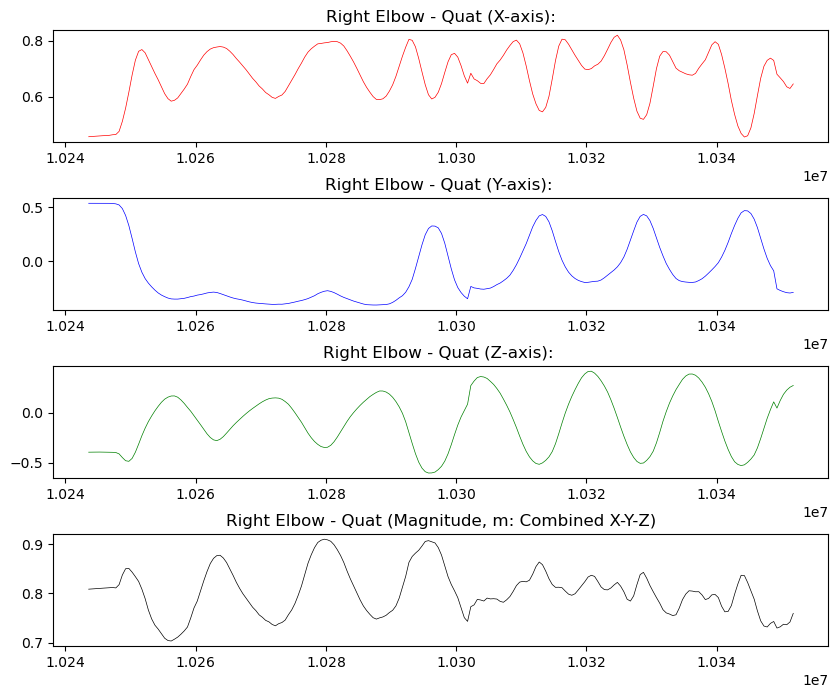

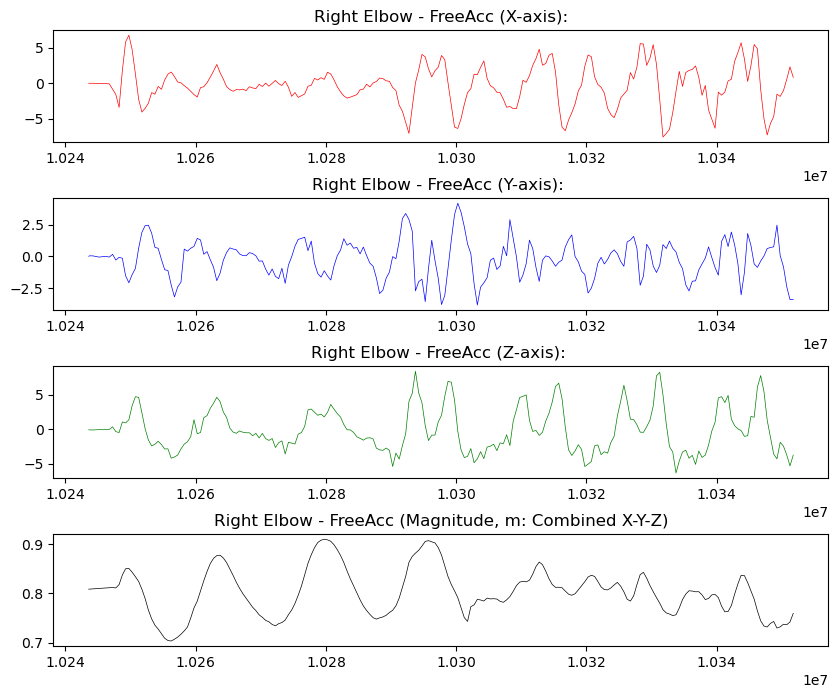

In [50]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_elbow_data['m'] = magnitude(right_elbow_data)
right_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Elbow - Quat')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Elbow - FreeAcc')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - Quat (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - Quat (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - Quat (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - FreeAcc (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - FreeAcc (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - FreeAcc (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Shoulder

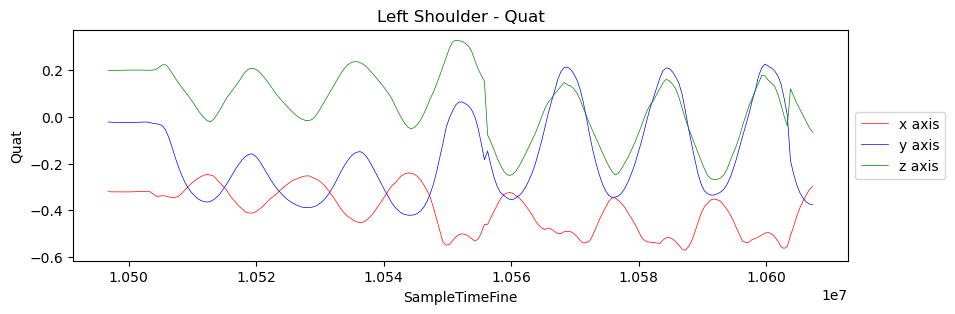

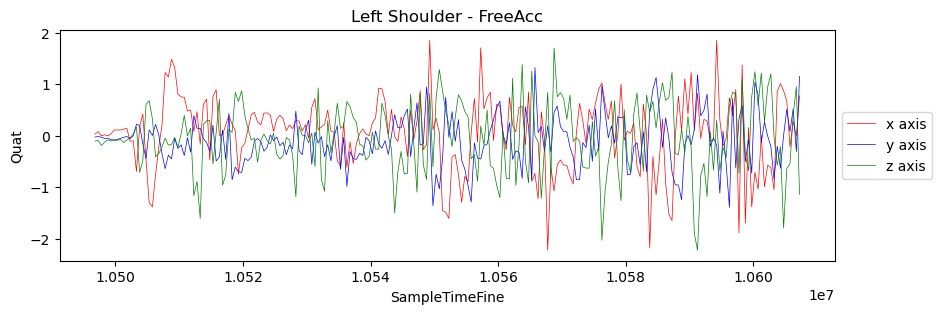

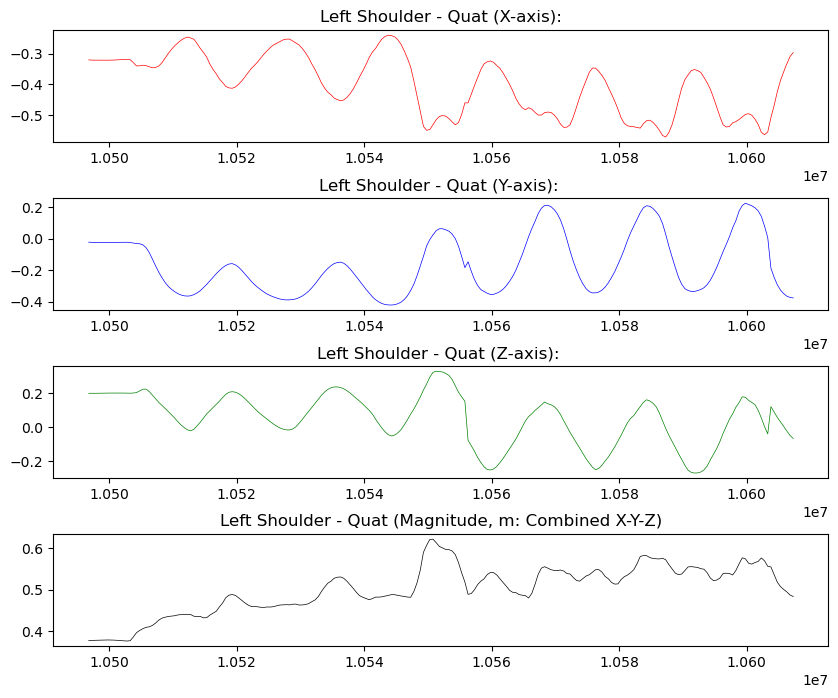

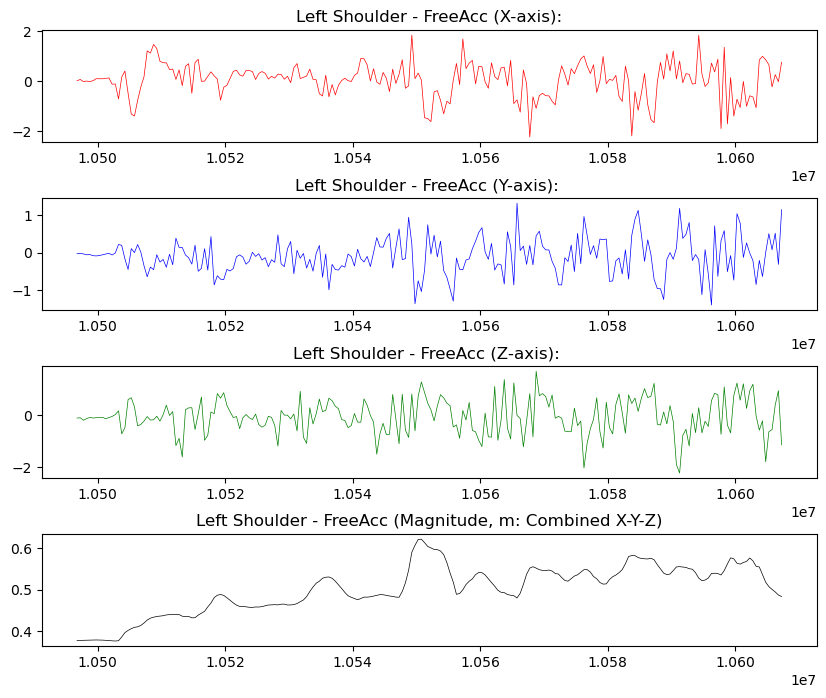

In [51]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_shoulder_data['m'] = magnitude(left_shoulder_data)
left_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - Quat')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - FreeAcc')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - Quat (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - Quat (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - Quat (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - FreeAcc (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Shoulder

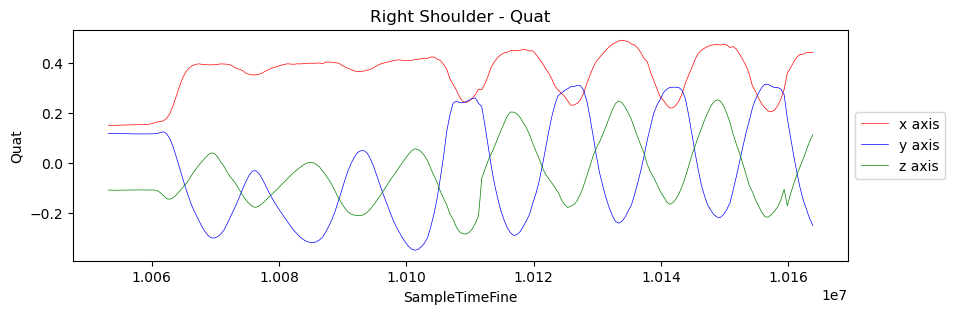

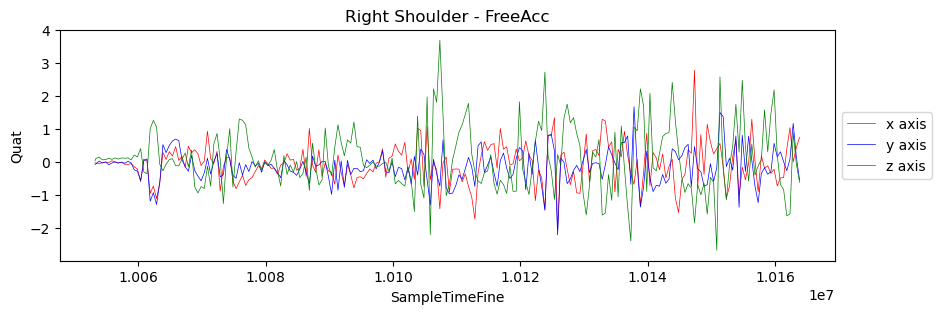

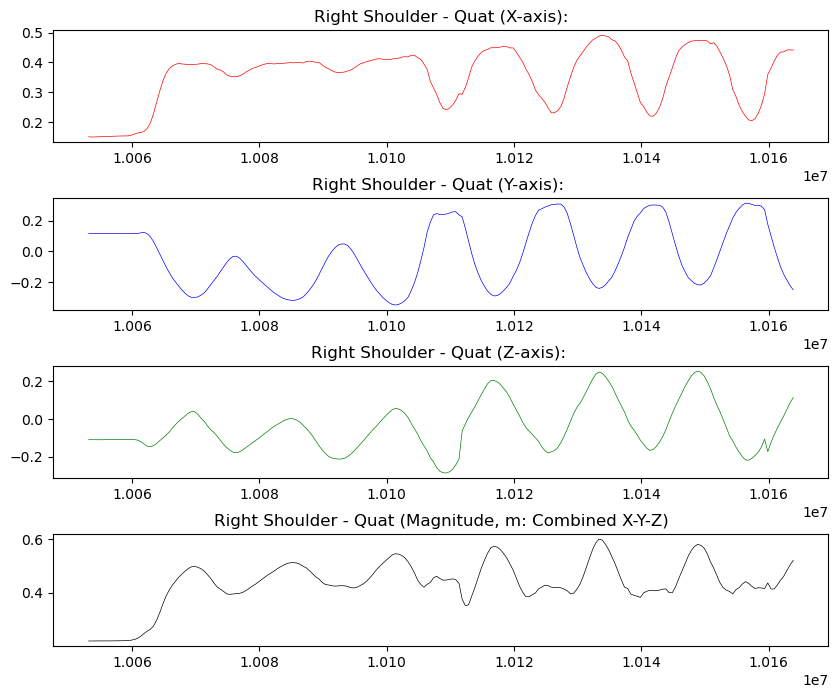

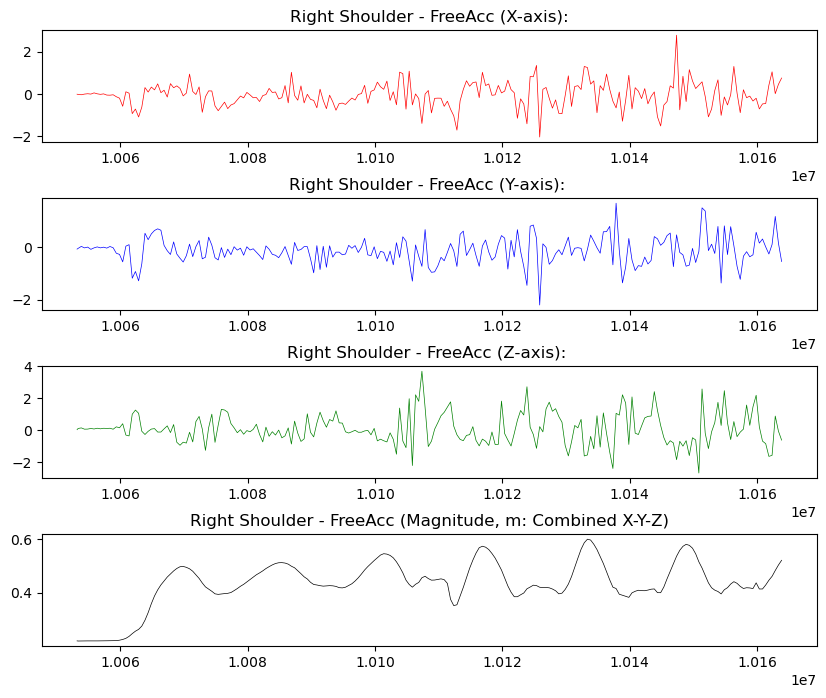

In [52]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_shoulder_data['m'] = magnitude(right_shoulder_data)
right_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - Quat')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - FreeAcc')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - Quat (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - Quat (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - Quat (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - FreeAcc (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

# ============================================================

# XSens DOT Data 6

In [53]:
import numpy as np
import ezc3d
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from keras.utils import to_categorical
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import classification_report
import os
import math

# Load and preprocess sensor data
left_wrist_data = pd.read_csv('DOT Data 6/leftwrist.csv')
right_wrist_data = pd.read_csv('DOT Data 6/rightwrist.csv')
left_elbow_data = pd.read_csv('DOT Data 6/leftelbow.csv')
right_elbow_data = pd.read_csv('DOT Data 6/rightelbow.csv')
left_shoulder_data = pd.read_csv('DOT Data 6/leftshoulder.csv')
right_shoulder_data = pd.read_csv('DOT Data 6/rightshoulder.csv')

def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_wrist_data['m'] = magnitude(left_wrist_data)
left_wrist_data.head()

,SampleTimeFine,Quat_W,Quat_X,Quat_Y,Quat_Z,FreeAcc_X,FreeAcc_Y,FreeAcc_Z,Status,m
0,11789630,0.6962,-0.2732,0.6432,-0.1643,0.0099,0.0885,0.0809,0.0,0.717871
1,11789797,0.6964,-0.2727,0.6432,-0.1638,0.0270,0.0503,0.0456,0.0,0.717567
2,11790297,0.6967,-0.2718,0.6435,-0.1632,0.0205,0.0058,-0.0410,0.0,0.717357
3,11790797,0.6964,-0.2717,0.6440,-0.1629,-0.0089,-0.0045,0.0379,0.0,0.717700
4,11791297,0.6958,-0.2716,0.6445,-0.1632,0.0587,-0.0254,0.0233,0.0,0.718179


## Left Wrist

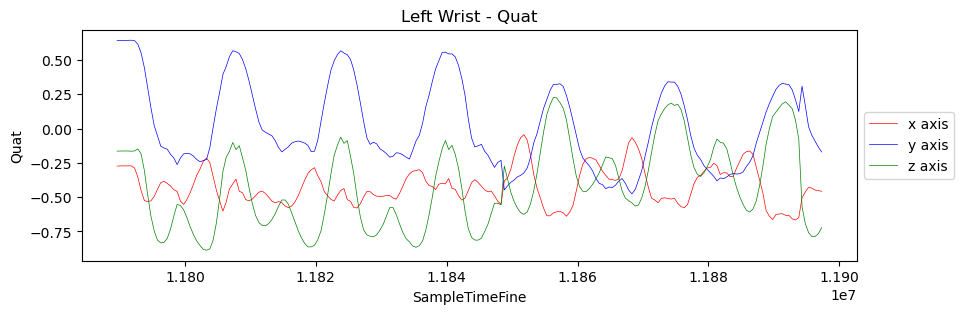

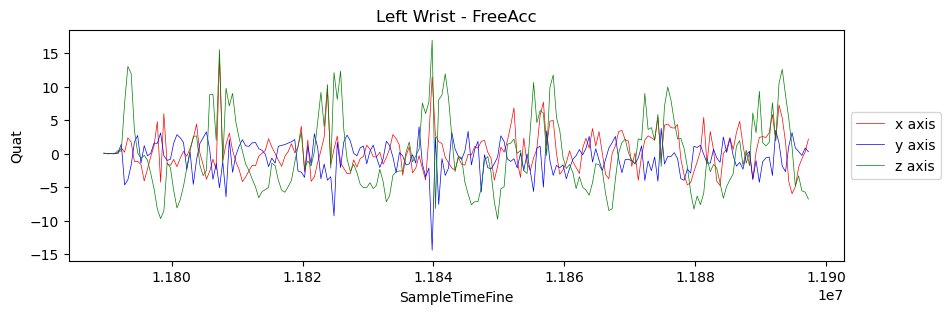

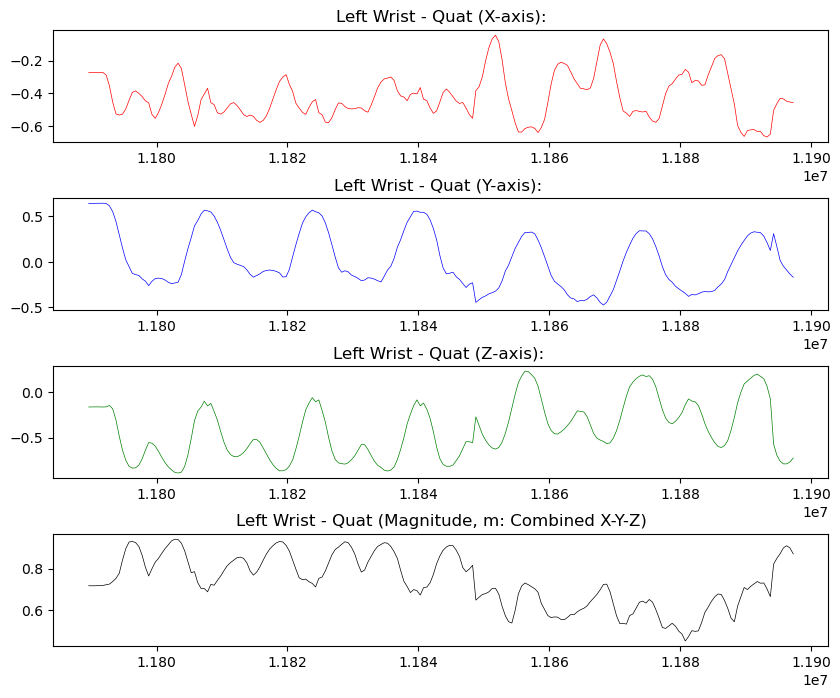

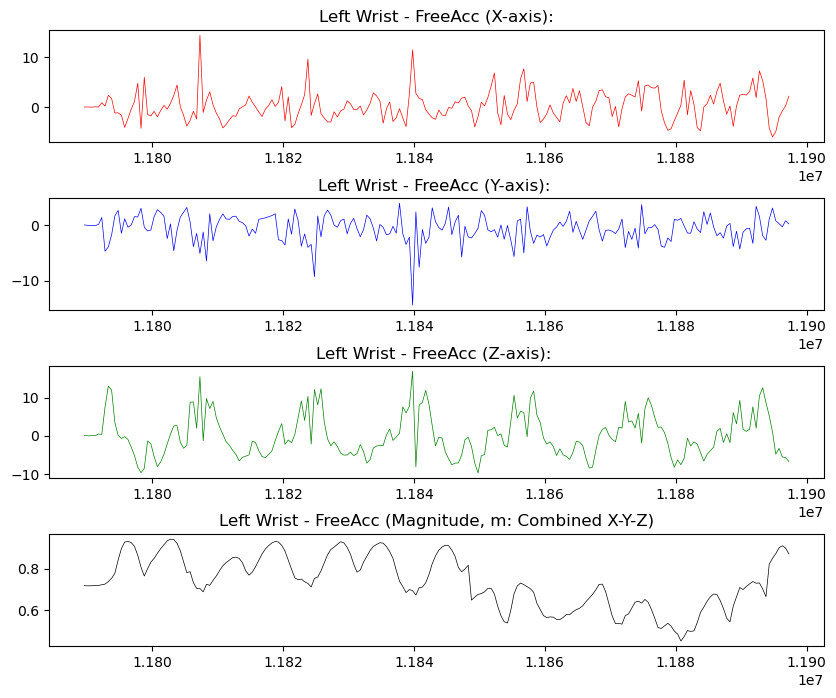

In [54]:
plt.figure(figsize=(10,3))
plt.title('Left Wrist - Quat')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Wrist - FreeAcc')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - Quat (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - Quat (Y-axis): ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - Quat (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - FreeAcc (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - FreeAcc (Y-axis): ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - FreeAcc (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Wrist

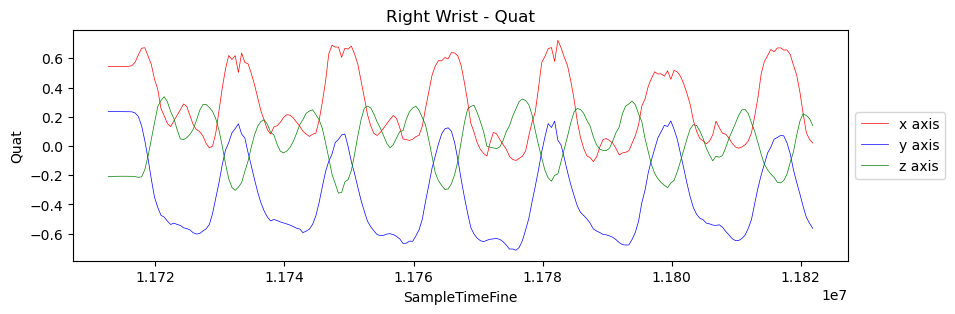

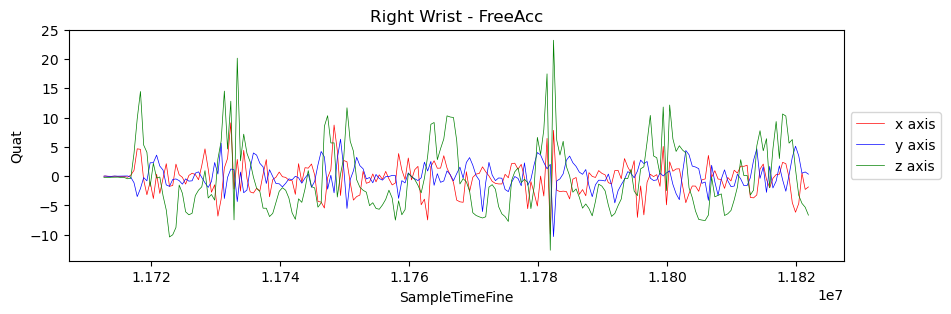

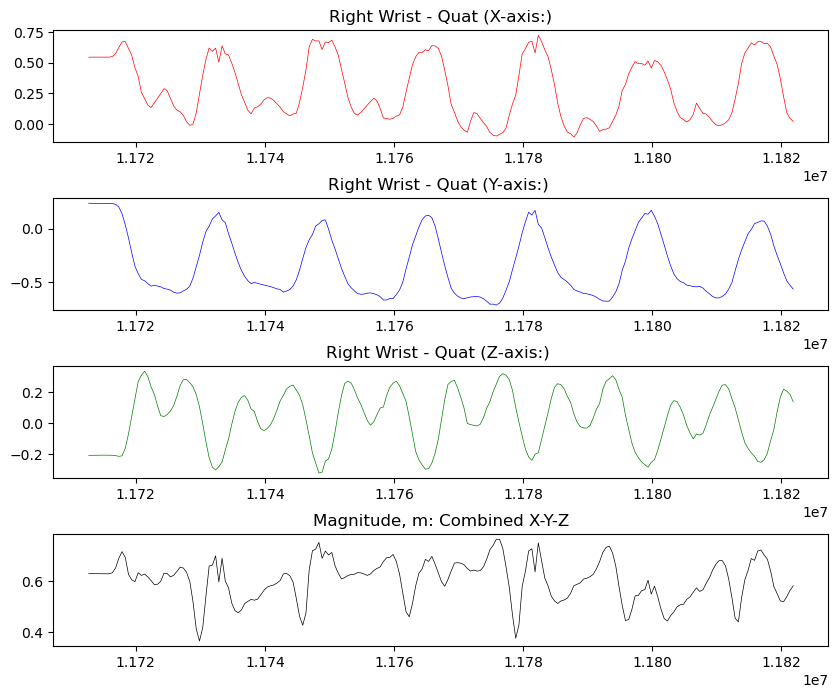

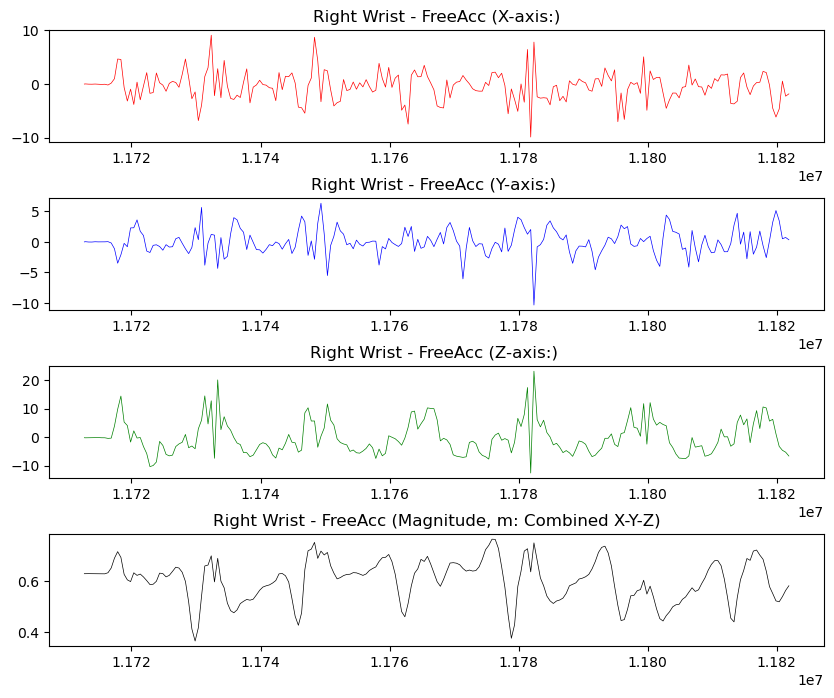

In [55]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_wrist_data['m'] = magnitude(right_wrist_data)
right_wrist_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Wrist - Quat')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Wrist - FreeAcc')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - Quat (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - Quat (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - Quat (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Magnitude, m: Combined X-Y-Z')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - FreeAcc (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Elbow

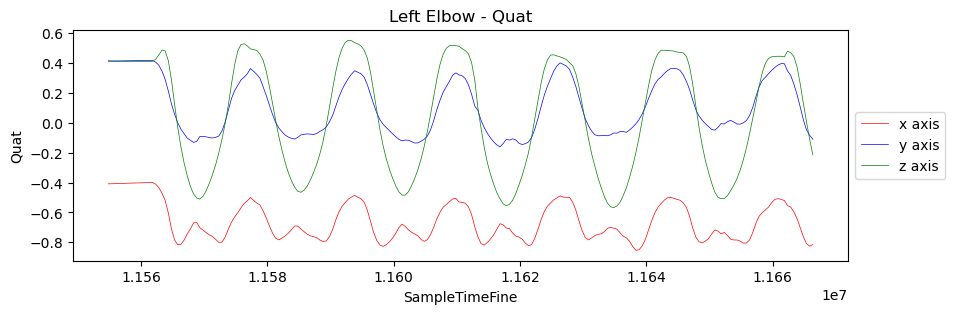

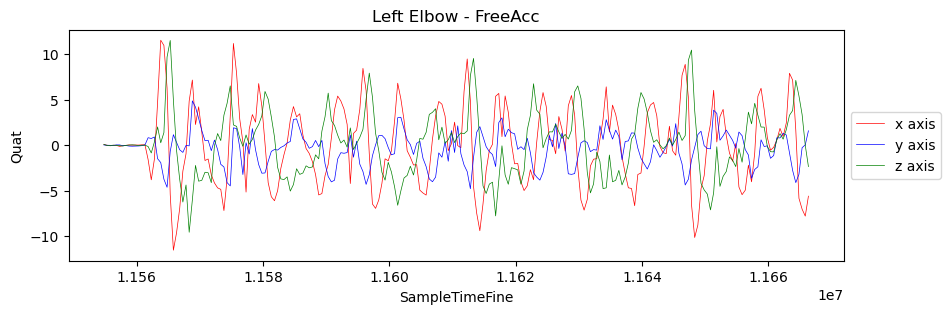

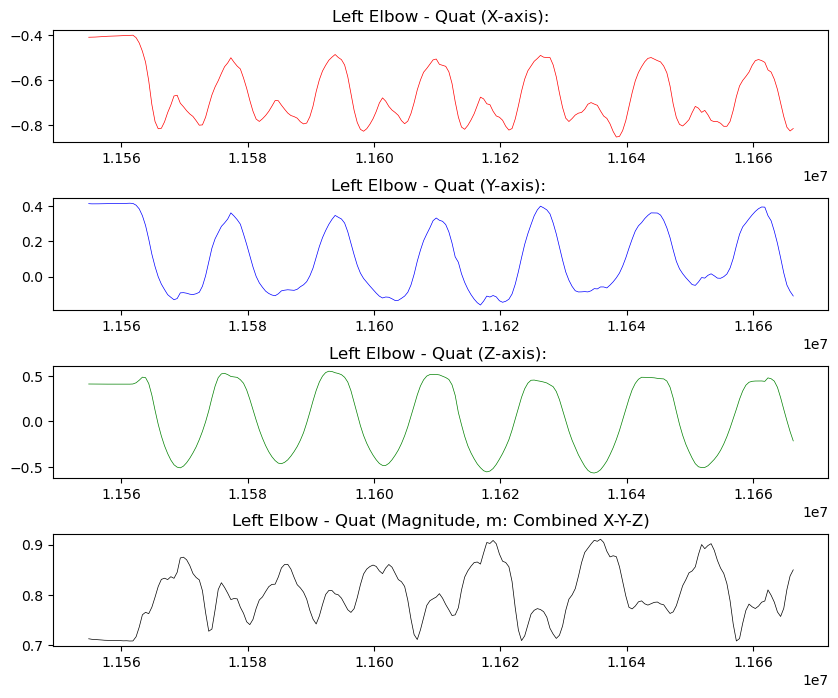

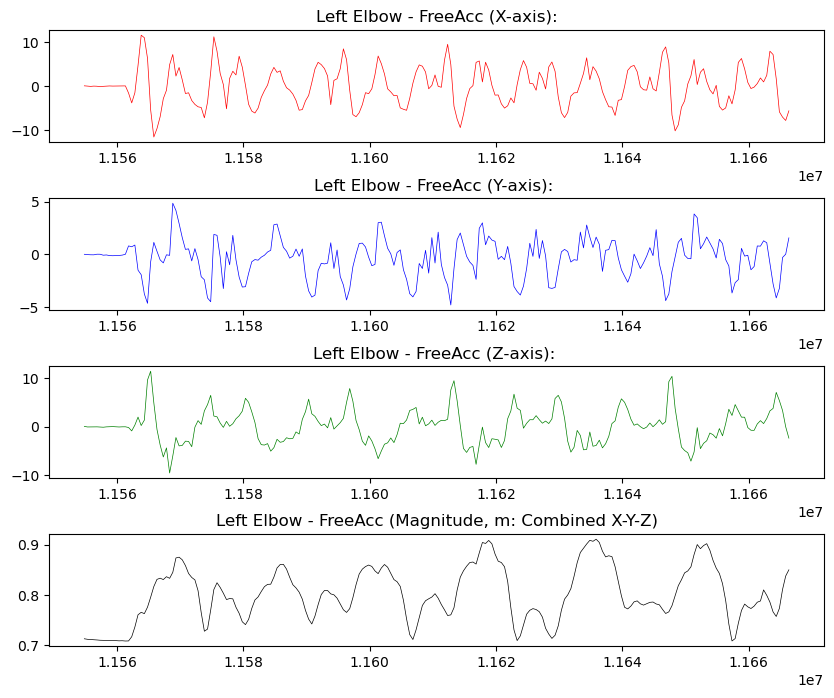

In [56]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_elbow_data['m'] = magnitude(left_elbow_data)
left_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Elbow - Quat')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Elbow - FreeAcc')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - Quat (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - Quat (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - Quat (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - FreeAcc (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - FreeAcc (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - FreeAcc (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Elbow

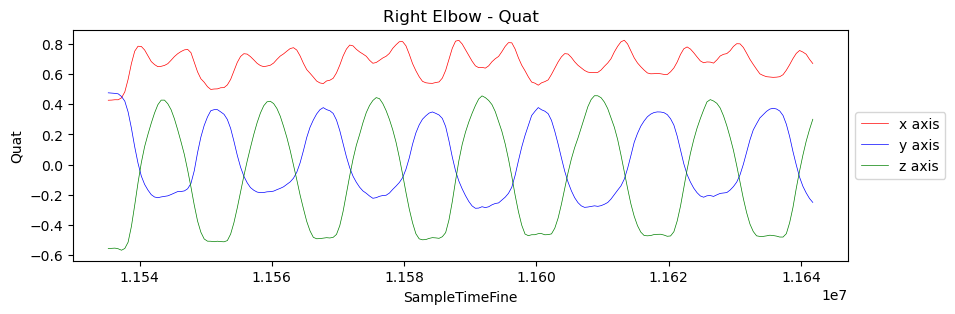

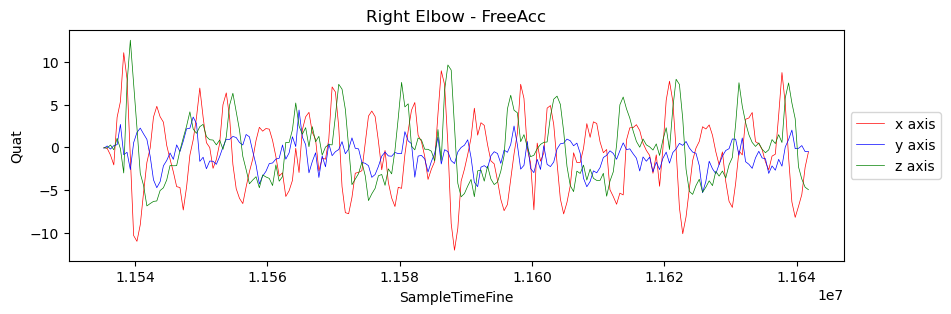

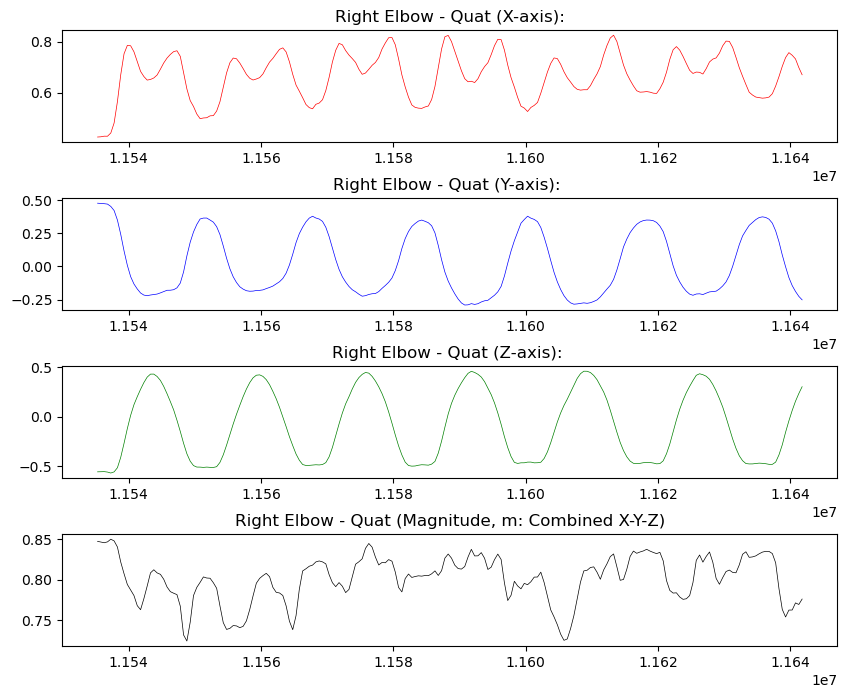

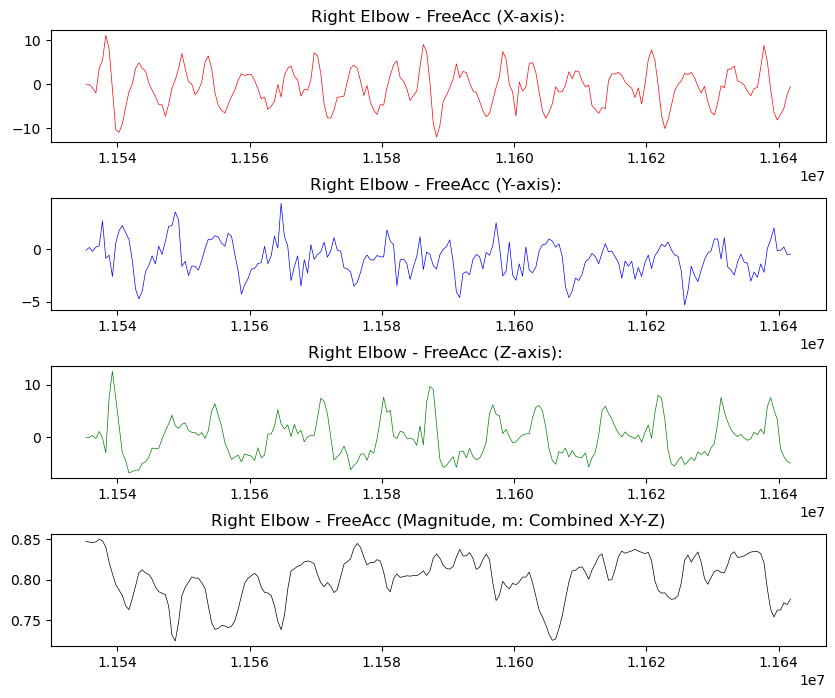

In [57]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_elbow_data['m'] = magnitude(right_elbow_data)
right_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Elbow - Quat')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Elbow - FreeAcc')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - Quat (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - Quat (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - Quat (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - FreeAcc (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - FreeAcc (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - FreeAcc (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Shoulder

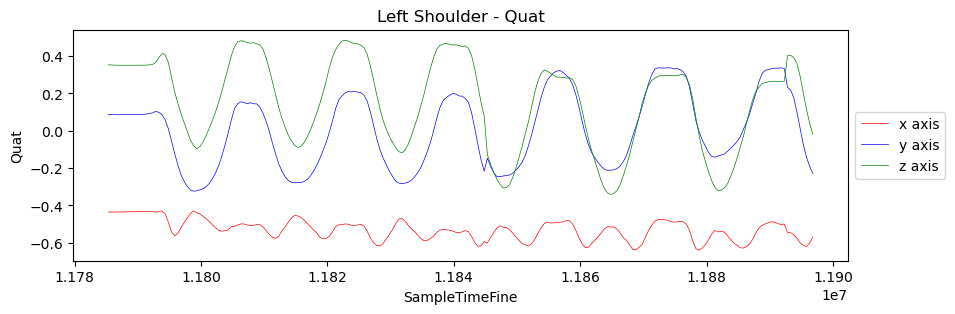

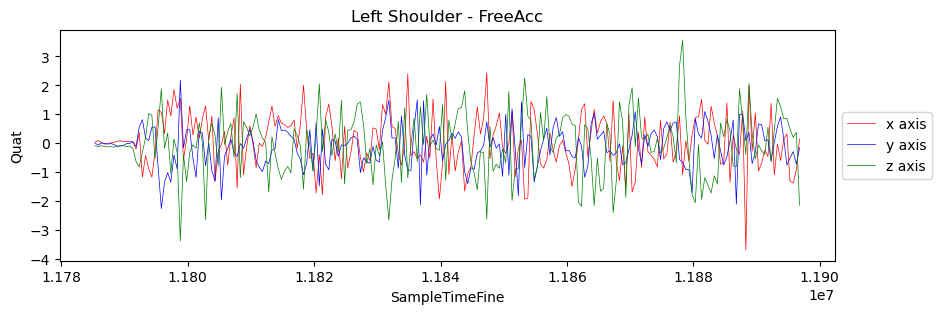

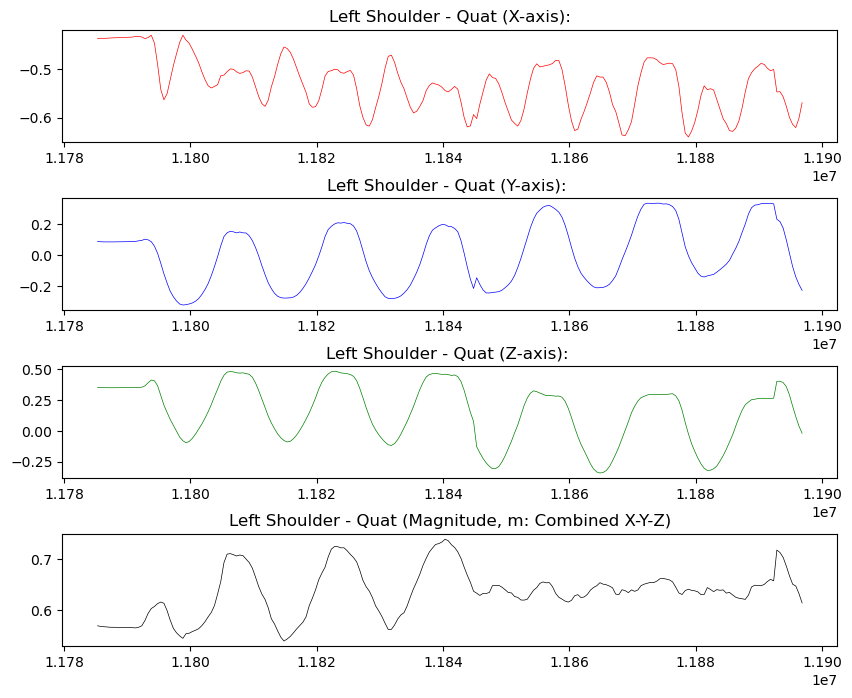

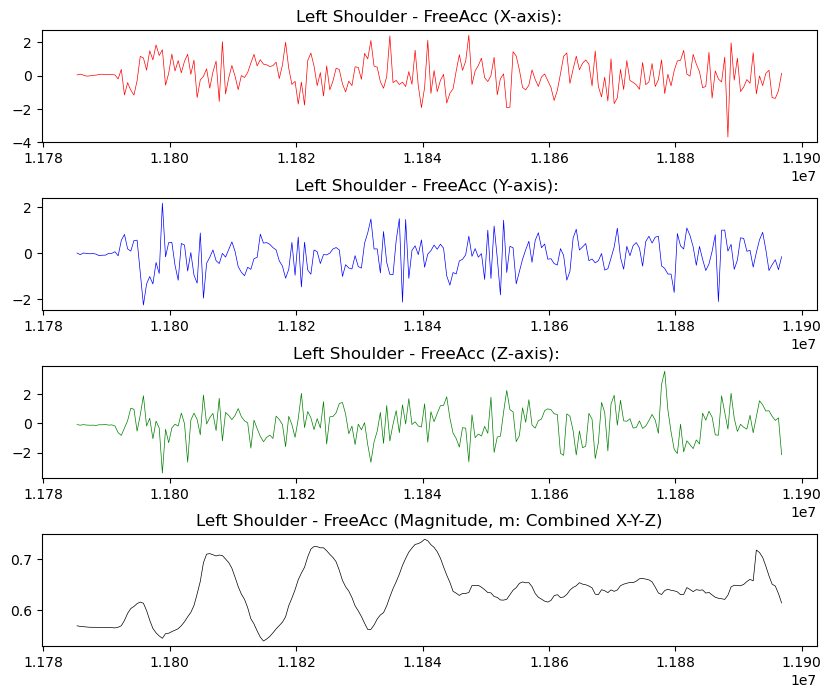

In [58]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_shoulder_data['m'] = magnitude(left_shoulder_data)
left_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - Quat')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - FreeAcc')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - Quat (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - Quat (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - Quat (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - FreeAcc (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Shoulder

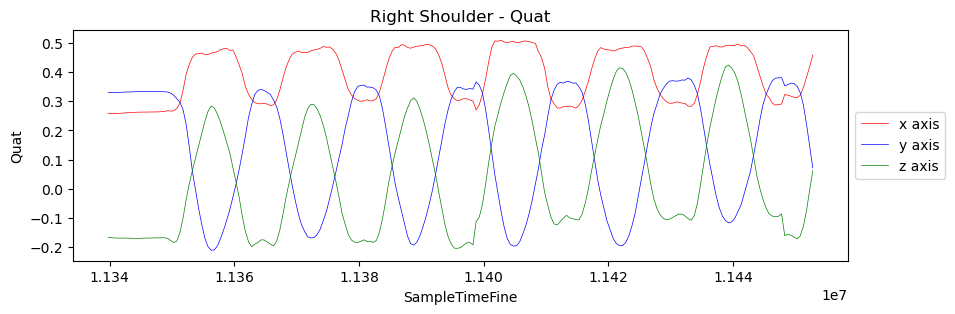

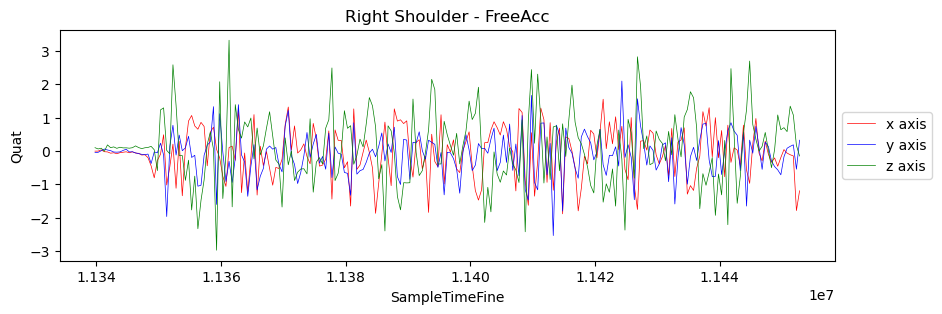

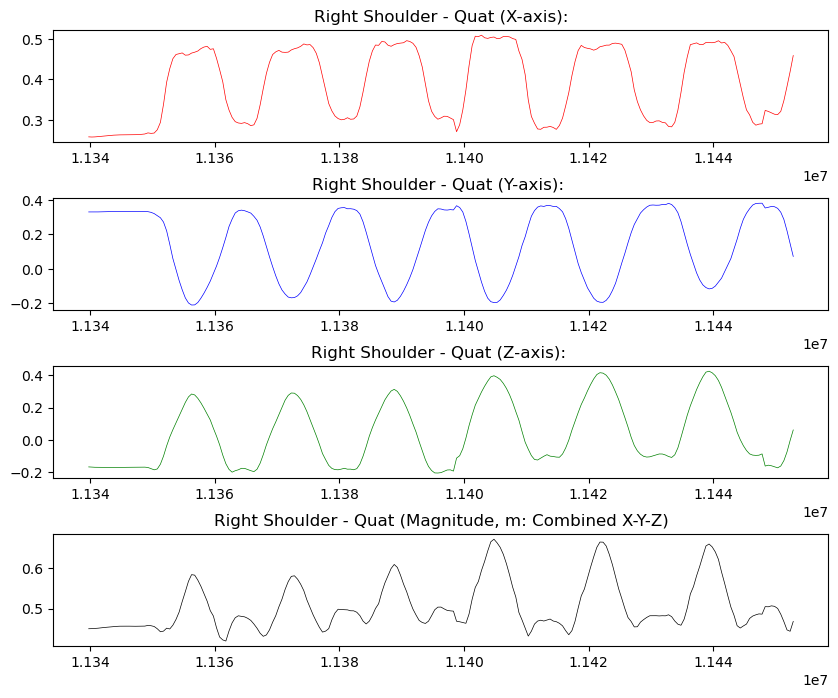

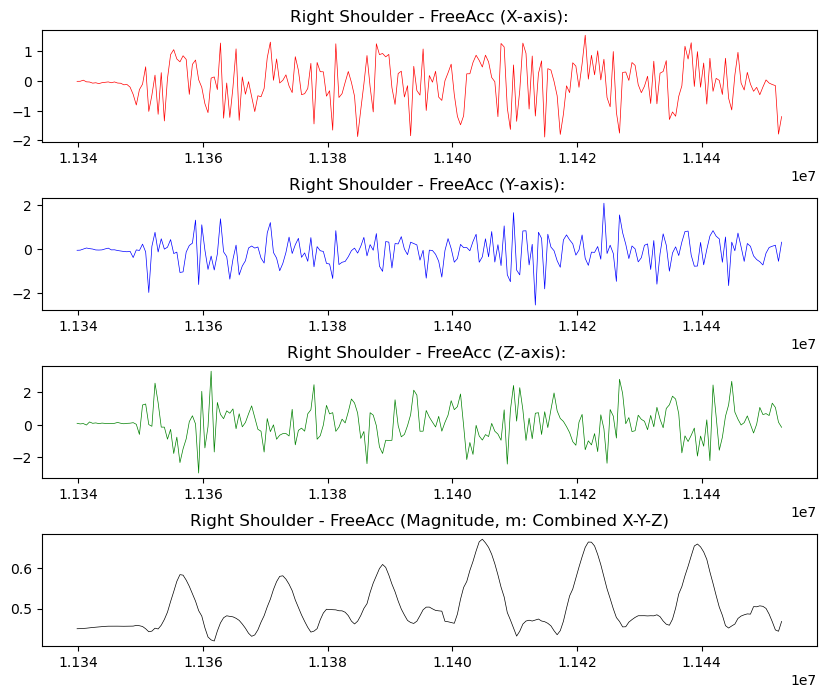

In [59]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_shoulder_data['m'] = magnitude(right_shoulder_data)
right_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - Quat')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - FreeAcc')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - Quat (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - Quat (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - Quat (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - FreeAcc (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

# =============================================================

# XSens DOT Data 7

In [60]:
import numpy as np
import ezc3d
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from keras.utils import to_categorical
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import classification_report
import os
import math

# Load and preprocess sensor data
left_wrist_data = pd.read_csv('DOT Data 7/leftwrist.csv')
right_wrist_data = pd.read_csv('DOT Data 7/rightwrist.csv')
left_elbow_data = pd.read_csv('DOT Data 7/leftelbow.csv')
right_elbow_data = pd.read_csv('DOT Data 7/rightelbow.csv')
left_shoulder_data = pd.read_csv('DOT Data 7/leftshoulder.csv')
right_shoulder_data = pd.read_csv('DOT Data 7/rightshoulder.csv')

def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_wrist_data['m'] = magnitude(left_wrist_data)
left_wrist_data.head()

,SampleTimeFine,Quat_W,Quat_X,Quat_Y,Quat_Z,FreeAcc_X,FreeAcc_Y,FreeAcc_Z,Status,m
0,13943389,0.5342,-0.5047,0.5045,-0.4532,0.1358,-0.2671,0.2885,0.0,0.845359
1,13943889,0.5313,-0.5098,0.4995,-0.4564,-0.0663,-0.1892,0.0874,0.0,0.847170
2,13944389,0.5277,-0.5143,0.4995,-0.4556,-0.1253,-0.0302,-0.2046,0.0,0.849456
3,13944889,0.5266,-0.5161,0.5004,-0.4539,-0.2044,-0.0008,0.1120,0.0,0.850167
4,13945389,0.5260,-0.5163,0.5012,-0.4534,-0.0939,0.0885,0.0541,0.0,0.850493


## Left Wrist

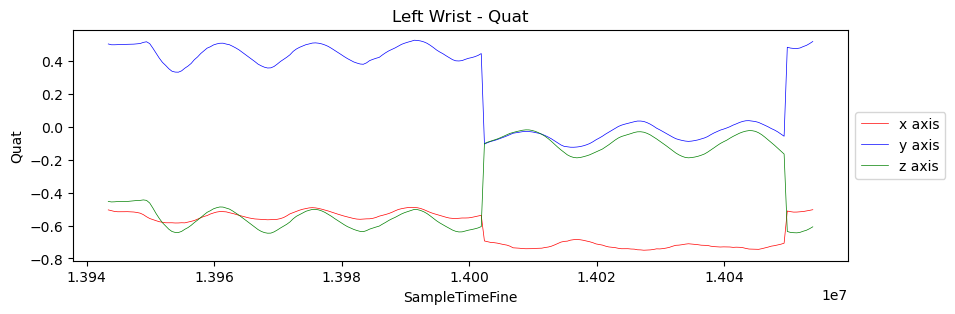

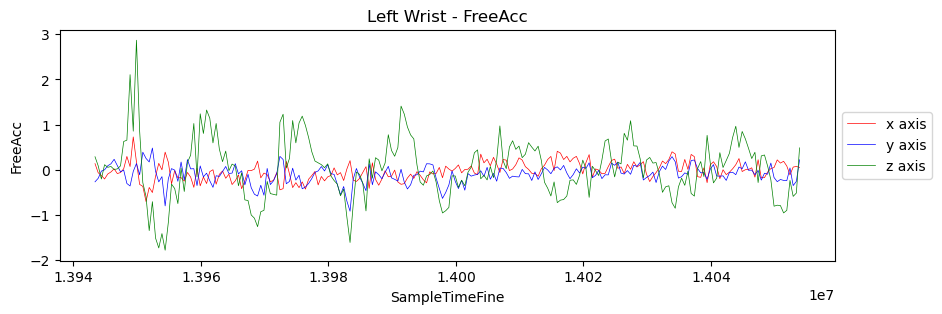

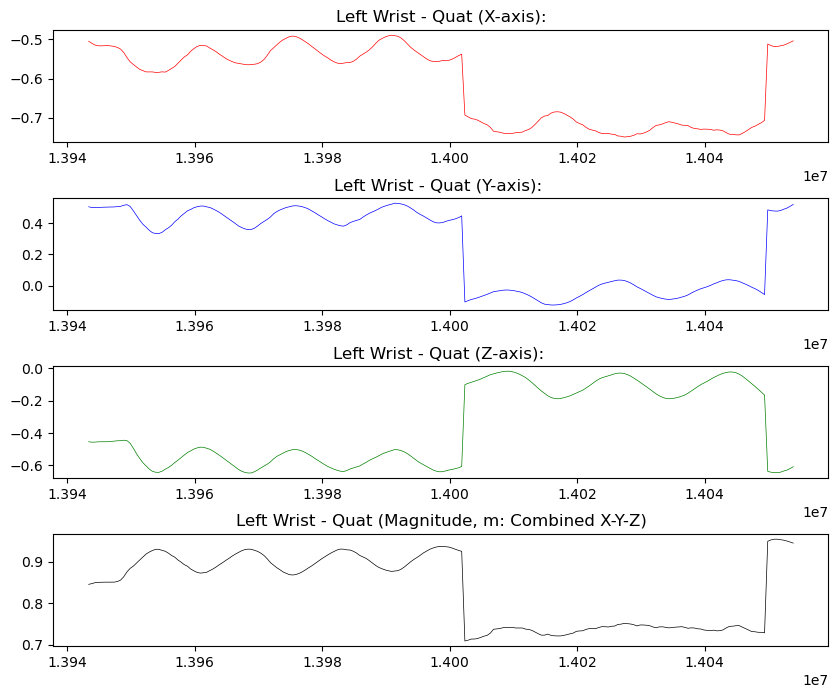

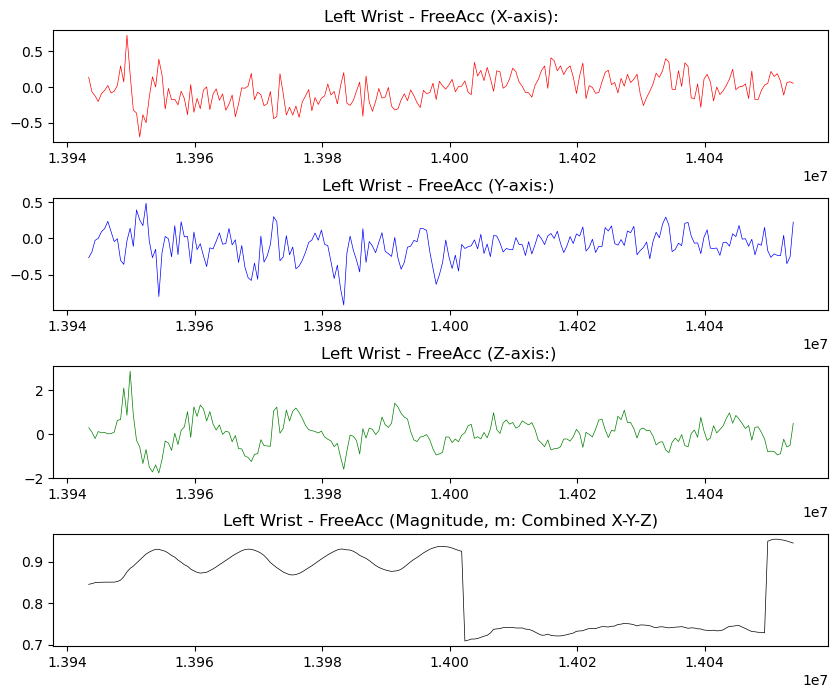

In [61]:
plt.figure(figsize=(10,3))
plt.title('Left Wrist - Quat')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Wrist - FreeAcc')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('FreeAcc')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - Quat (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - Quat (Y-axis): ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - Quat (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - FreeAcc (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Wrist

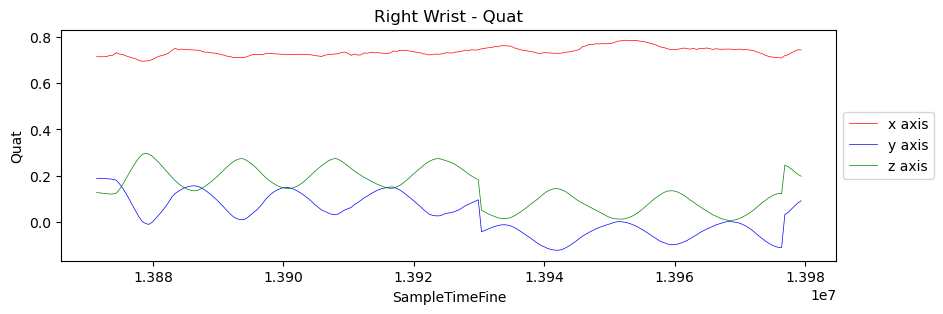

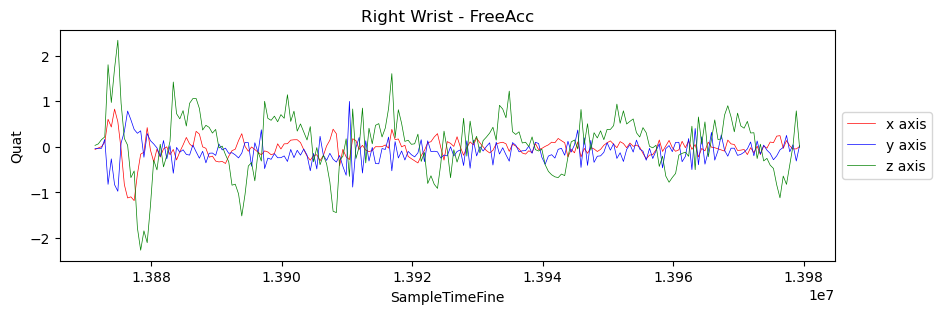

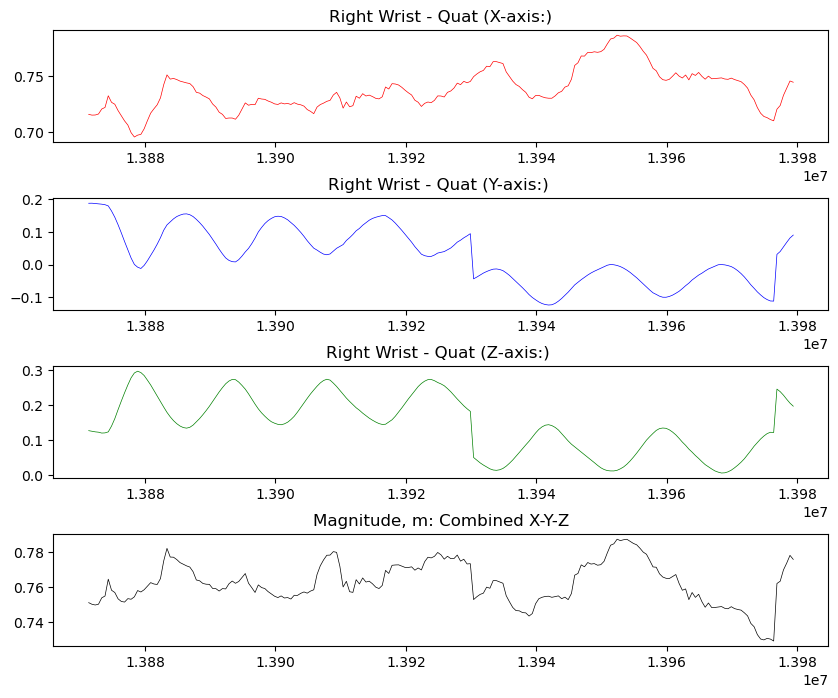

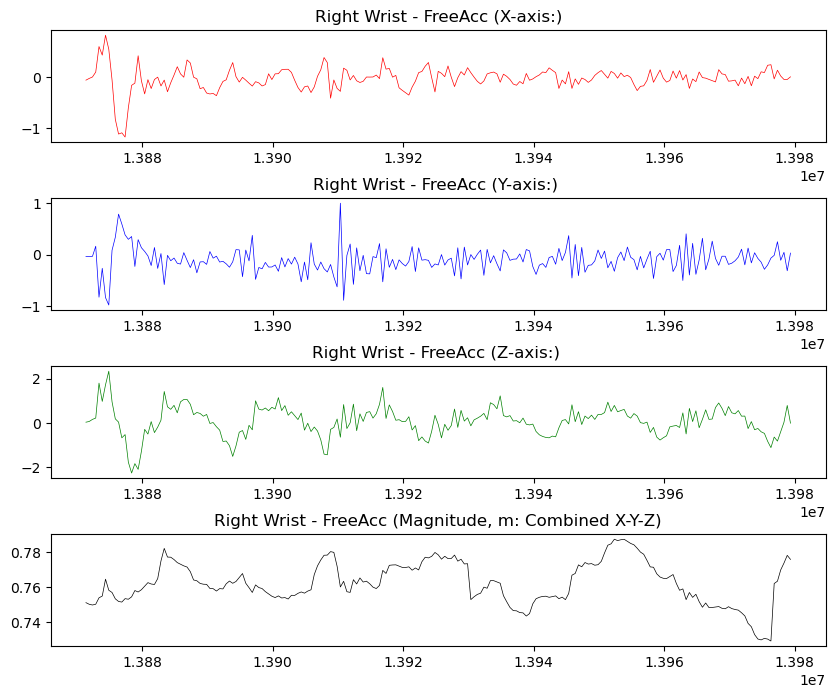

In [62]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_wrist_data['m'] = magnitude(right_wrist_data)
right_wrist_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Wrist - Quat')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Wrist - FreeAcc')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - Quat (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - Quat (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - Quat (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Magnitude, m: Combined X-Y-Z')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - FreeAcc (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Elbow

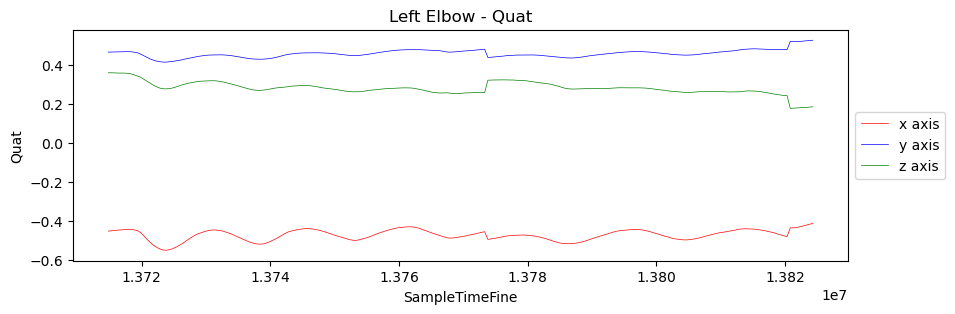

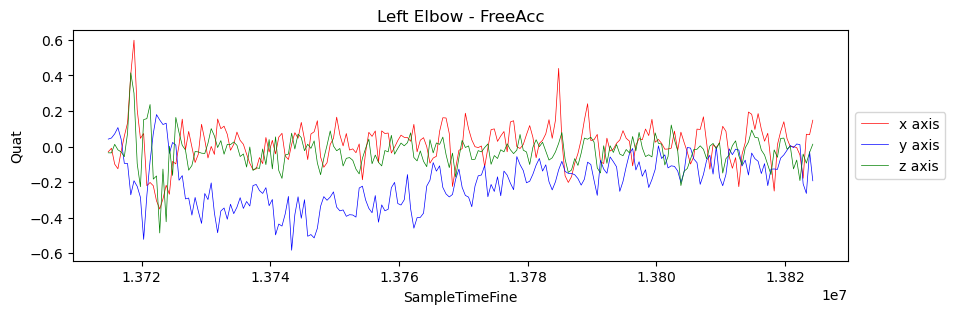

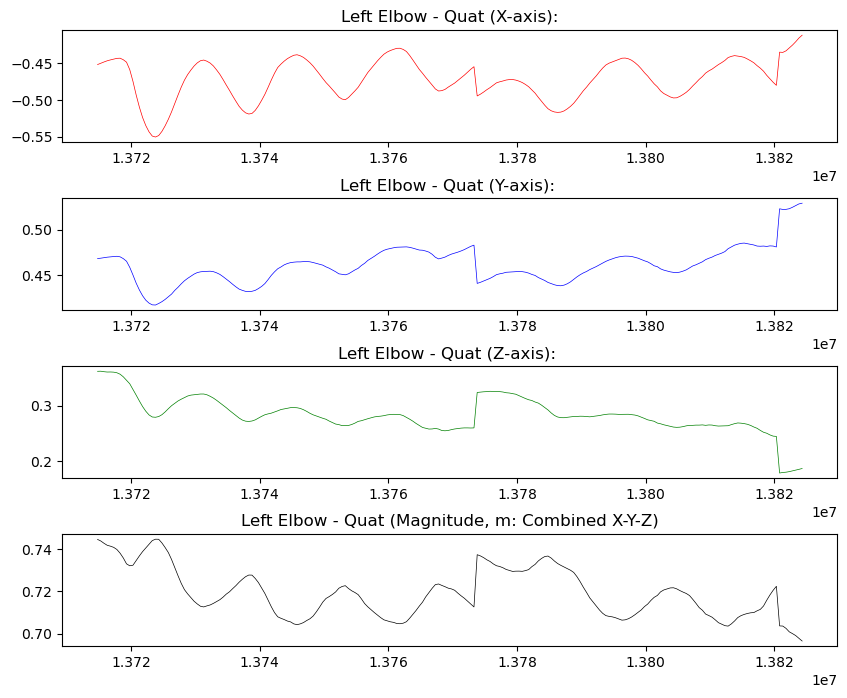

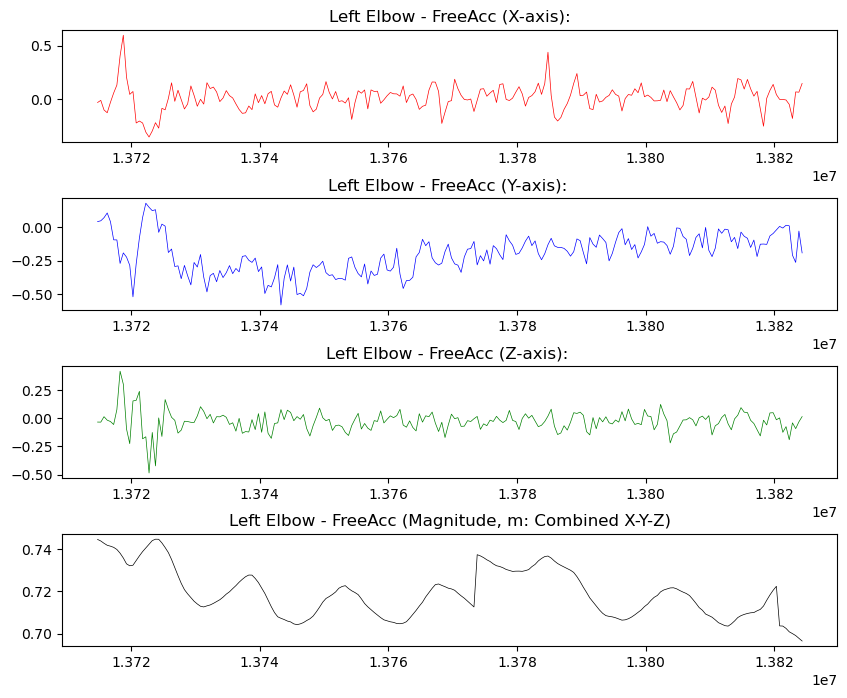

In [63]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_elbow_data['m'] = magnitude(left_elbow_data)
left_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Elbow - Quat')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Elbow - FreeAcc')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - Quat (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - Quat (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - Quat (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - FreeAcc (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - FreeAcc (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - FreeAcc (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Elbow

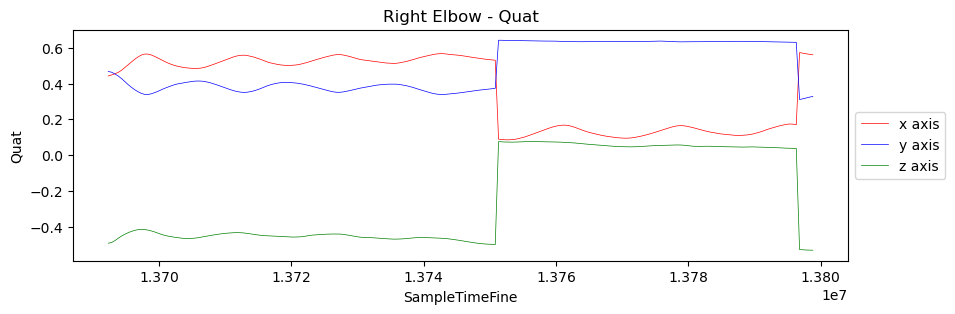

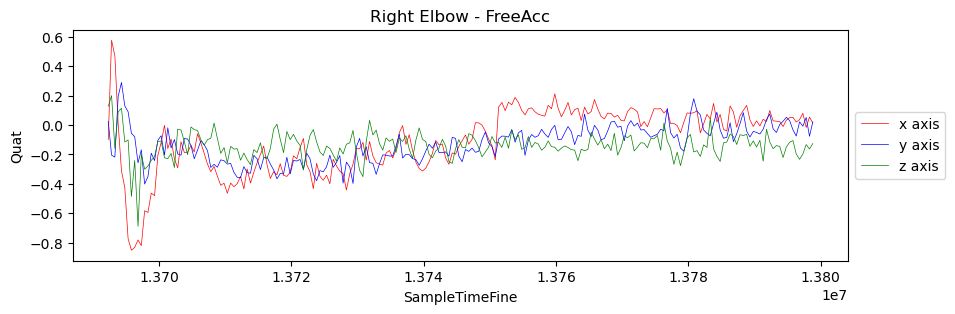

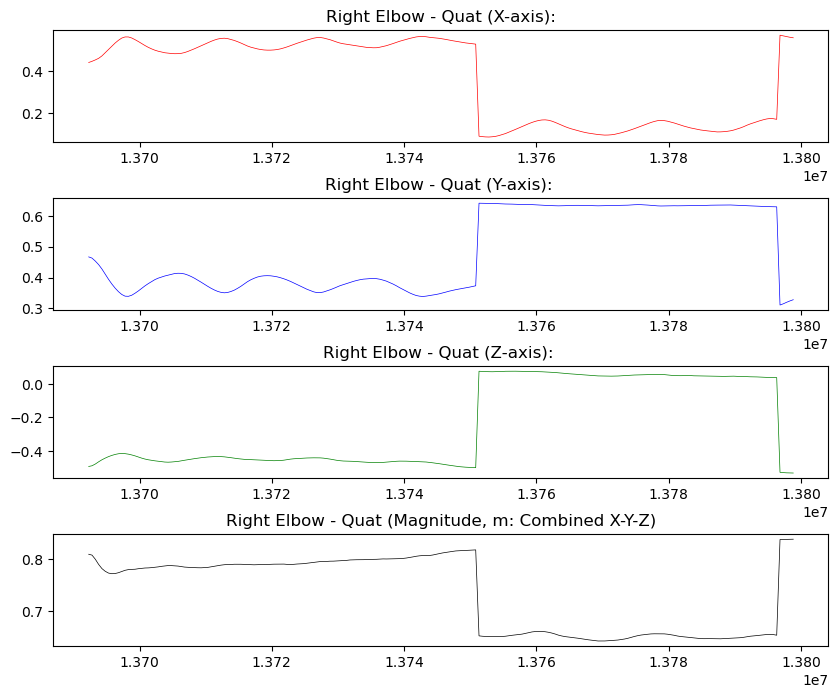

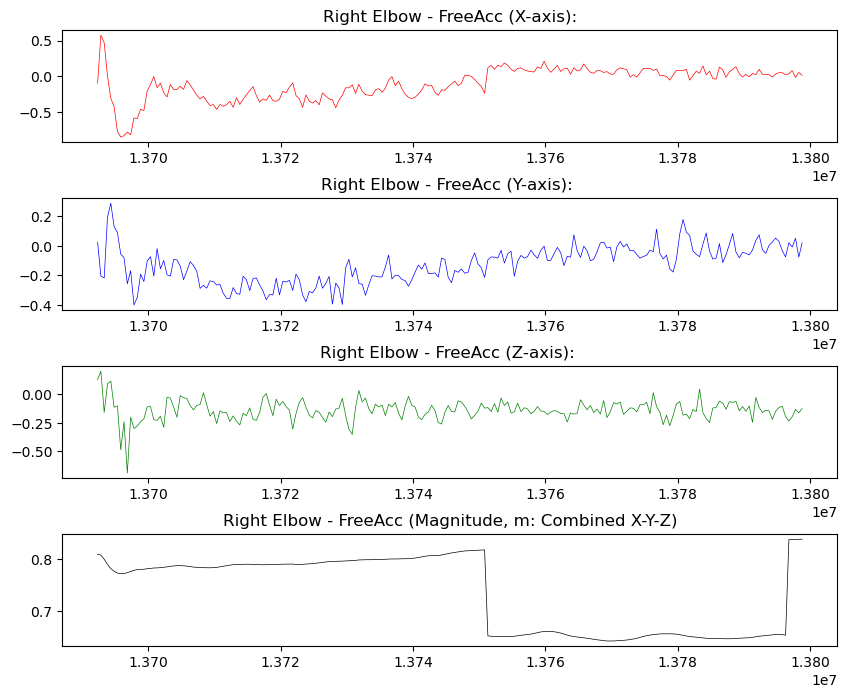

In [64]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_elbow_data['m'] = magnitude(right_elbow_data)
right_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Elbow - Quat')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Elbow - FreeAcc')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - Quat (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - Quat (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - Quat (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - FreeAcc (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - FreeAcc (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - FreeAcc (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Shoulder

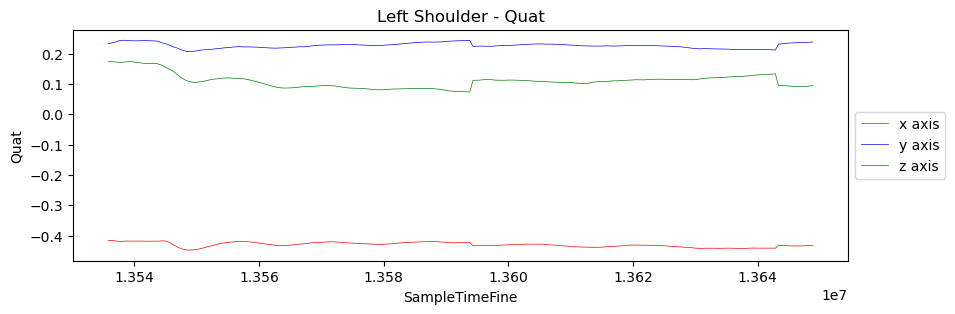

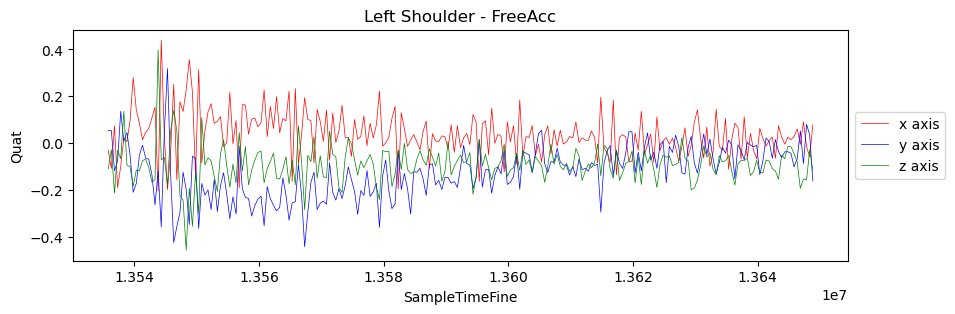

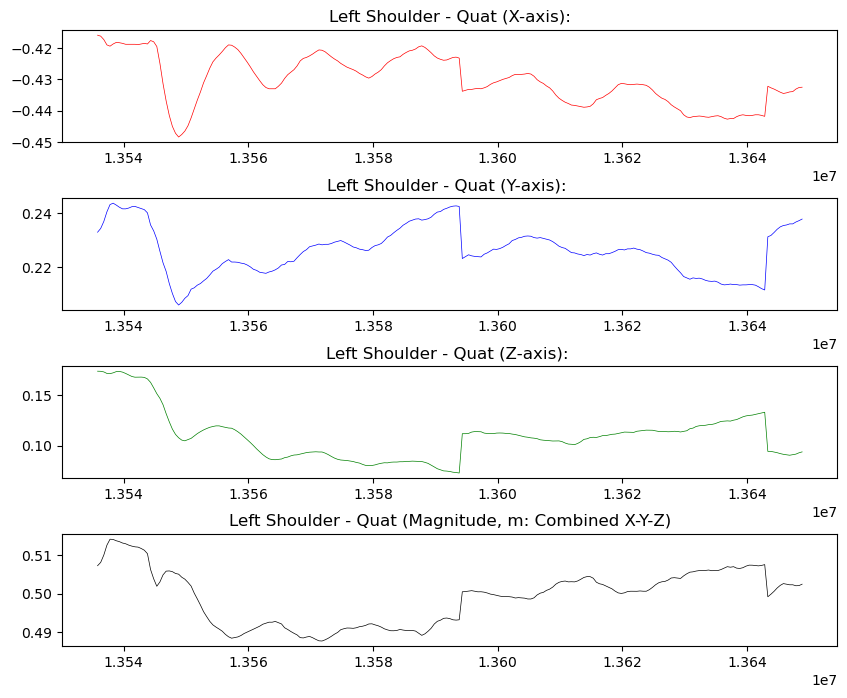

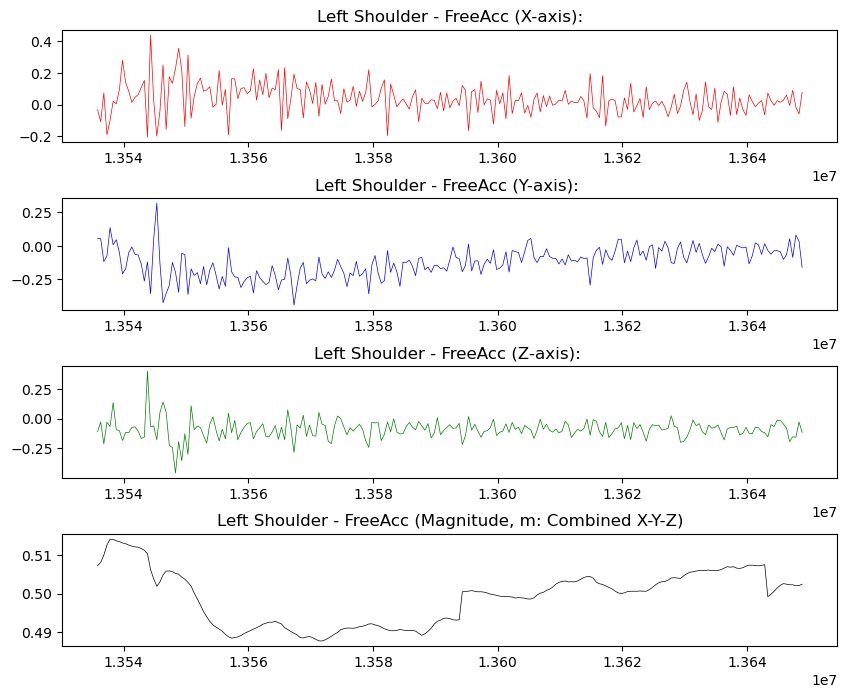

In [65]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_shoulder_data['m'] = magnitude(left_shoulder_data)
left_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - Quat')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - FreeAcc')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - Quat (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - Quat (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - Quat (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - FreeAcc (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Shoulder

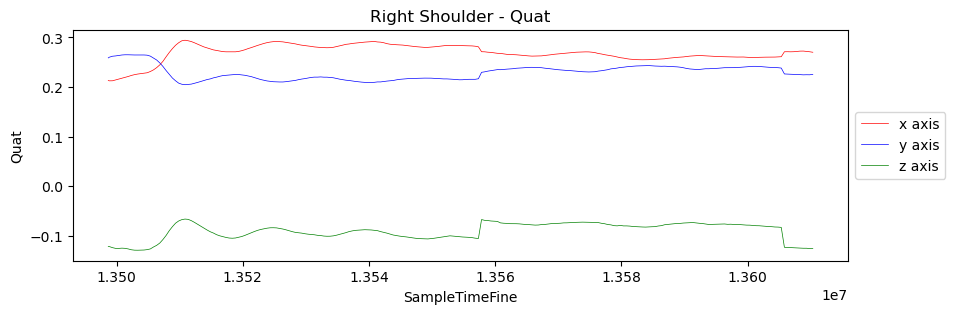

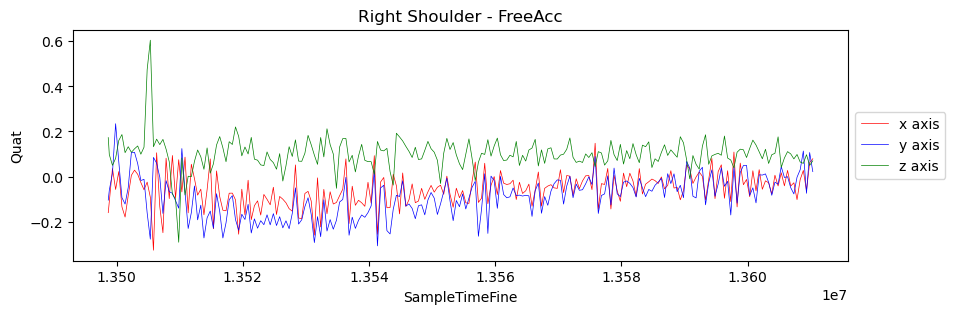

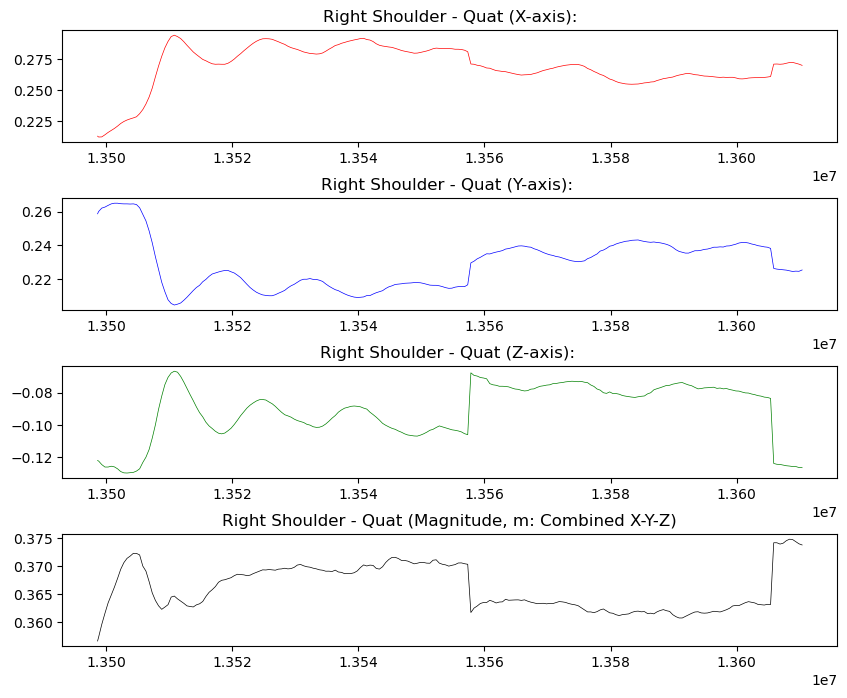

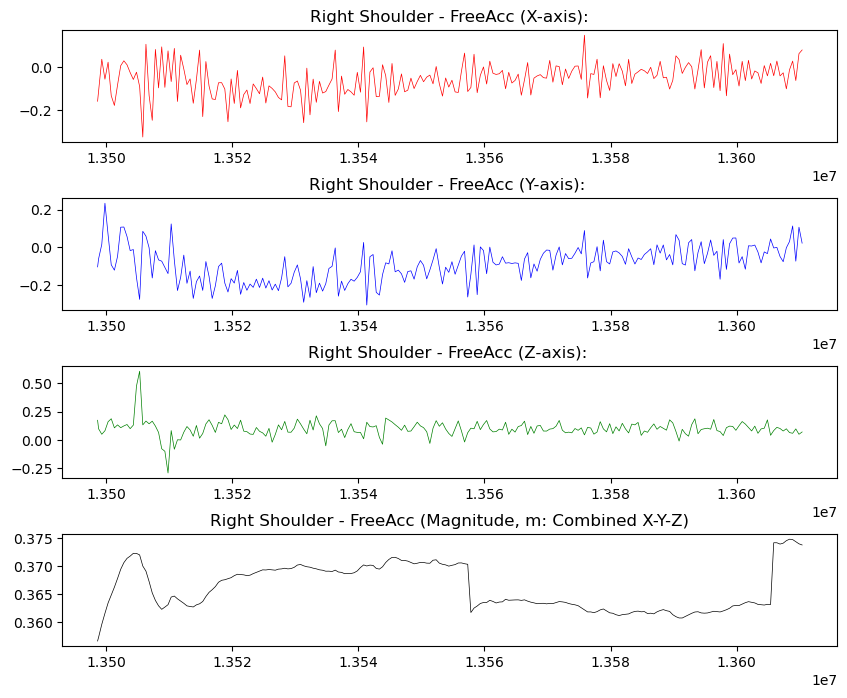

In [66]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_shoulder_data['m'] = magnitude(right_shoulder_data)
right_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - Quat')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - FreeAcc')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - Quat (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - Quat (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - Quat (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - FreeAcc (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

# =============================================================

# Sensor Data 1

In [67]:
import numpy as np
import ezc3d
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from keras.utils import to_categorical
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import classification_report
import os
import math

# Load and preprocess sensor data
left_wrist_data = pd.read_csv('Sensor Data 1/leftwrist.csv')
right_wrist_data = pd.read_csv('Sensor Data 1/rightwrist.csv')
left_elbow_data = pd.read_csv('Sensor Data 1/leftelbow.csv')
right_elbow_data = pd.read_csv('Sensor Data 1/rightelbow.csv')
left_shoulder_data = pd.read_csv('Sensor Data 1/leftshoulder.csv')
right_shoulder_data = pd.read_csv('Sensor Data 1/rightshoulder.csv')

## Left Wrist

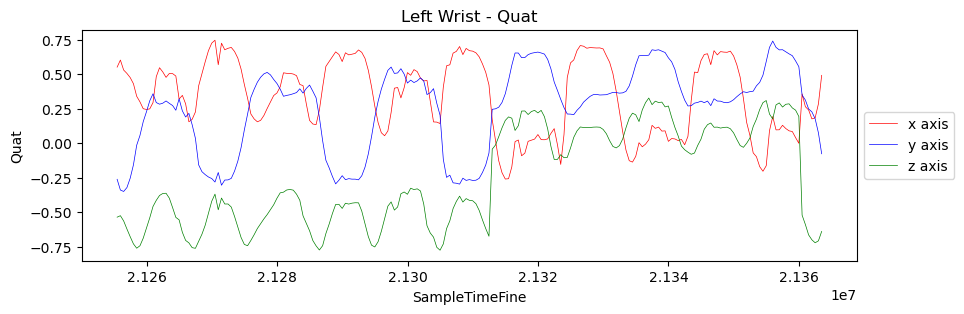

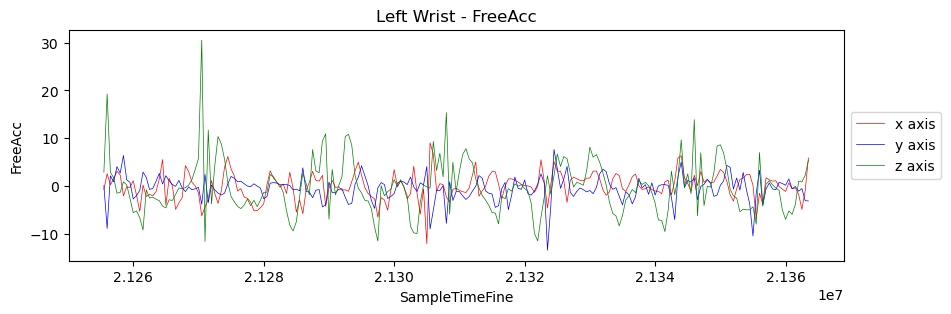

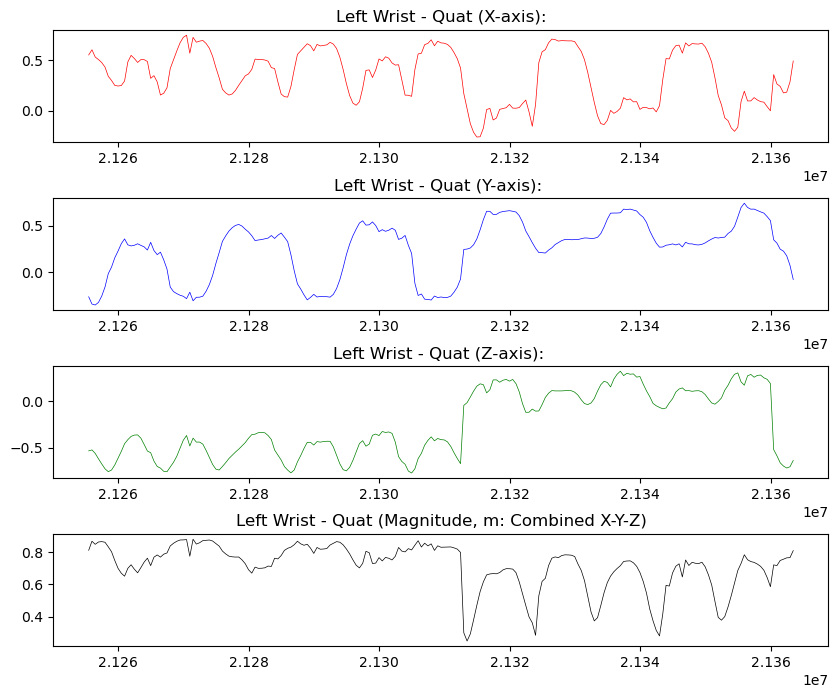

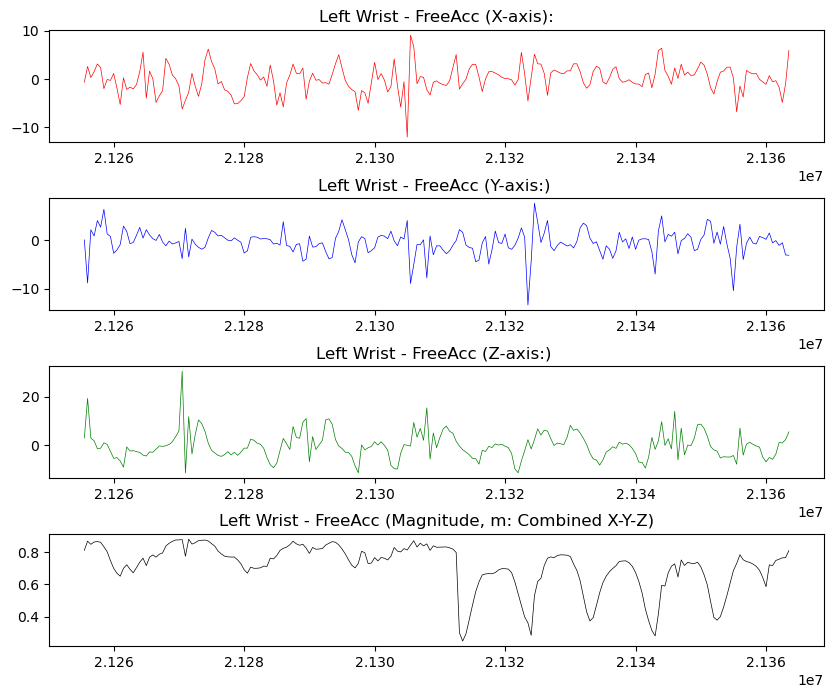

In [68]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_wrist_data['m'] = magnitude(left_wrist_data)
left_wrist_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Wrist - Quat')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Wrist - FreeAcc')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('FreeAcc')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - Quat (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - Quat (Y-axis): ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - Quat (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - FreeAcc (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Wrist

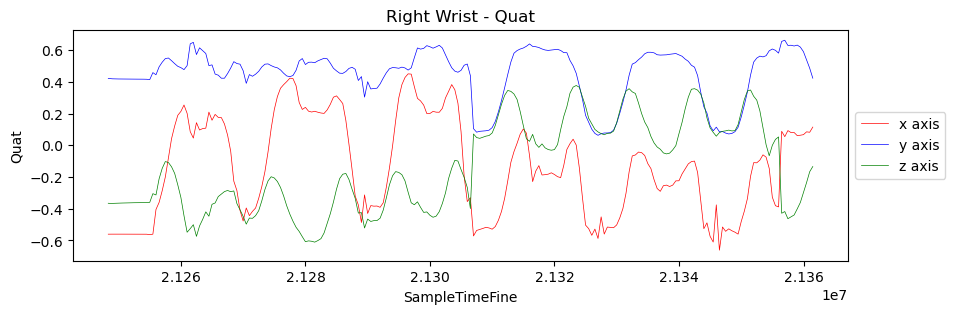

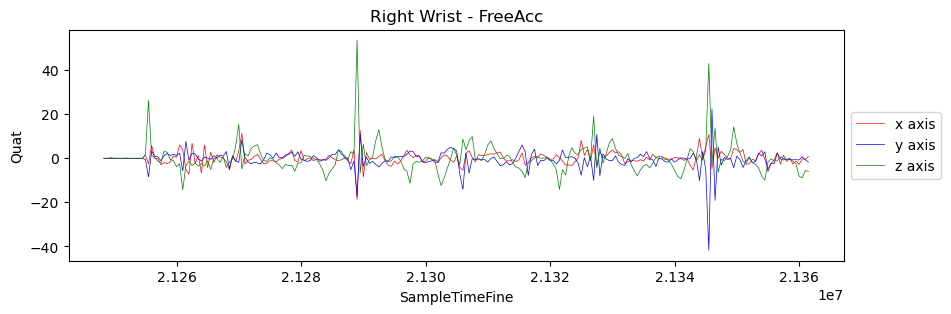

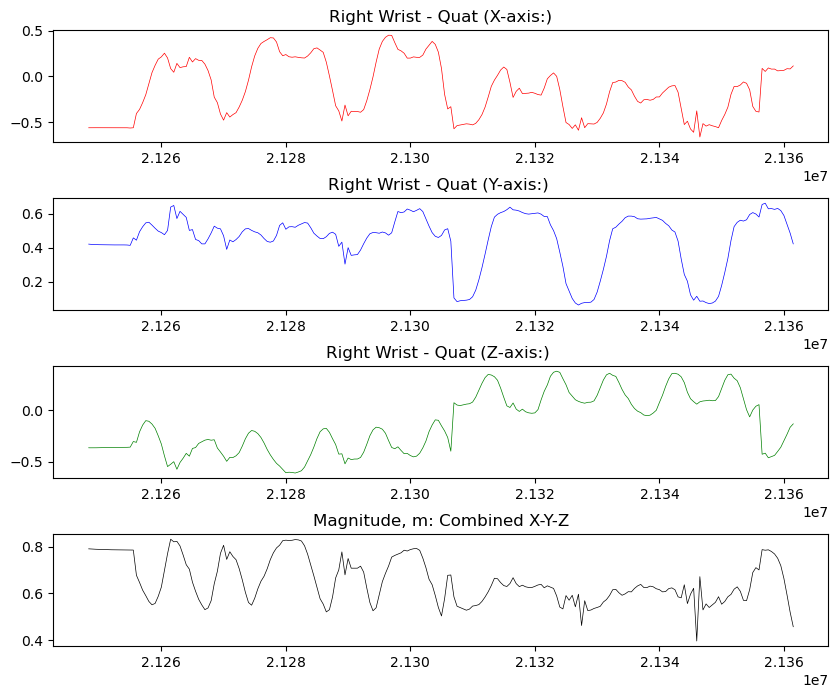

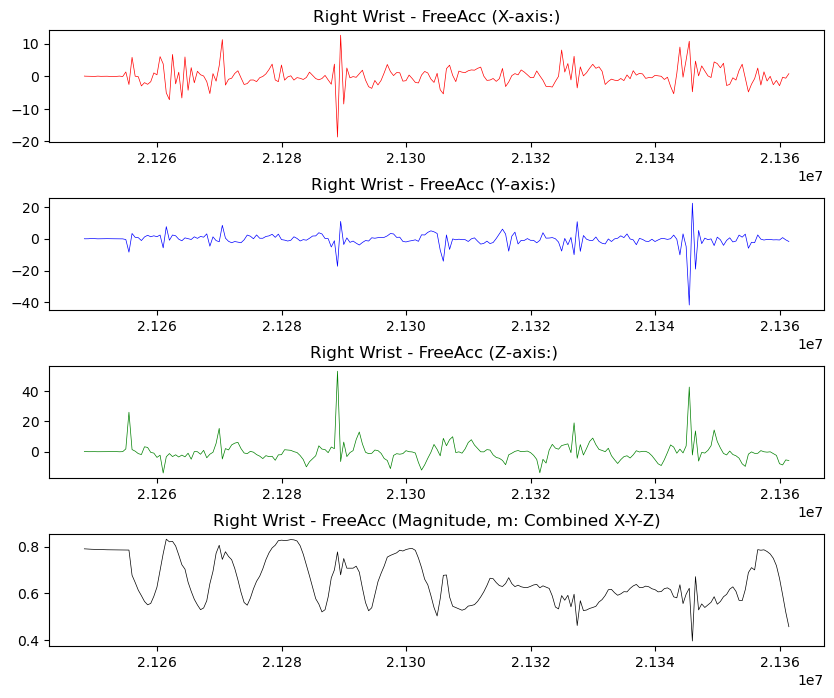

In [69]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_wrist_data['m'] = magnitude(right_wrist_data)
right_wrist_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Wrist - Quat')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Wrist - FreeAcc')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - Quat (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - Quat (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - Quat (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Magnitude, m: Combined X-Y-Z')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - FreeAcc (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Elbow

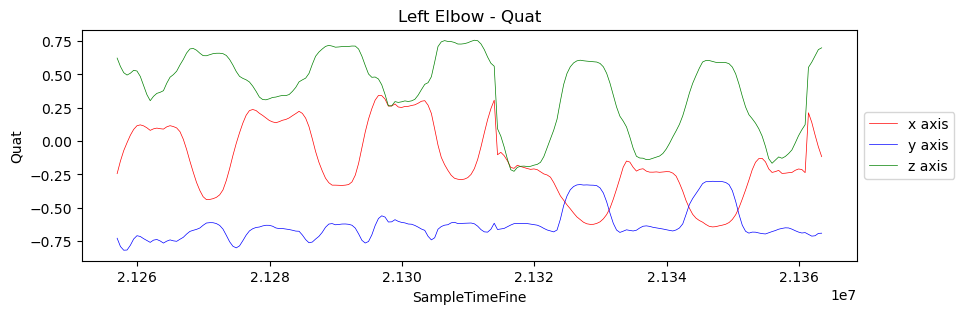

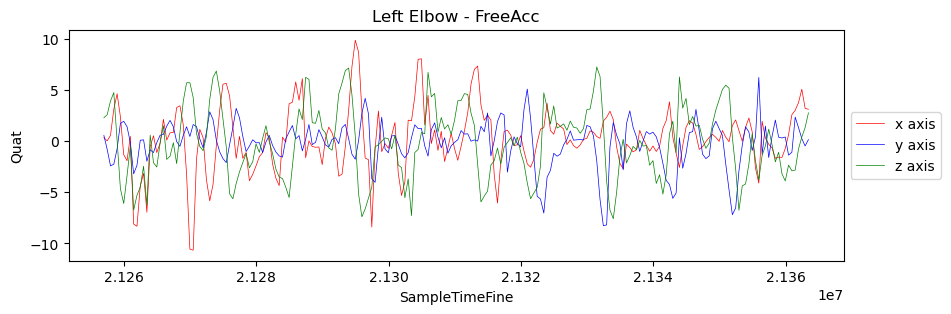

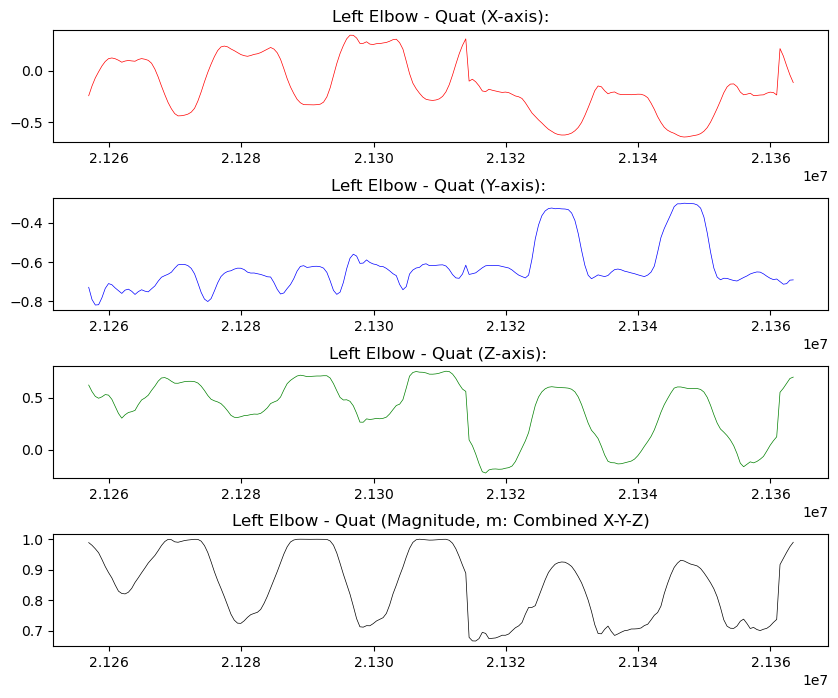

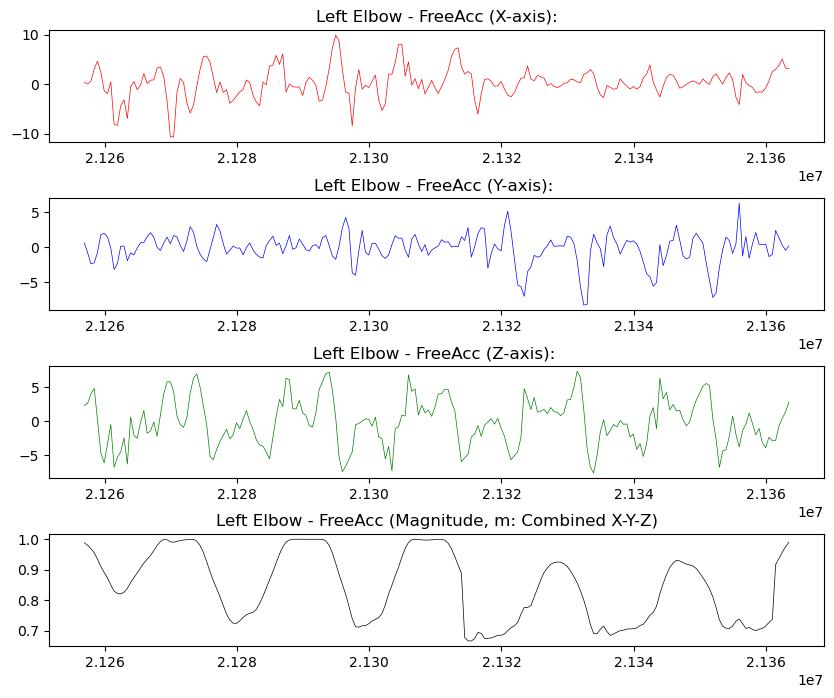

In [70]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_elbow_data['m'] = magnitude(left_elbow_data)
left_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Elbow - Quat')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Elbow - FreeAcc')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - Quat (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - Quat (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - Quat (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - FreeAcc (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - FreeAcc (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - FreeAcc (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Elbow

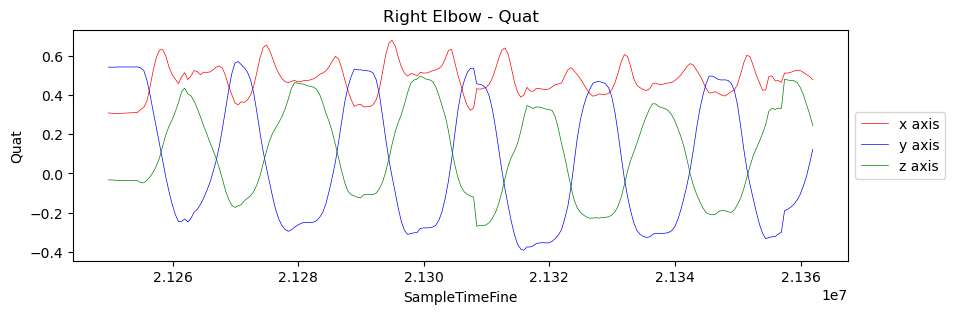

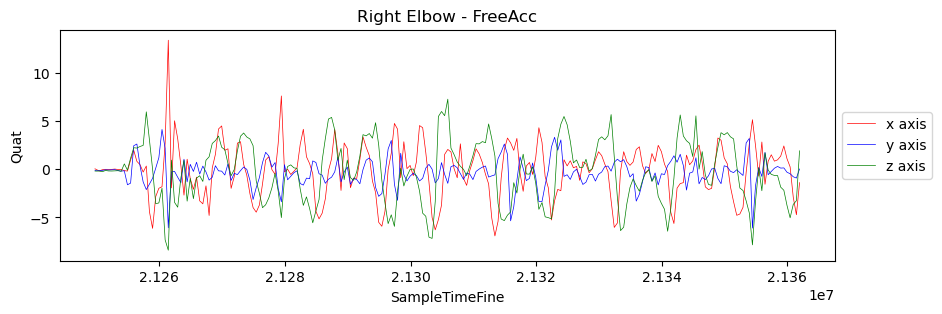

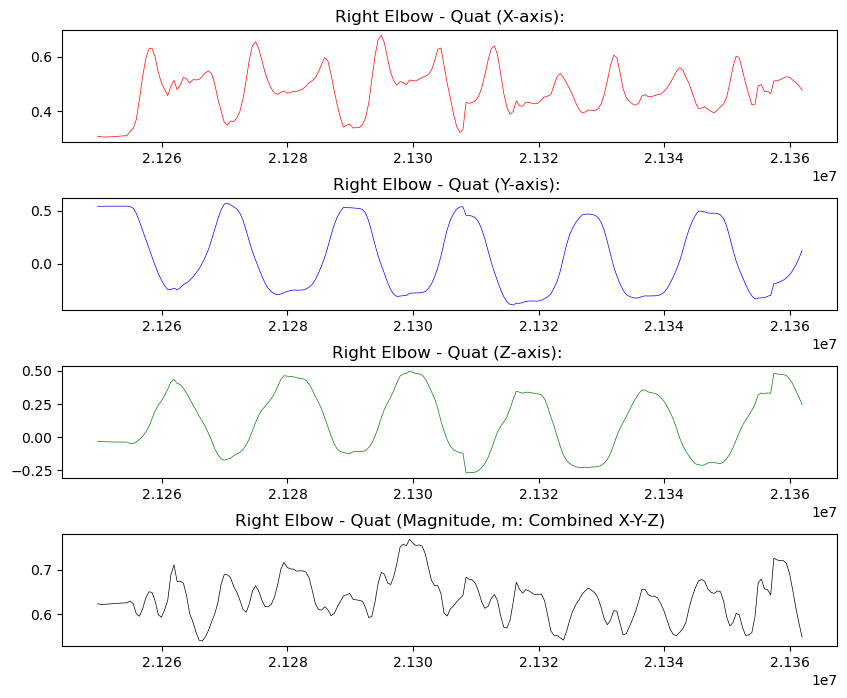

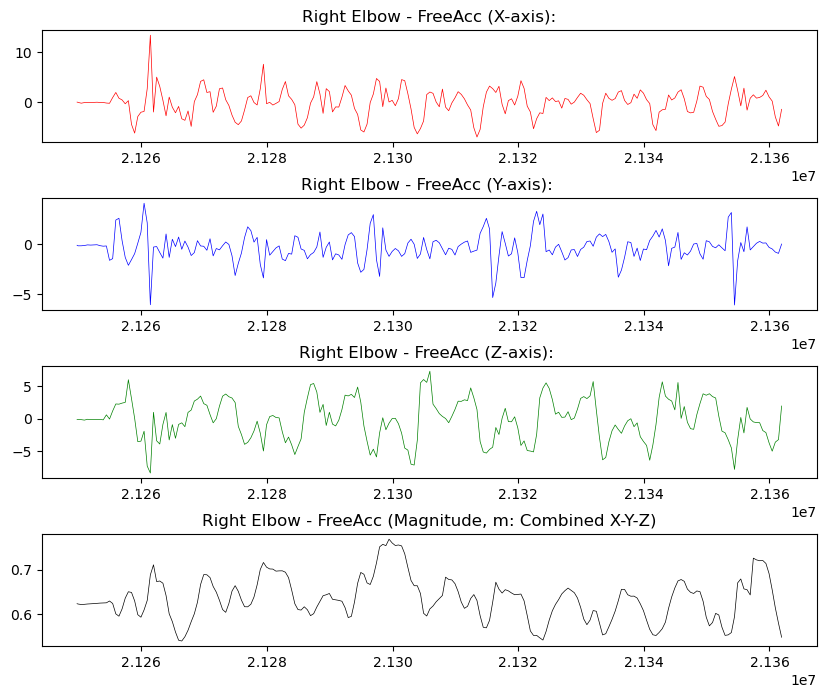

In [71]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_elbow_data['m'] = magnitude(right_elbow_data)
right_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Elbow - Quat')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Elbow - FreeAcc')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - Quat (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - Quat (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - Quat (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - FreeAcc (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - FreeAcc (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - FreeAcc (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Shoulder

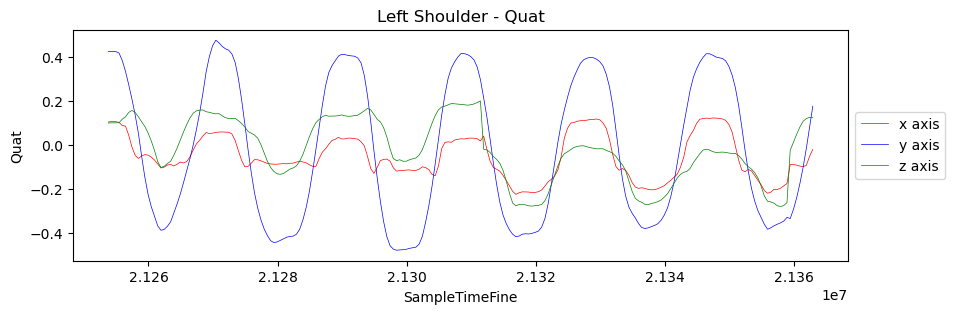

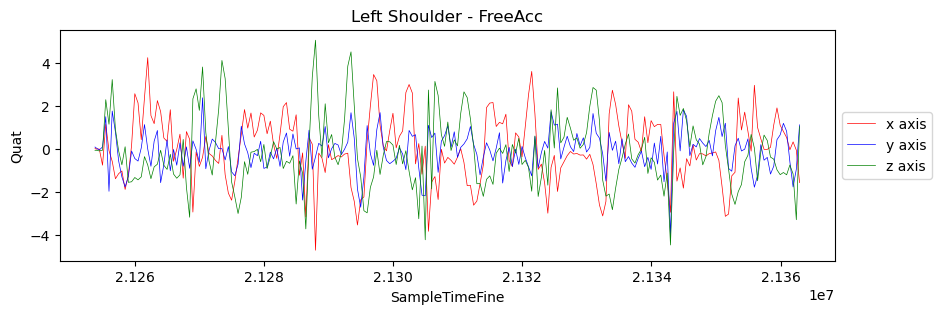

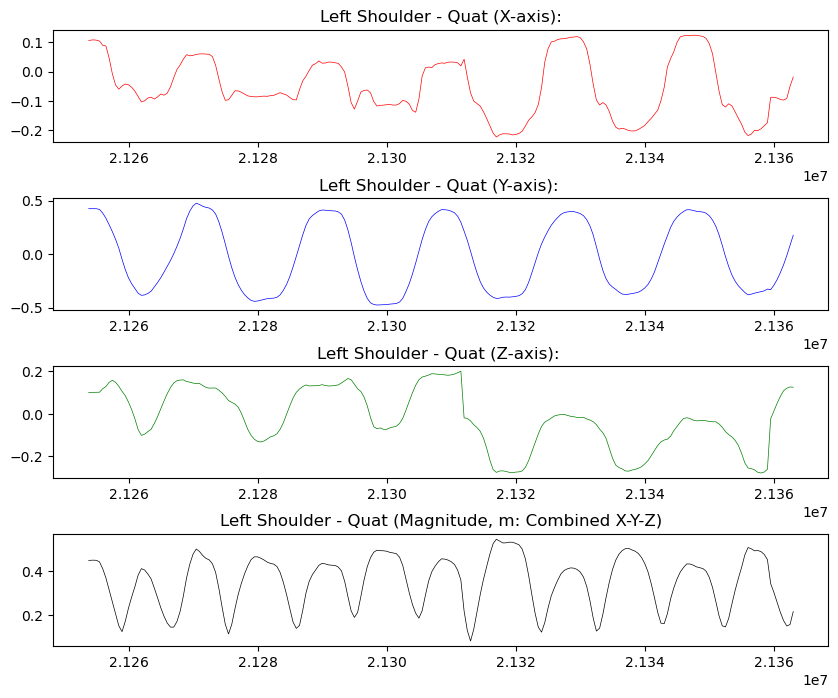

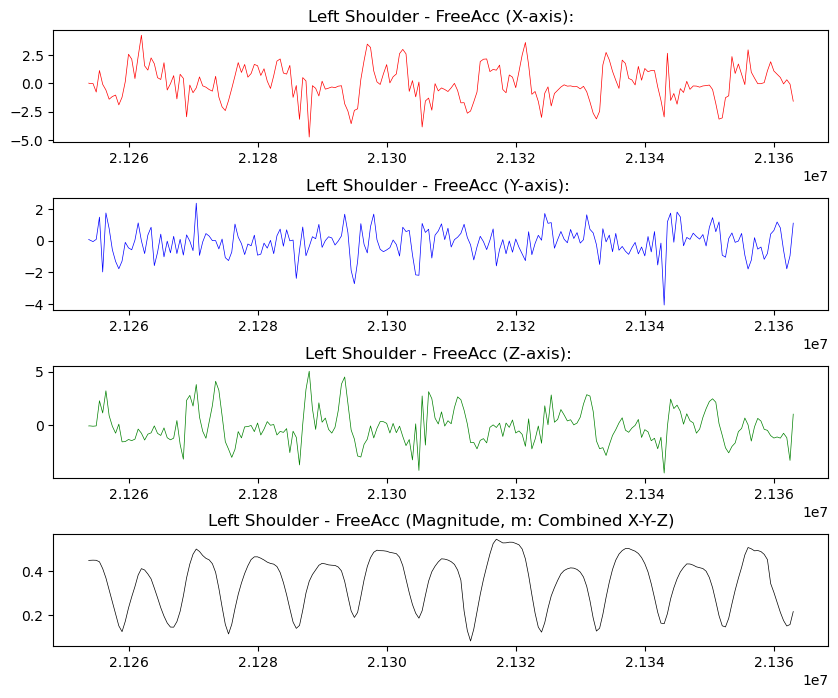

In [72]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_shoulder_data['m'] = magnitude(left_shoulder_data)
left_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - Quat')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - FreeAcc')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - Quat (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - Quat (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - Quat (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - FreeAcc (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Shoulder

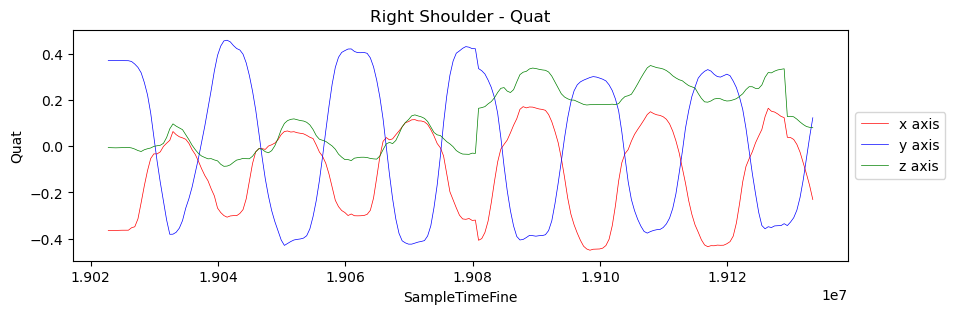

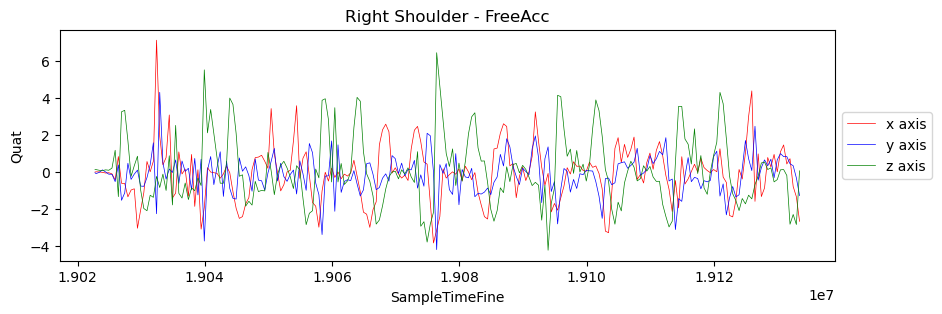

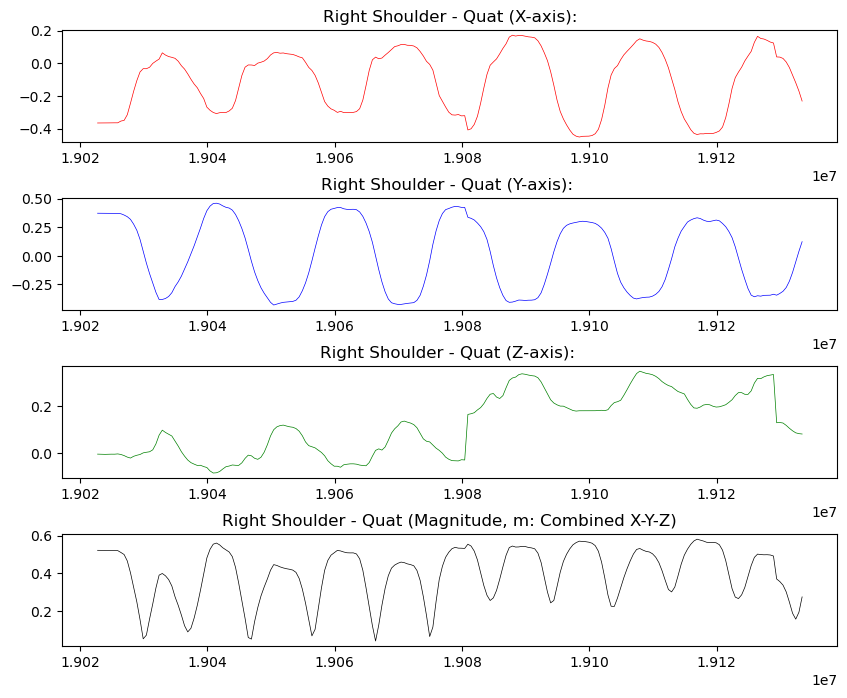

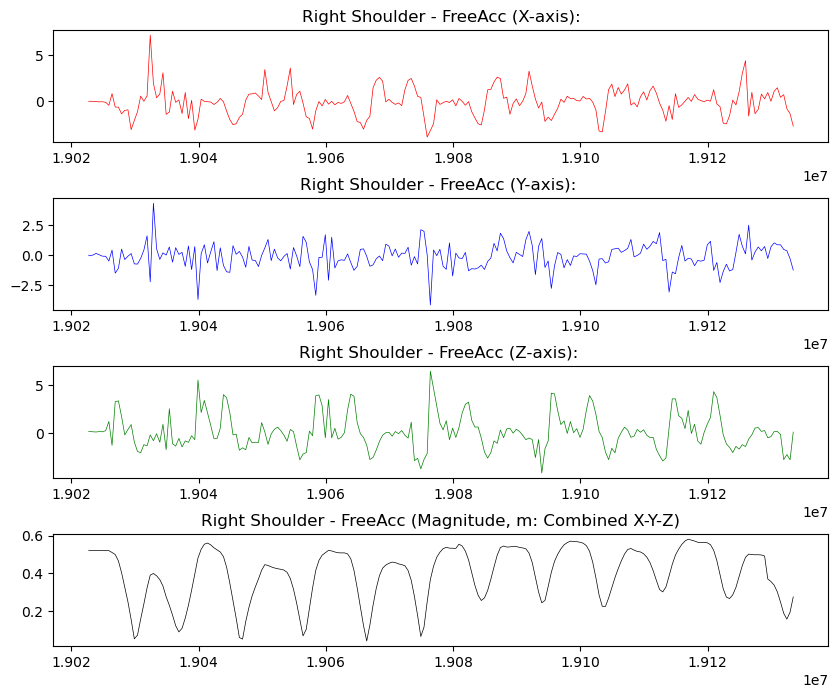

In [73]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_shoulder_data['m'] = magnitude(right_shoulder_data)
right_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - Quat')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - FreeAcc')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - Quat (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - Quat (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - Quat (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - FreeAcc (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

# =============================================================

# Sensor Data 2

In [74]:
import numpy as np
import ezc3d
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from keras.utils import to_categorical
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import classification_report
import os
import math

# Load and preprocess sensor data
left_wrist_data = pd.read_csv('Sensor Data 2/leftwrist.csv')
right_wrist_data = pd.read_csv('Sensor Data 2/rightwrist.csv')
left_elbow_data = pd.read_csv('Sensor Data 2/leftelbow.csv')
right_elbow_data = pd.read_csv('Sensor Data 2/rightelbow.csv')
left_shoulder_data = pd.read_csv('Sensor Data 2/leftshoulder.csv')
right_shoulder_data = pd.read_csv('Sensor Data 2/rightshoulder.csv')

## Left Wrist

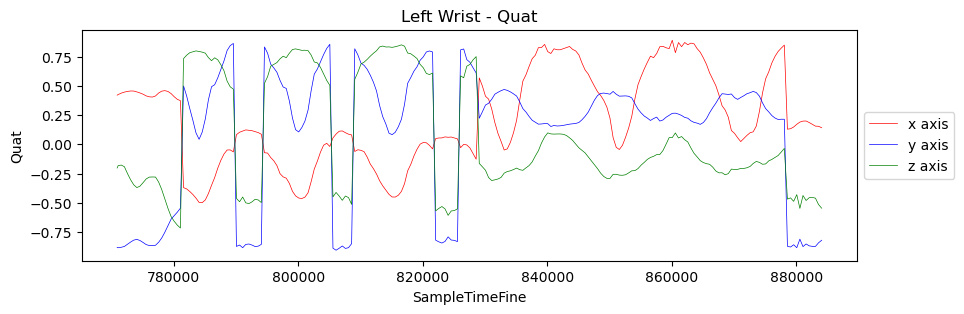

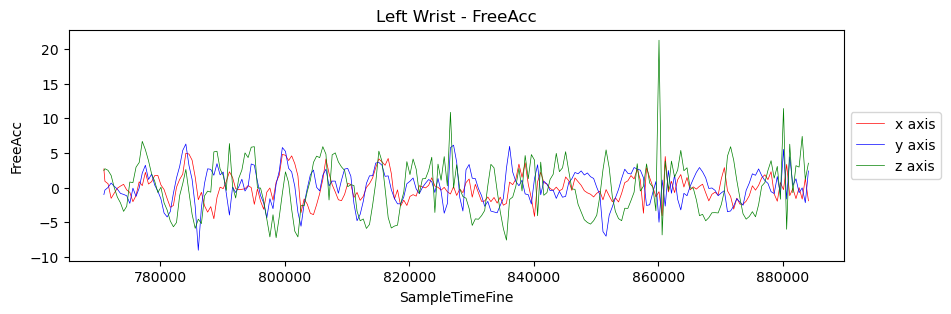

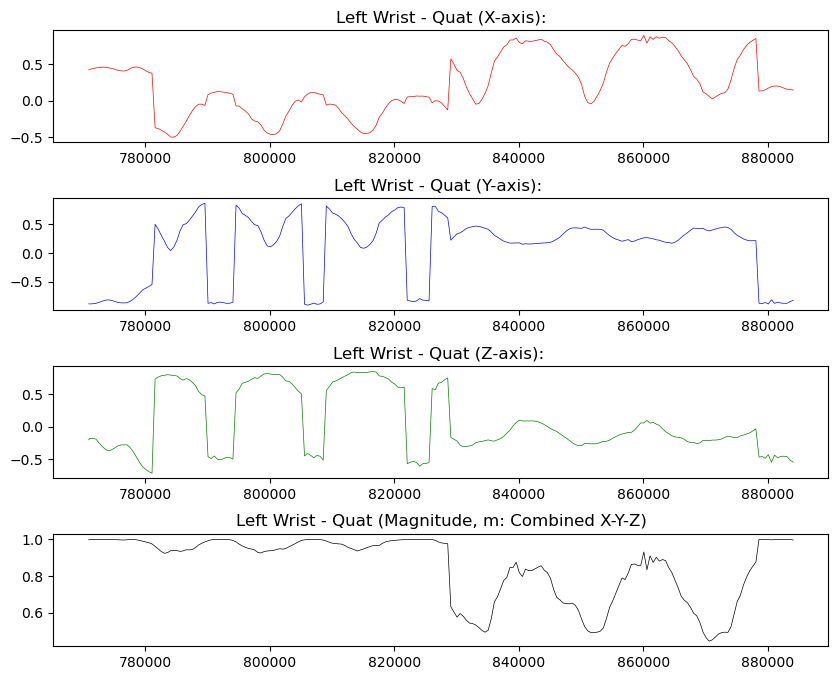

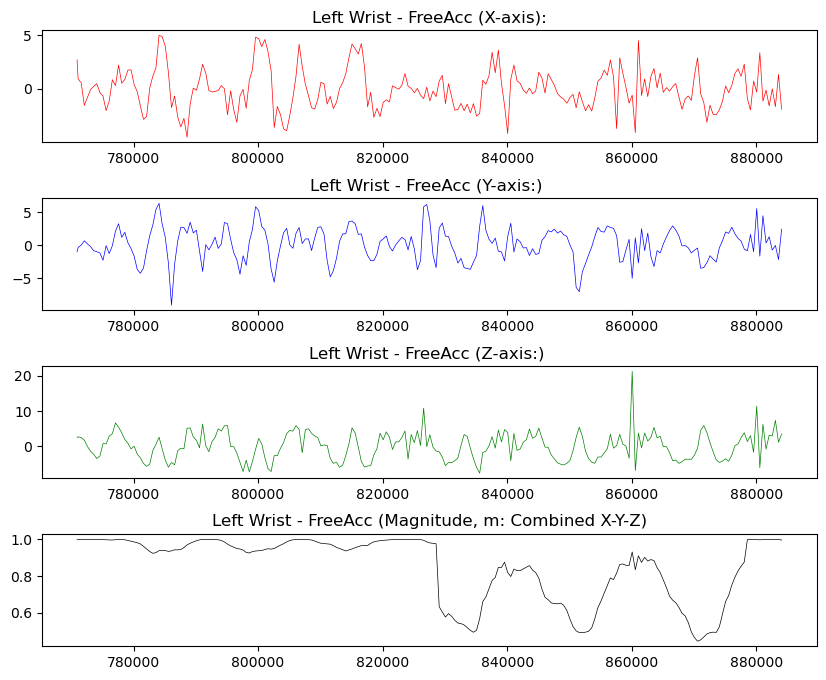

In [75]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_wrist_data['m'] = magnitude(left_wrist_data)
left_wrist_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Wrist - Quat')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Wrist - FreeAcc')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('FreeAcc')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - Quat (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - Quat (Y-axis): ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - Quat (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - FreeAcc (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Wrist

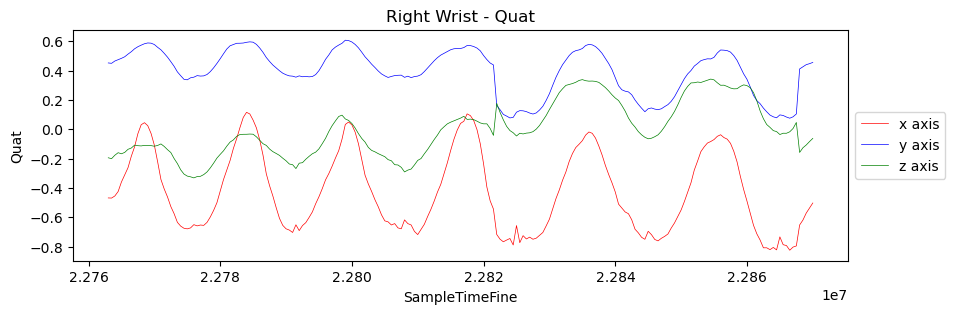

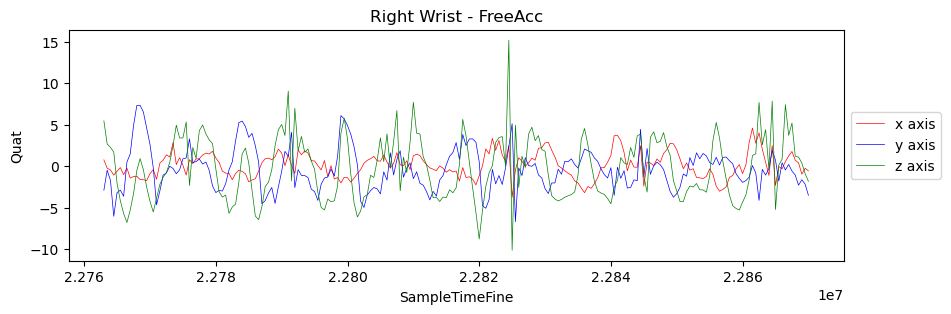

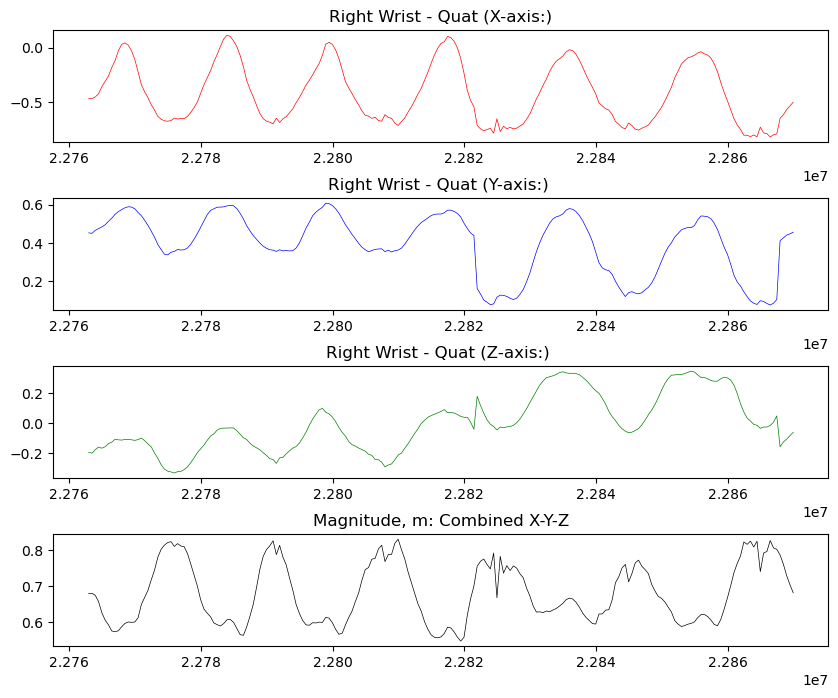

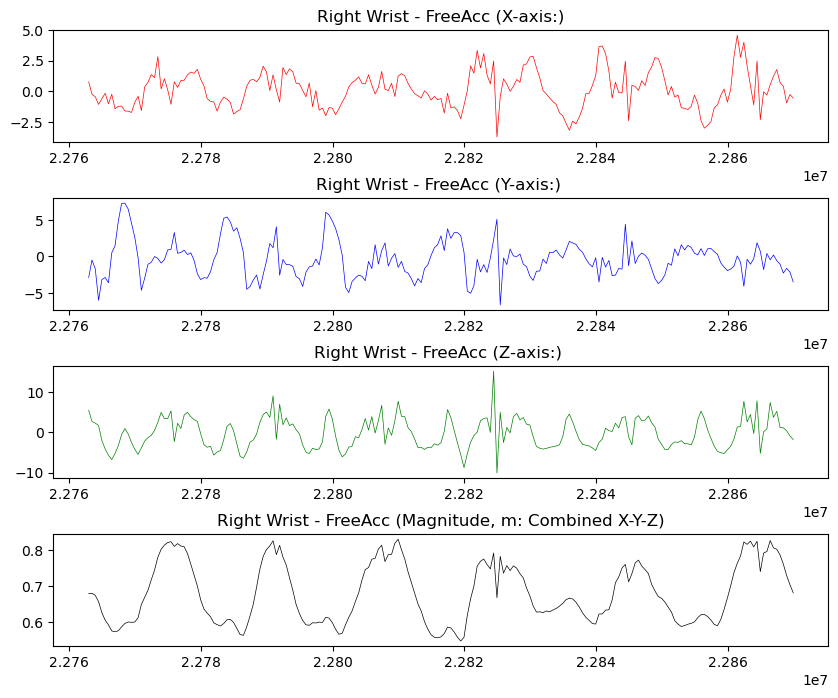

In [76]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_wrist_data['m'] = magnitude(right_wrist_data)
right_wrist_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Wrist - Quat')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Wrist - FreeAcc')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - Quat (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - Quat (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - Quat (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Magnitude, m: Combined X-Y-Z')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - FreeAcc (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Elbow

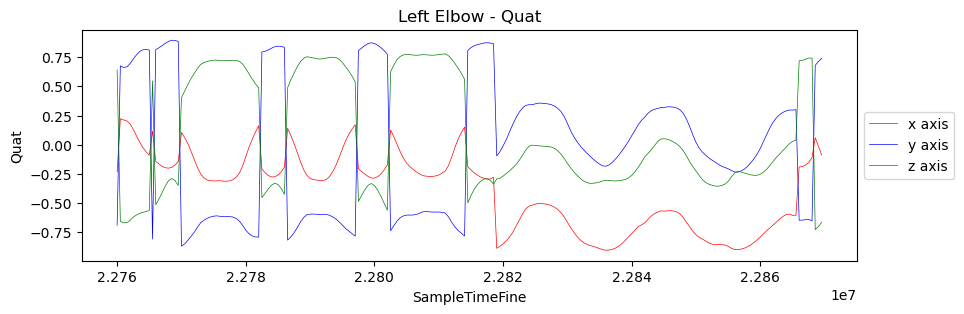

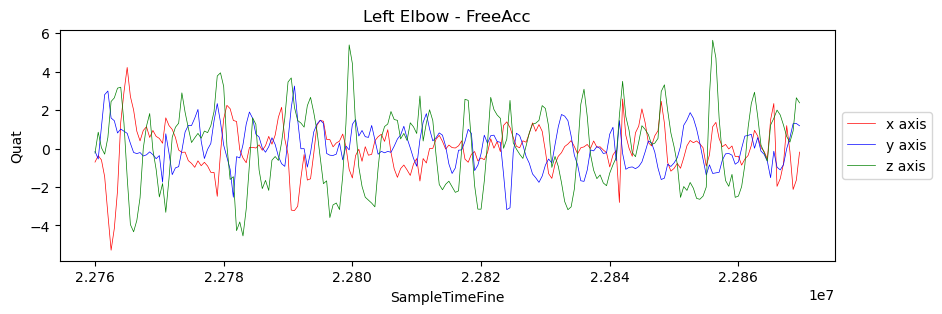

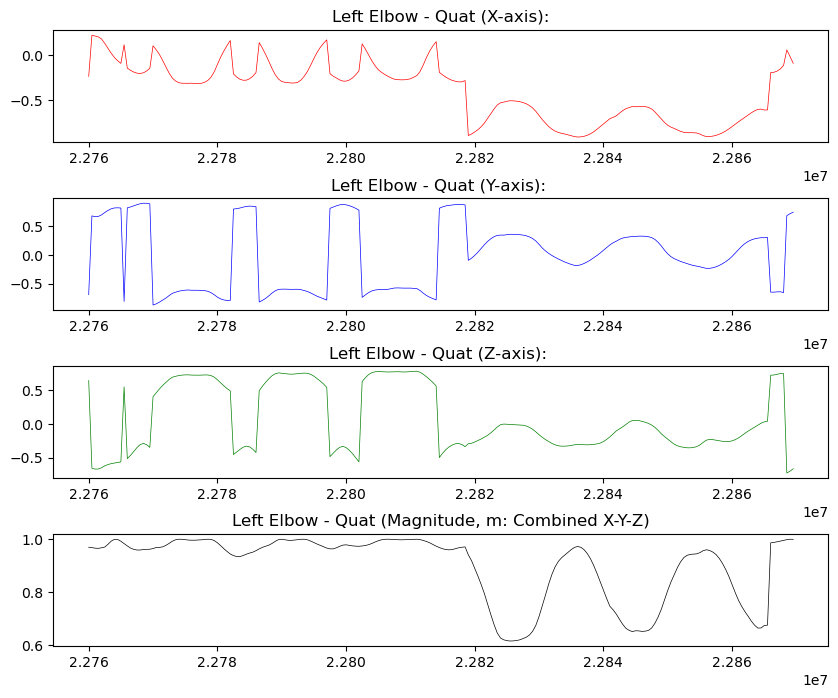

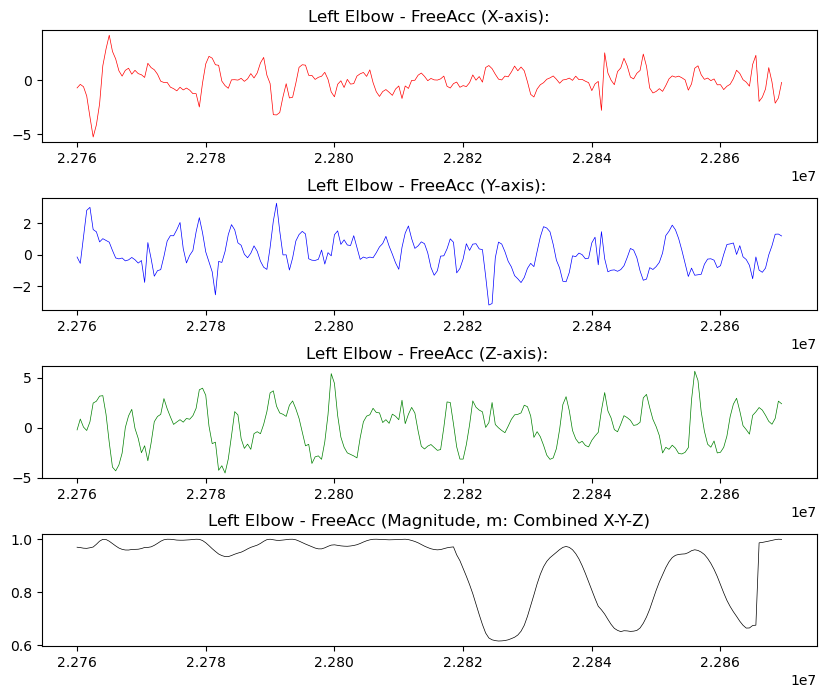

In [77]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_elbow_data['m'] = magnitude(left_elbow_data)
left_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Elbow - Quat')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Elbow - FreeAcc')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - Quat (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - Quat (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - Quat (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - FreeAcc (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - FreeAcc (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - FreeAcc (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Elbow

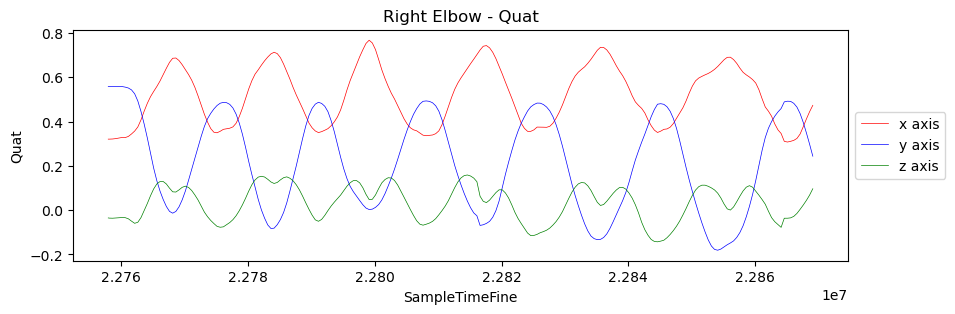

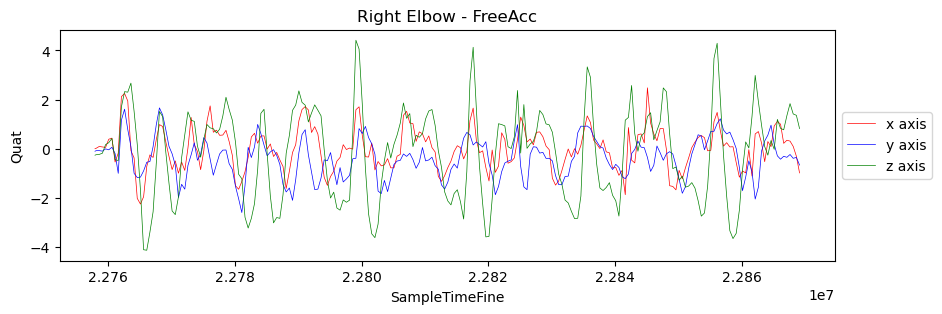

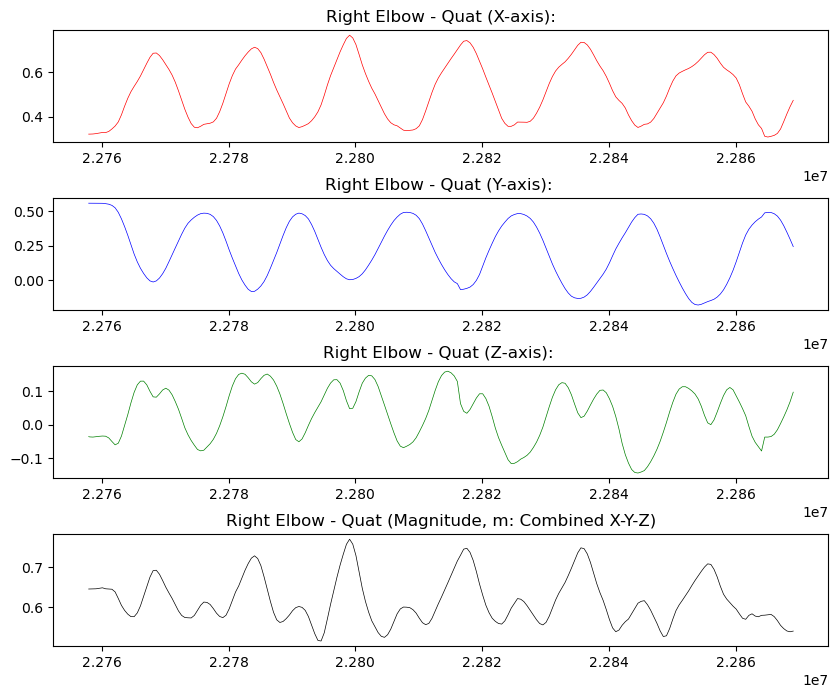

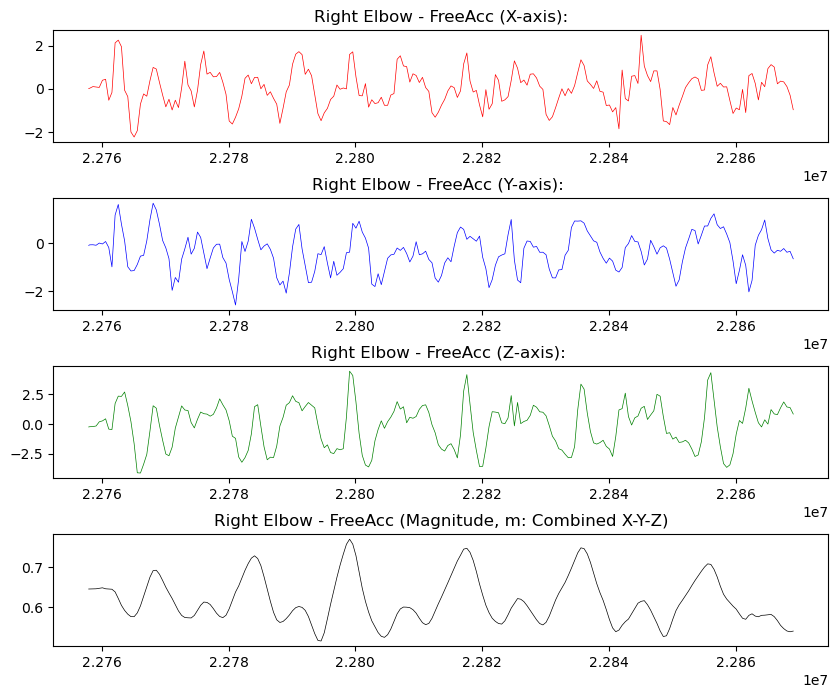

In [78]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_elbow_data['m'] = magnitude(right_elbow_data)
right_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Elbow - Quat')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Elbow - FreeAcc')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - Quat (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - Quat (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - Quat (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - FreeAcc (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - FreeAcc (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - FreeAcc (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Shoulder

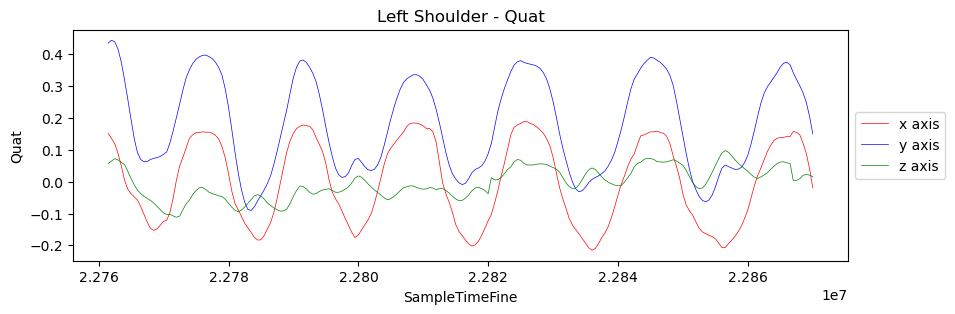

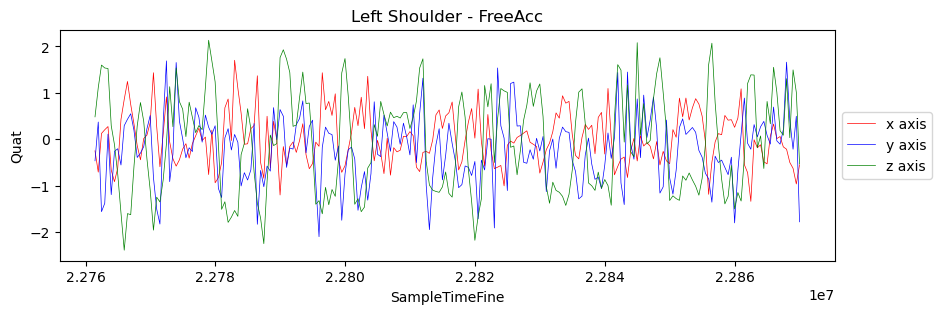

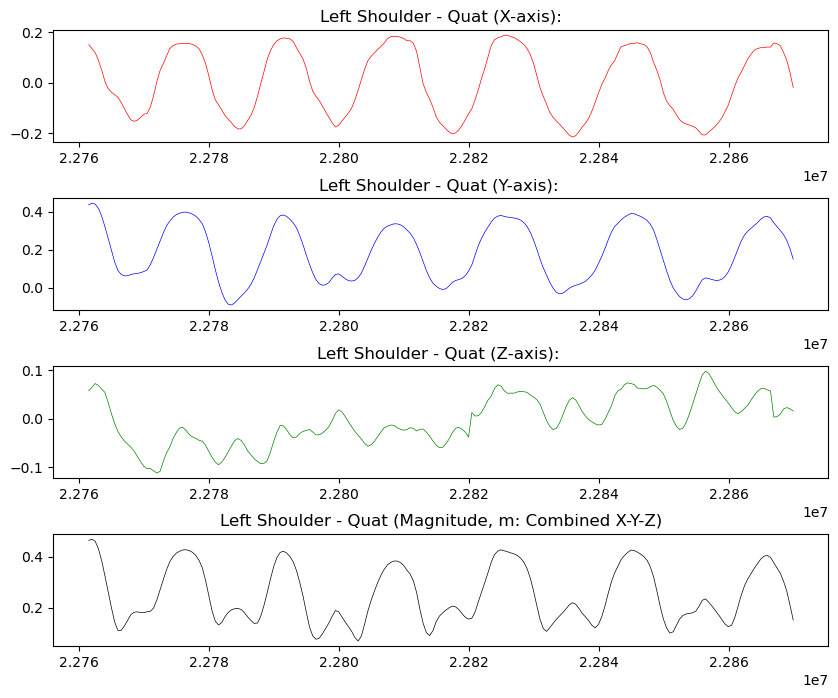

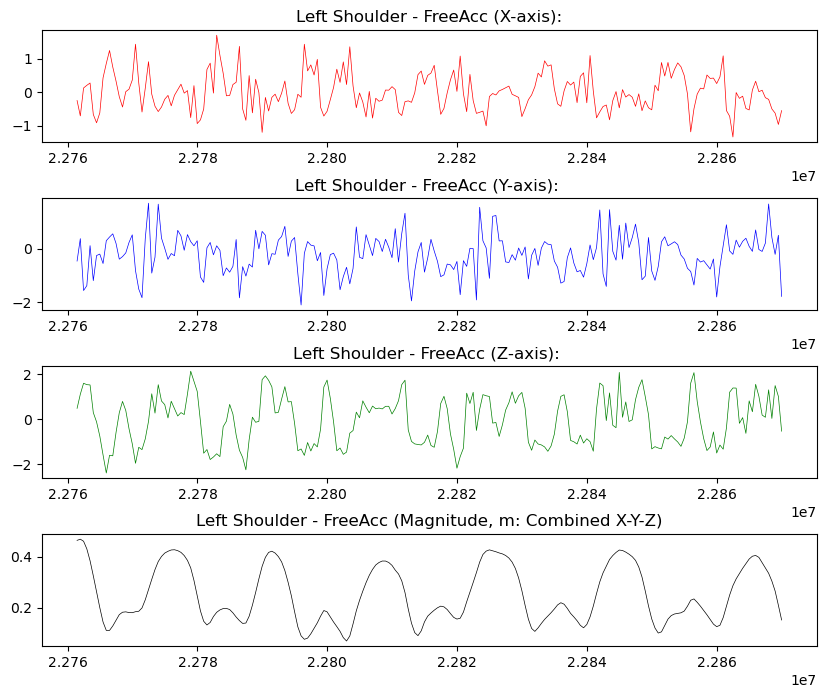

In [79]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_shoulder_data['m'] = magnitude(left_shoulder_data)
left_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - Quat')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - FreeAcc')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - Quat (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - Quat (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - Quat (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - FreeAcc (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Shoulder

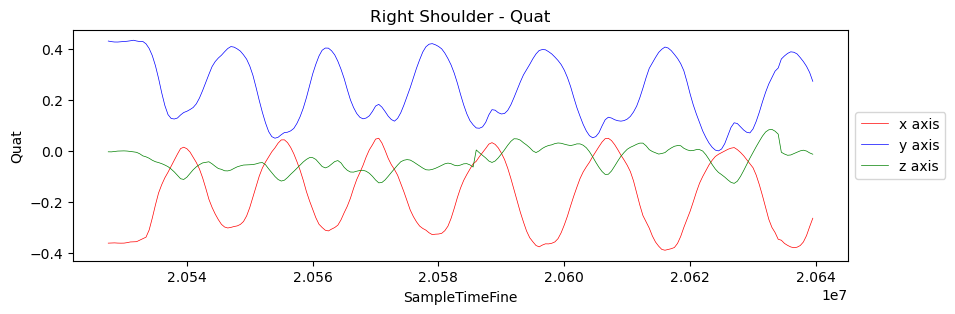

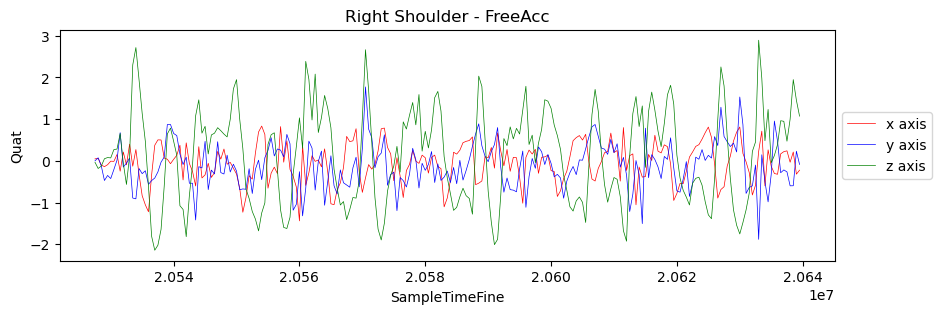

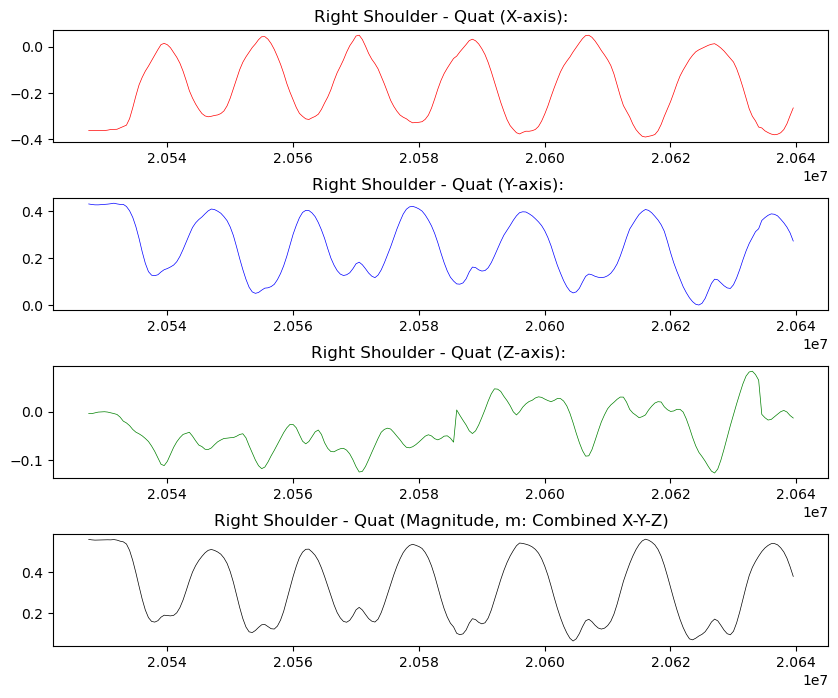

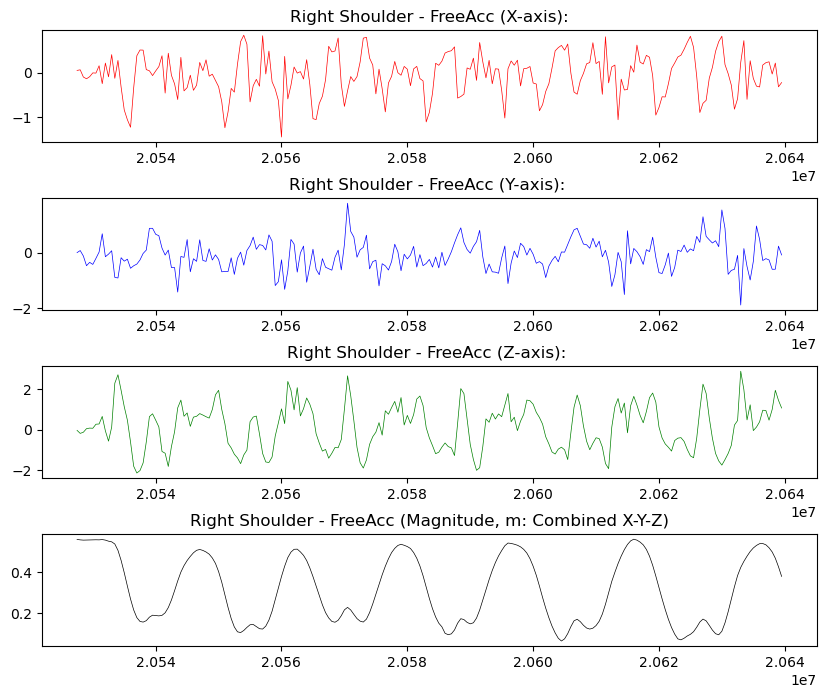

In [80]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_shoulder_data['m'] = magnitude(right_shoulder_data)
right_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - Quat')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - FreeAcc')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - Quat (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - Quat (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - Quat (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - FreeAcc (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

# =============================================================

# Sensor Data 3

In [81]:
import numpy as np
import ezc3d
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from keras.utils import to_categorical
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import classification_report
import os
import math

# Load and preprocess sensor data
left_wrist_data = pd.read_csv('Sensor Data 3/leftwrist.csv')
right_wrist_data = pd.read_csv('Sensor Data 3/rightwrist.csv')
left_elbow_data = pd.read_csv('Sensor Data 3/leftelbow.csv')
right_elbow_data = pd.read_csv('Sensor Data 3/rightelbow.csv')
left_shoulder_data = pd.read_csv('Sensor Data 3/leftshoulder.csv')
right_shoulder_data = pd.read_csv('Sensor Data 3/rightshoulder.csv')

## Left Wrist

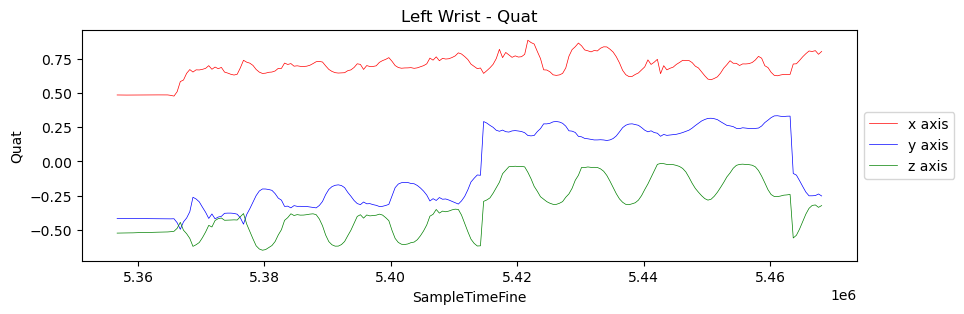

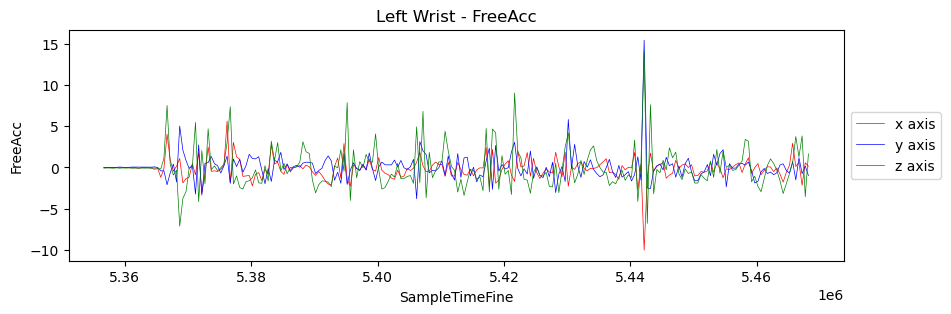

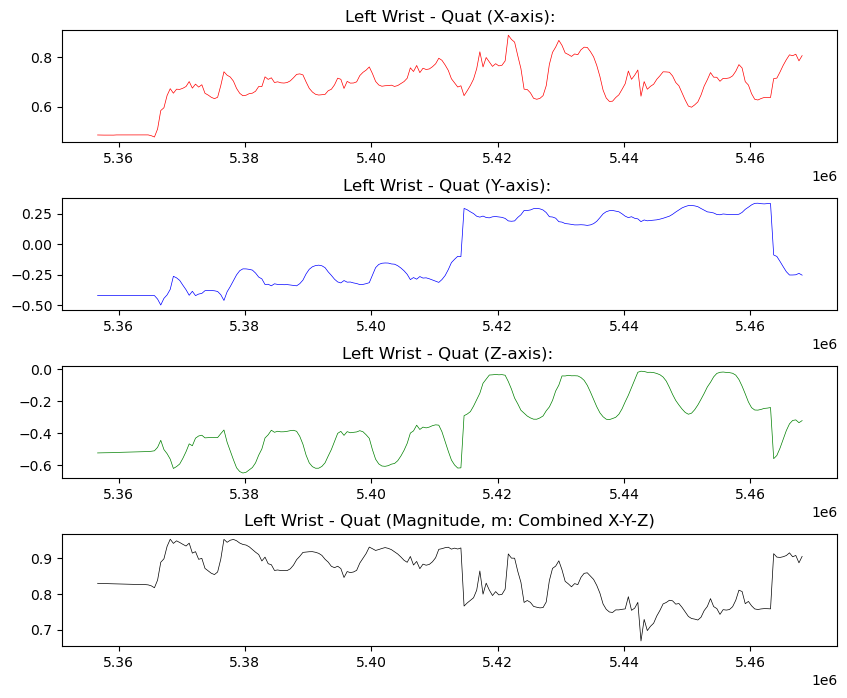

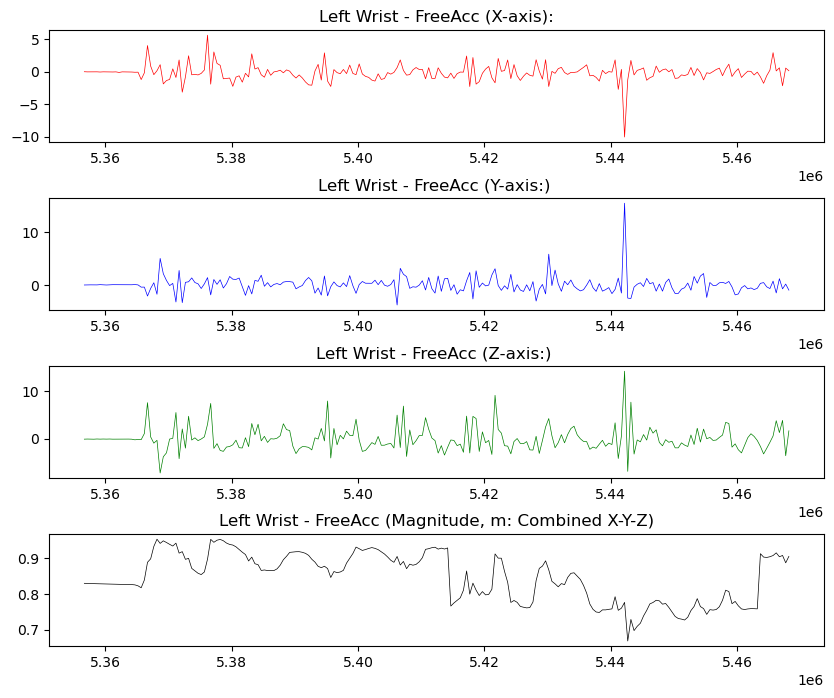

In [82]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_wrist_data['m'] = magnitude(left_wrist_data)
left_wrist_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Wrist - Quat')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Wrist - FreeAcc')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('FreeAcc')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - Quat (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - Quat (Y-axis): ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - Quat (Z-axis): ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Wrist - FreeAcc (X-axis):')
ax[0].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_wrist_data['SampleTimeFine'], left_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Wrist

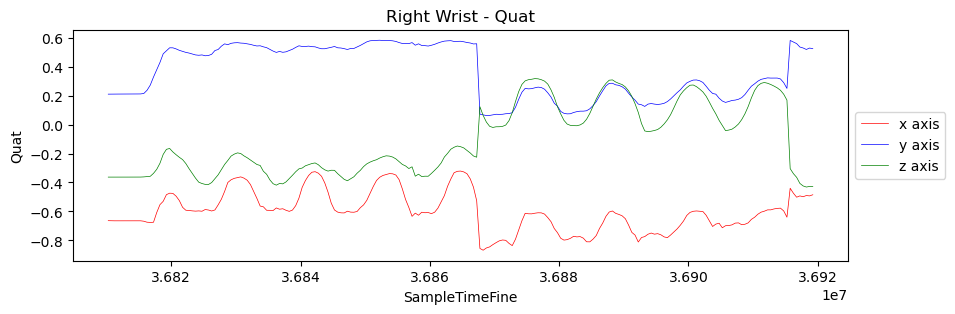

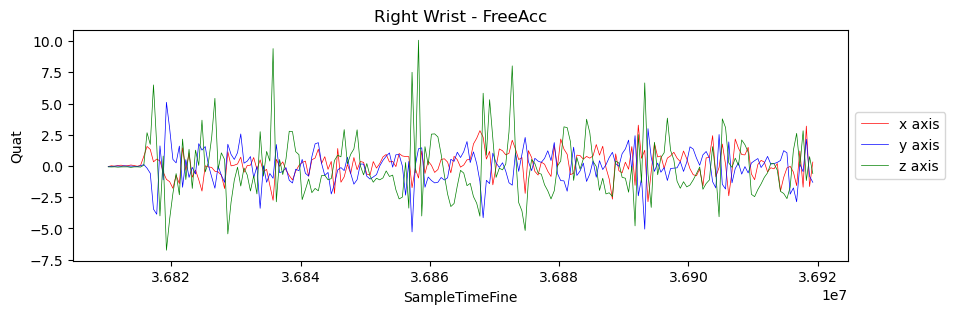

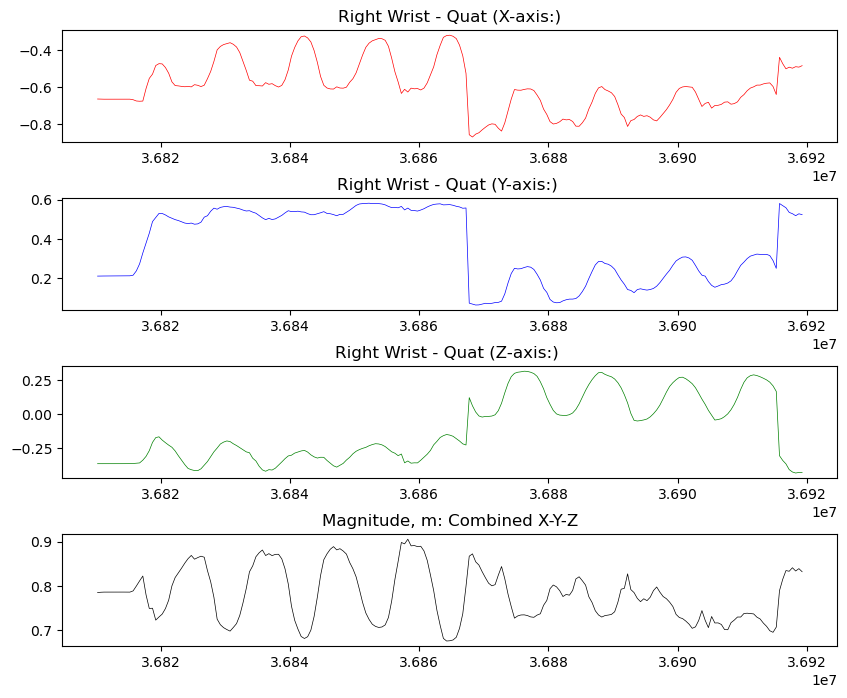

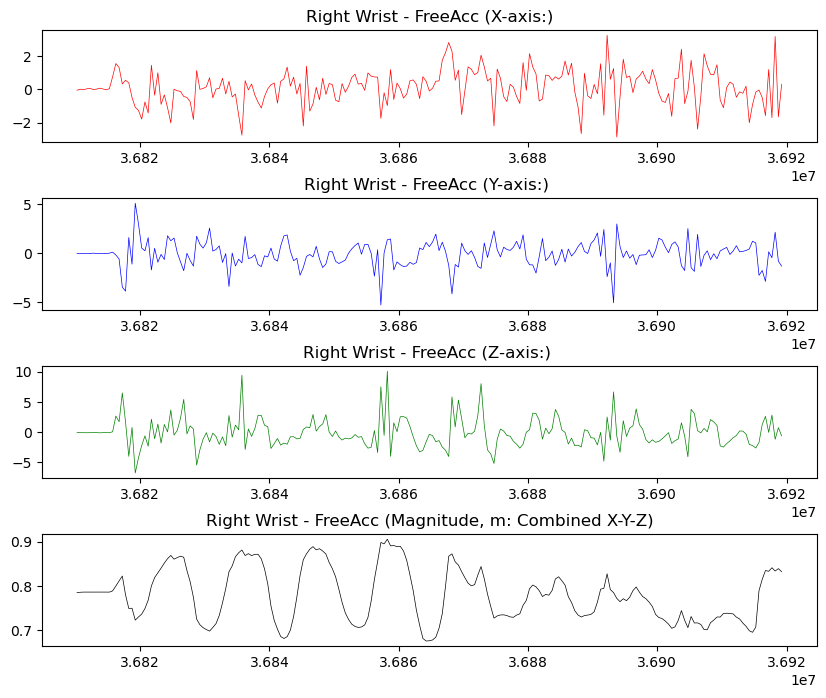

In [83]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_wrist_data['m'] = magnitude(right_wrist_data)
right_wrist_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Wrist - Quat')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Wrist - FreeAcc')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - Quat (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - Quat (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - Quat (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Magnitude, m: Combined X-Y-Z')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Wrist - FreeAcc (X-axis:)')
ax[0].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Wrist - FreeAcc (Y-axis:) ')
ax[1].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Wrist - FreeAcc (Z-axis:) ')
ax[2].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Wrist - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_wrist_data['SampleTimeFine'], right_wrist_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Elbow

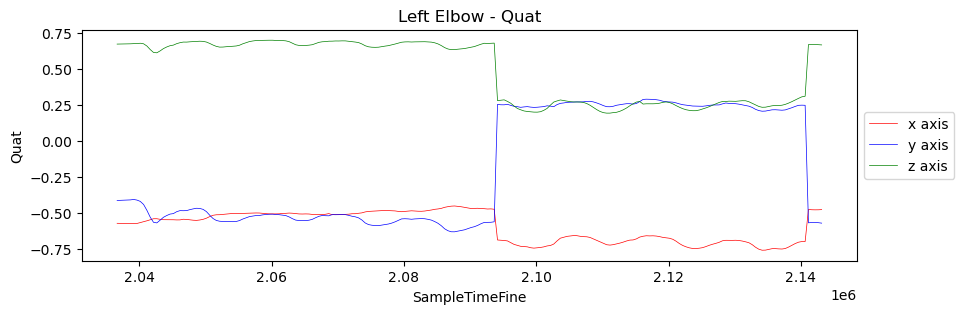

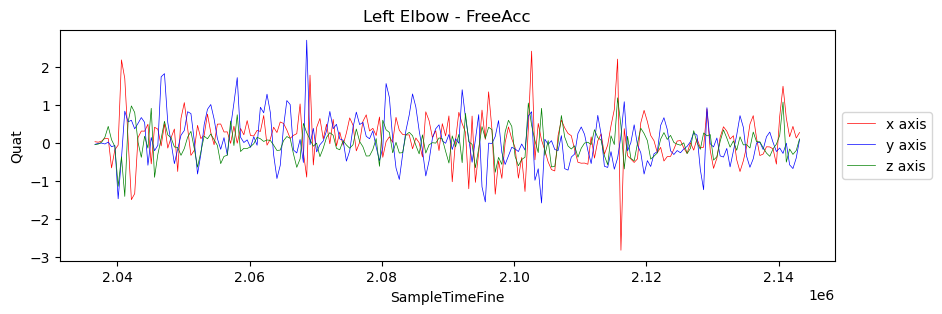

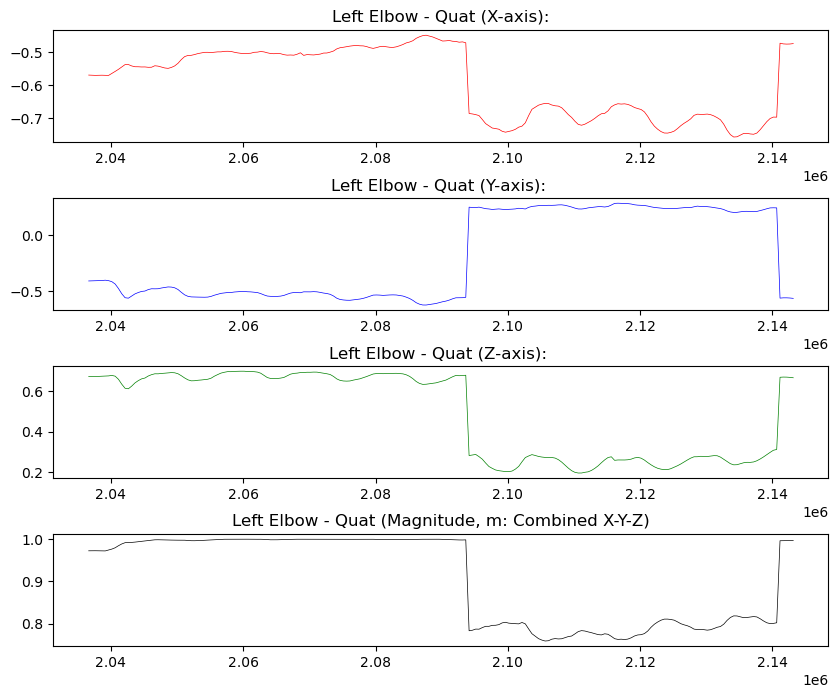

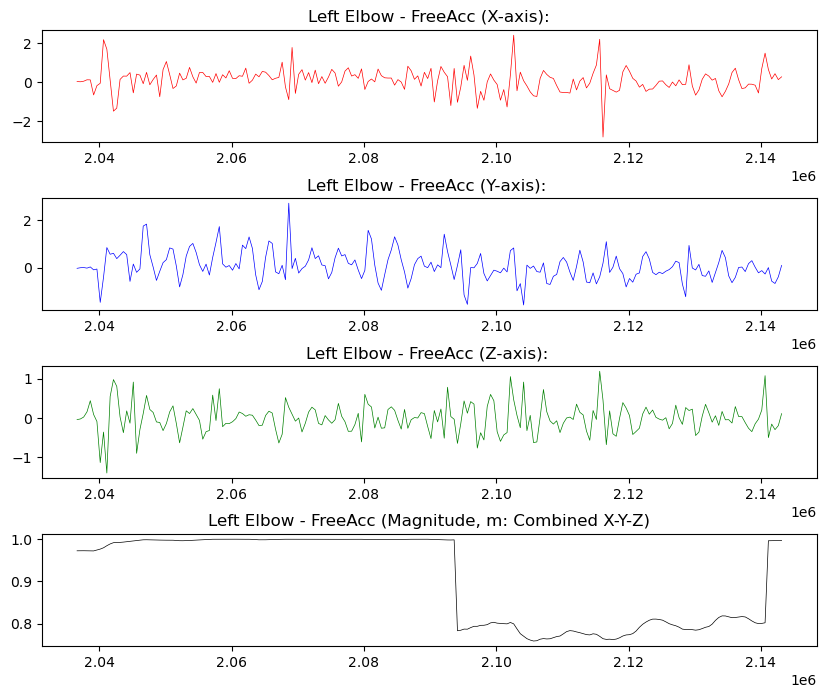

In [84]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_elbow_data['m'] = magnitude(left_elbow_data)
left_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Elbow - Quat')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Elbow - FreeAcc')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - Quat (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - Quat (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - Quat (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Elbow - FreeAcc (X-axis):')
ax[0].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Elbow - FreeAcc (Y-axis): ')
ax[1].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Elbow - FreeAcc (Z-axis): ')
ax[2].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_elbow_data['SampleTimeFine'], left_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Elbow

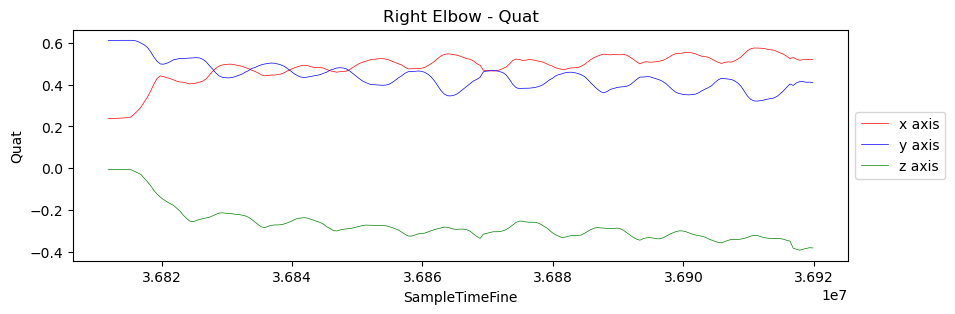

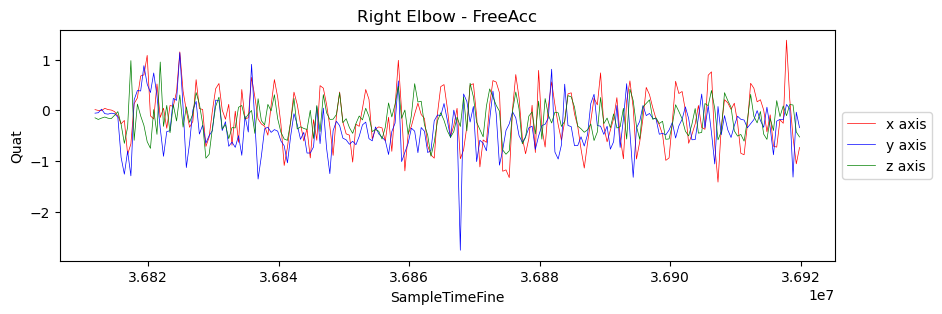

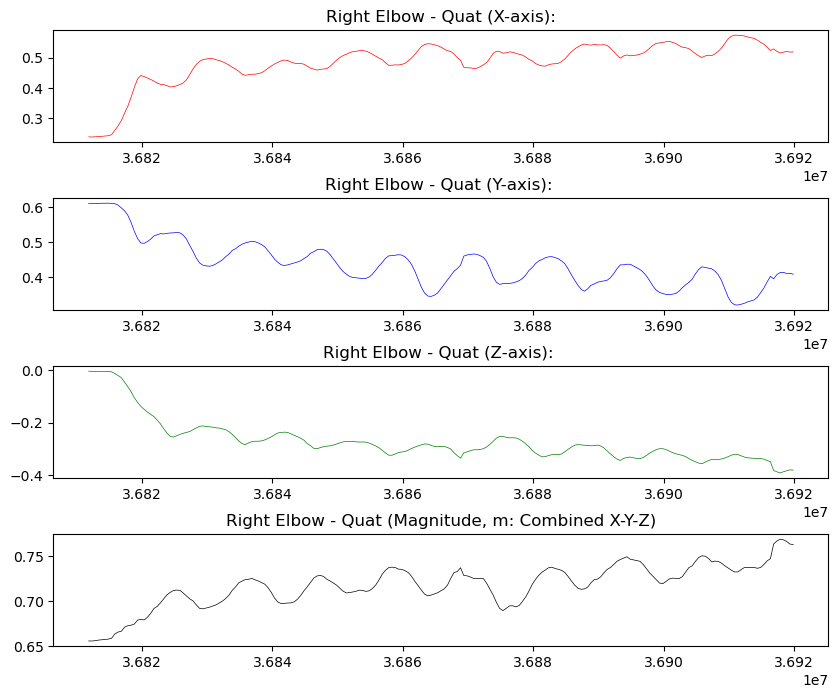

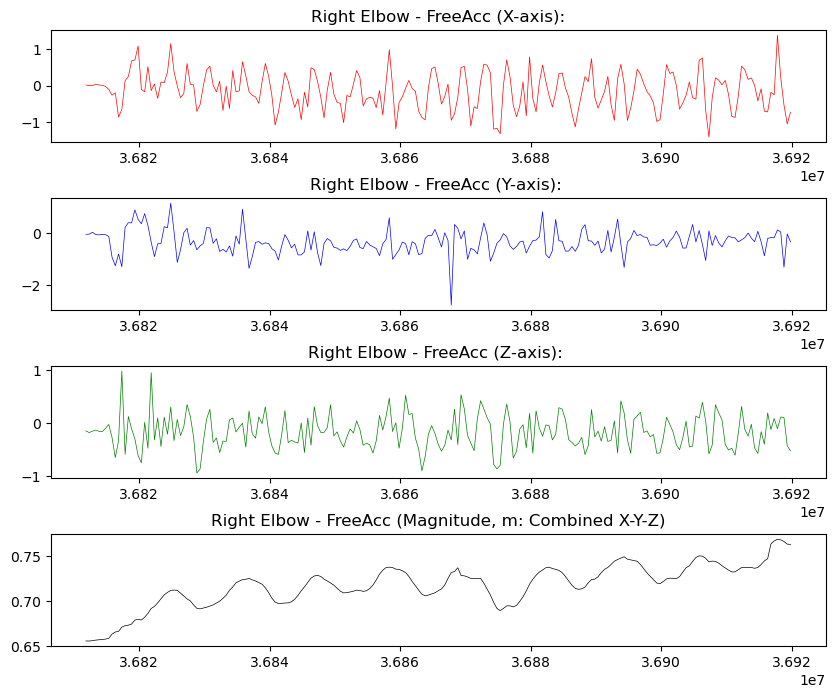

In [85]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_elbow_data['m'] = magnitude(right_elbow_data)
right_elbow_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Elbow - Quat')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Elbow - FreeAcc')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - Quat (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - Quat (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - Quat (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Elbow - FreeAcc (X-axis):')
ax[0].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Elbow - FreeAcc (Y-axis): ')
ax[1].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Elbow - FreeAcc (Z-axis): ')
ax[2].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Elbow - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_elbow_data['SampleTimeFine'], right_elbow_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Left Shoulder

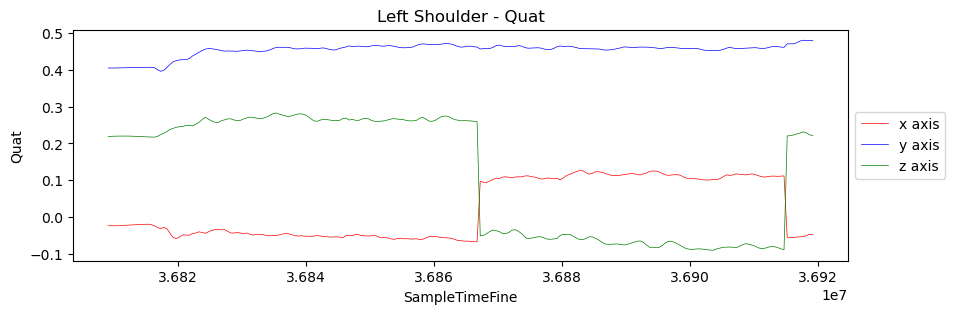

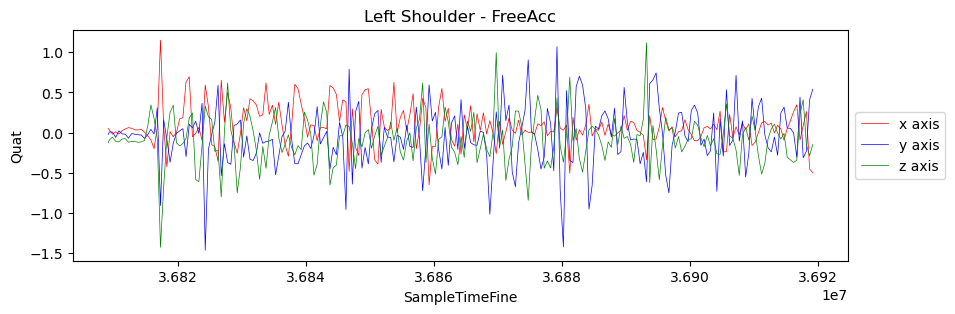

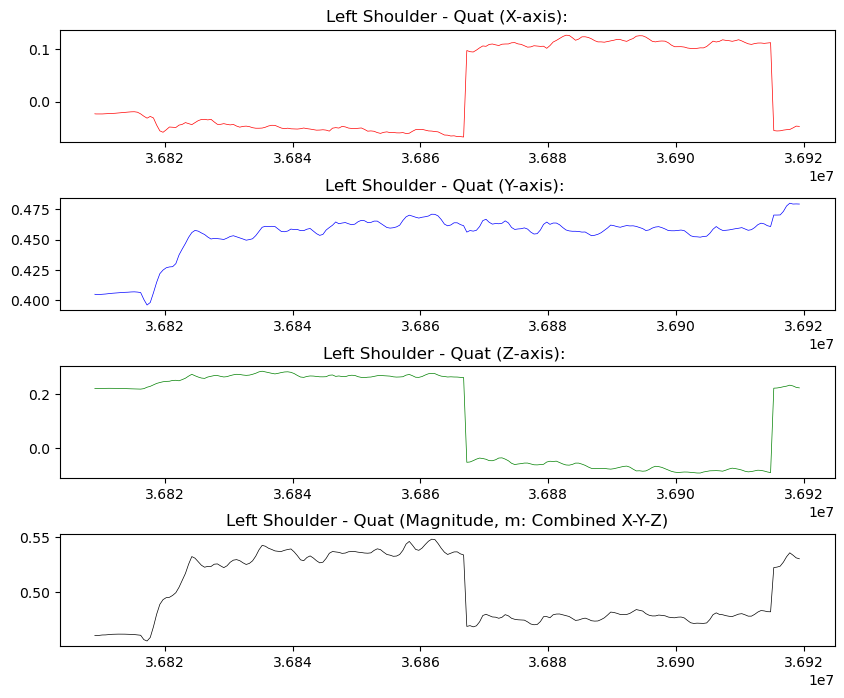

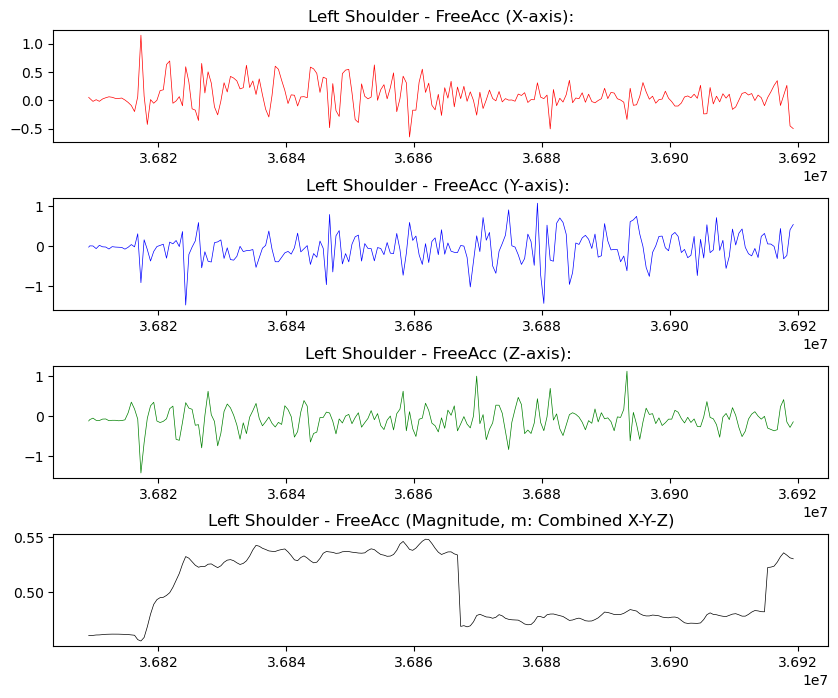

In [86]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

left_shoulder_data['m'] = magnitude(left_shoulder_data)
left_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - Quat')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Left Shoulder - FreeAcc')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - Quat (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - Quat (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - Quat (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Left Shoulder - FreeAcc (X-axis):')
ax[0].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Left Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Left Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Left Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(left_shoulder_data['SampleTimeFine'], left_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

## Right Shoulder

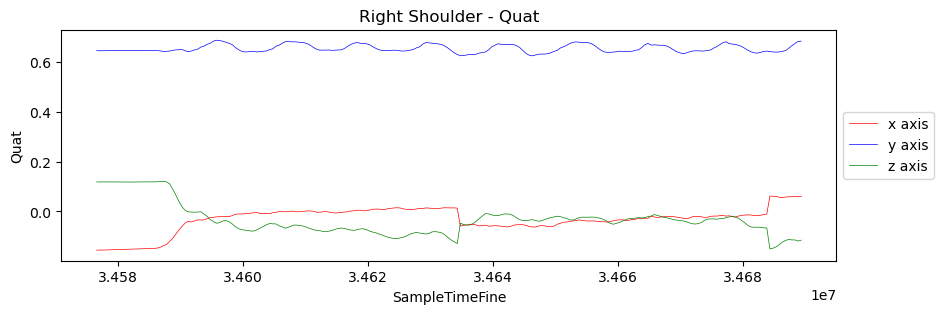

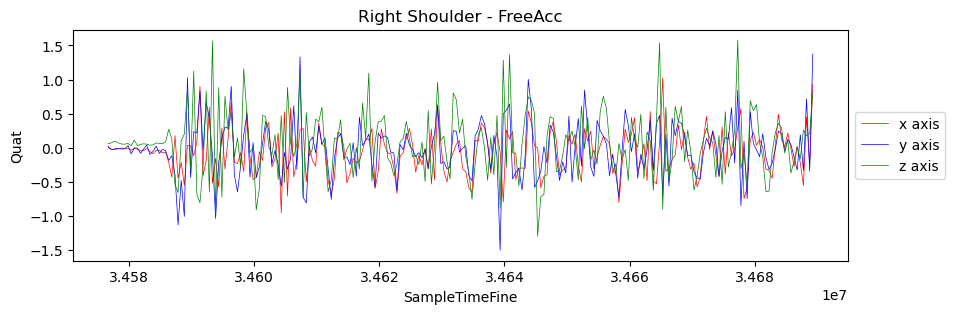

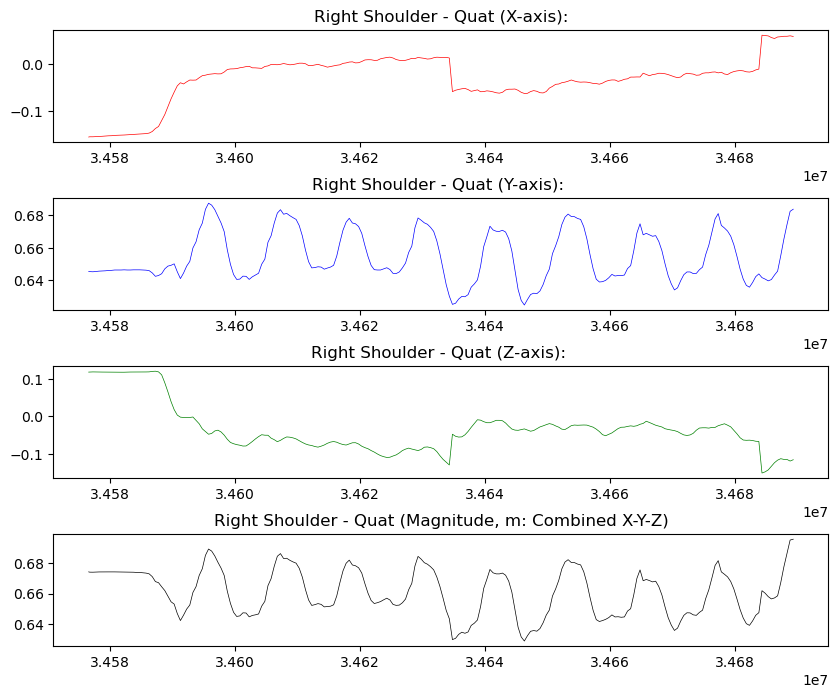

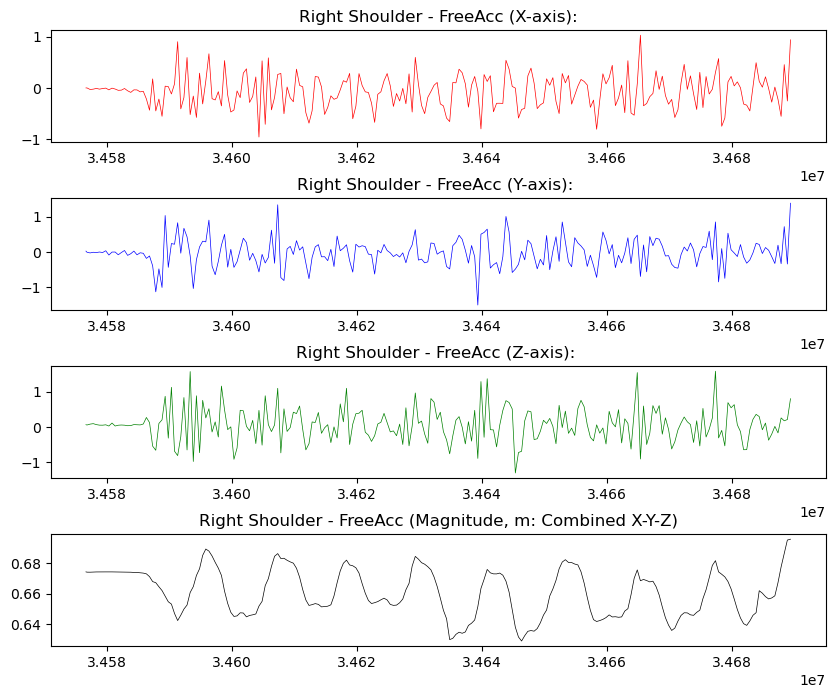

In [87]:
def magnitude(activity):
    x2 = activity['Quat_X'] * activity['Quat_X']
    y2 = activity['Quat_Y'] * activity['Quat_Y']
    z2 = activity['Quat_Z'] * activity['Quat_Z']
    m2 = x2 + y2 + z2
    m = m2.apply(lambda x: math.sqrt(x))
    return m

right_shoulder_data['m'] = magnitude(right_shoulder_data)
right_shoulder_data.head()

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - Quat')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.figure(figsize=(10,3))
plt.title('Right Shoulder - FreeAcc')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r', label='x axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b', label='y axis')
plt.plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g', label='z axis')
#plt.plot(left_wrist_data['SampleTimeFine'], left_wrist_data['Quat_W'], linewidth=0.5, color='y', label='w')
plt.xlabel('SampleTimeFine')
plt.ylabel('Quat')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - Quat (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - Quat (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - Quat (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['Quat_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - Quat (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(10,8))

ax[0].set_title('Right Shoulder - FreeAcc (X-axis):')
ax[0].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_X'], linewidth=0.5, color='r')

ax[1].set_title('Right Shoulder - FreeAcc (Y-axis): ')
ax[1].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Y'], linewidth=0.5, color='b')

ax[2].set_title('Right Shoulder - FreeAcc (Z-axis): ')
ax[2].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['FreeAcc_Z'], linewidth=0.5, color='g')

ax[3].set_title('Right Shoulder - FreeAcc (Magnitude, m: Combined X-Y-Z)')
ax[3].plot(right_shoulder_data['SampleTimeFine'], right_shoulder_data['m'], linewidth=0.5, color='k')

fig.subplots_adjust(hspace=.5)